<h1 style="margin-top:0;">Assignment 4: Major Project</h1>

**`Are Our Schools Safe? A Spatial Analysis of Flood Exposure and Socio-Economic Disadvantage in North Central Victoria`**

**Spatial Data Analytics (GEOM90006)**

**Semester 1, 2025**  
**Date:** 10 June, 2025  

**Group:** 37

___

**Table of contents**<a id='toc0_'></a>    
- [Introduction](#toc1_)    
- [Research Question](#toc2_)    
- [Hypothesis](#toc3_)    
- [Data Source and Study Area](#toc4_)    
  - [Polygon Data](#toc4_1_)    
    - [LGA Polygon Aligned to Topographic Features](#toc4_1_1_)    
      - [Study Area - North Central Victoria](#toc4_1_1_1_)    
    - [Victoria - 1 in 100 Year Flood Extent](#toc4_1_2_)    
    - [Statistical Area Level 2](#toc4_1_3_)    
  - [Point Data](#toc4_2_)    
    - [School Locations 2021](#toc4_2_1_)    
    - [Socio-Economic Indexes for SA2, AUS 2021](#toc4_2_2_)    
    - [2021 Census GCP for SA2, VIC 2021](#toc4_2_3_)    
  - [Raster Data](#toc4_3_)    
    - [VIC Elevation DEM 10m](#toc4_3_1_)    
      - [Pre-Processing](#toc4_3_1_1_)    
      - [Load DEM Raster](#toc4_3_1_2_)    
- [Exploratory Spatial Data Analysis](#toc5_)    
  - [Descriptive Statistics](#toc5_1_)    
    - [SEIFA IRSD Scores Distribution](#toc5_1_1_)    
    - [School Type Count at Each SAs](#toc5_1_2_)    
  - [Point Pattern Analysis](#toc5_2_)    
    - [School Distribution in LGAs](#toc5_2_1_)    
      - [Distance-based Methods](#toc5_2_1_1_)    
        - [Average Nearest Neighbour Analysis](#toc5_2_1_1_1_)    
        - [Ripley's K and L Functions](#toc5_2_1_1_2_)    
        - [Ripley's G and F Function](#toc5_2_1_1_3_)    
      - [Density-based methods](#toc5_2_1_2_)    
        - [Quadrat Count](#toc5_2_1_2_1_)    
        - [Kernel Density Estimation](#toc5_2_1_2_2_)    
  - [Areal Data Analysis](#toc5_3_)    
    - [Global Autocorrelation](#toc5_3_1_)    
      - [Moran’s 𝐼 Index, Geary’s 𝐶, General G-Statistic](#toc5_3_1_1_)    
    - [Local Autocorrelation](#toc5_3_2_)    
      - [Local Moran’s 𝐼 Index, Getis-Ord 𝐺𝑖 and 𝐺𝑖∗ statistics](#toc5_3_2_1_)    
  - [Raster Analysis](#toc5_4_)    
    - [Flood Risk Exposure for Schools](#toc5_4_1_)    
      - [School Elevation](#toc5_4_1_1_)    
        - [Elevation Distribution: Flood vs Non-Flood Schools](#toc5_4_1_1_1_)    
      - [Flood Exposed Govt Schools Percentage by LGAs](#toc5_4_1_2_)    
      - [Primary and Secondary School Distances to Flood](#toc5_4_1_3_)    
    - [Watershed Analysis](#toc5_4_2_)    
      - [Random Pour Point](#toc5_4_2_1_)    
      - [Drainage-Based School Flood Exposure](#toc5_4_2_2_)    
- [Geographical Weighted Regression](#toc6_)    
    - [Pre-Processing](#toc6_1_1_)    
    - [Feature Engineering](#toc6_1_2_)    
    - [Model](#toc6_1_3_)    
    - [Interpretation](#toc6_1_4_)    
    - [Result](#toc6_1_5_)    
- [Discussion](#toc7_)    
    - [Research Questions and Hypothesis](#toc7_1_1_)    
    - [Density-Based vs. Distance-Based Point Pattern Techniques](#toc7_1_2_)    
    - [Spatial Autocorrelation](#toc7_1_3_)    
    - [Vulnerability Risk Score](#toc7_1_4_)    
    - [Geographically Weighted Regression](#toc7_1_5_)    
    - [Limitation](#toc7_1_6_)    
- [Sustainability](#toc8_)    
- [Conclusion](#toc9_)    
- [References](#toc10_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

---

In [1]:
# Install Extra Packages
!pip install plotly

___

In [2]:
# Importing Required Packages

# --- General ---
import warnings
warnings.filterwarnings('ignore')

# --- System ---
import os
os.environ["USE_PYGEOS"] = "0"
os.environ['OMP_DISPLAY_ENV'] = 'FALSE'

# --- Data Analysis ---
import numpy as np
import pandas as pd

import copy

import json

from scipy.stats import skew , kurtosis
from scipy.stats import norm

# --- Geo ---
import geopandas as gpd
from geopandas import GeoDataFrame
from shapely.geometry import LineString, Point

from pysal.lib import weights

import pointpats
from pointpats import PointPattern
from pointpats import k_test, l_test
from pointpats import g_test, f_test
from pointpats import QStatistic

import rasterio
from rasterio.plot import show 
from rasterio.features import geometry_mask
from rasterio.warp import reproject, Resampling, calculate_default_transform
from rasterio.mask import mask
from rasterio.enums import Resampling
from rasterio.transform import Affine
from rasterio.features import rasterize
from rasterio.features import shapes

from shapely.geometry import shape
from shapely.geometry import mapping
from shapely.ops import nearest_points

import libpysal, esda
from esda.getisord import G
from esda.moran import Moran_Local
from esda.getisord import G_Local
from splot.esda import lisa_cluster

import richdem as rd

from scipy.ndimage import distance_transform_edt

from pysheds.grid import Grid

# --- Visualization ---
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns
import contextily as ctx
from matplotlib.lines import Line2D
from matplotlib.patches import FancyArrowPatch
import matplotlib.colors as colors

import plotly.express as px
import plotly.graph_objects as go


# --- Model ---
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
import mapclassify

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


___

# <a id='toc1_'></a>[Introduction](#toc0_)

Flooding is one of the most frequent and costly natural hazards in Victoria, with significant implications for communities and infrastructure (Reckien and Heiskanen, 2021). The 2022 flood, for instance, resulted in substantial economic and social impacts across several local government areas (LGAs), including Mitchell and Strathbogie. The report from Deloitte Access Economics (2023) estimated this flood has led to long-term economic impacts projected to reach $612 million by 2030 due to damage to community facilities and disruptions to essential services. This highlights the vulnerability of these regions to such event.

Socio-economic disadvantage further exacerbates the risks associated with flood exposure. Communities with lower socio-economic status often have limited resources to prepare for, respond to, and recover from flood events, leading to prolonged disruptions and recovery periods (Ahmad, 2018). In the context of education, schools situated in disadvantaged areas may lack the necessary infrastructure and support systems to effectively manage flood risks, thereby impacting the safety and continuity of education for students.

Elevation also plays a critical role in flood risk assessment, as lower-lying areas are more susceptible to flooding events. The study focusing on the Hawkesbury-Nepean catchment in Australia demonstrated the areas characterized by low elevation, gentle slopes, and low socio-economic status exhibited the highest levels of flood vulnerability (Schwarz and Kuleshov, 2022). Therefore, it’s essential to incorporate elevation into the analysis of flood exposure.

By analyzing elevation alongside socio-economic indicators and school locations, our study can provide valuable insights into the spatial distribution of flood risk and its intersection with social vulnerability.


# <a id='toc2_'></a>[Research Question](#toc0_)

This study aims to explore how does flood exposure and socio-economic disadvantage affect the spatial distribution and vulnerability of Government schools in North Central Victoria. By analyzing the spatial distribution of schools relative to flood-prone areas and socio-economic indicators, we seek to address the following research questions:

*1. Are Government schools disproportionately located in flood-prone zones compared to safer areas?*

*2. Is there a spatial association between flood-exposed schools and low SEIFA (disadvantaged) areas?*

*3. Are there spatial clusters of vulnerable schools?*

# <a id='toc3_'></a>[Hypothesis](#toc0_)

Based on prior literature, we anticipate that government schools in North Central Victoria are not randomly distributed with respect to environmental and social risk factors. Instead, we hypothesise that certain schools are more vulnerable due to their geographic and socio-economic contexts. These expectations are informed by studies highlighting how lower elevation areas are more prone to flooding (Schwarz & Kuleshov, 2022), and how communities with greater socio-economic disadvantage face higher risk and lower adaptive capacity in the face of natural hazards (Ahmad, 2018).


1. **Hypothesis 1:** *Government schools are disproportionately located in flood-prone zones compared to safer areas.* <br>


2. **Hypothesis 2:** *Flood-exposed schools are more likely to be located in areas of socio-economic disadvantage.*<br>


3. **Hypothesis 3:** *There are spatial clusters or hotspots where flood-exposed and/or disadvantaged schools are concentrated.*<br>





___

# <a id='toc4_'></a>[Data Source and Study Area](#toc0_)

To conduct the spatial analysis, we utilized a diverse set of geospatial and tabular datasets, in the types of point, polygon, and raster. All dataset were reprojected to EPSG:7845 to match the cooridnate referene system used throught the project.Point data included the 2021 School Locations dataset from the Victorian Department of Education, which provided geocoded locations and school types across the state. Socio-economic parameters were captured using the Socio-Economic Indexes for Areas (SEIFA) from the Australian Bureau of Statistics. Specifically, the Index of Relative Socio-economic Disadvantage (IRSD) was used as one of the parameters in our analysis. 

To supplement this, we also incorporated 2021 Census data on student enrolment at government schools by Statistical Area Level 2 (SA2), in order to analyze population-weighted exposure. Polygon data comprised the Vicmap Local Government Area (LGA) boundaries, which defined the spatial units for our regional focus, and the 1-in-100-year flood extent polygon layer, delineating high-risk flood-prone zones across Victoria. 

Finally, elevation patterns were assessed using the Vicmap Elevation Digital Elevation Model (DEM) at 10m resolution. This is a raster dataset that provided fine-grained topographical context for flood risk evaluation. These datasets collectively supported both the exploratory and inferential components of our spatial analysis.

Before analysis, each dataset underwent preprocessing and filtering to ensure consistency and geographic relevance to the study area. Missing value was handled. All spatial layers were reprojected to EPSG:7845 to allow for accurate overlay and measurement.


In [3]:
# Path to the data directory

## Point Data Paths

### School Locations 2021
slPath = 'Data/Point/School Locations 2021/dv309_schoollocations2021.csv'

### Socio-Economic Indexes for Areas (SEIFA), Australia
seifaPath = 'Data/Point/SEIFA Australia/SEIFA.xlsx'

### 2021 Census General Community Profile Statistical Area 2 for Victoria; G15 type of education institution attending (full-time/part-time student status by age) by sex
cenPath = 'Data/Point/2021 Census SA2/2021Census_G15_VIC_SA2.csv'

## Polygon Data Paths

### Vicmap Admin - Local Government Area Polygon Aligned to Topographic Features
lgaPath = 'Data/Polygon/LGA/Victoria/AD_LGA_AREA_POLYGON.shp'

### Victoria - 1 in 100 Year Flood Extent
floodPath = 'Data/Polygon/VIC Flood/extent_100y_ari.shp'

## Raster Data Paths

### Vicmap Elevation DEM 10m
demPath = 'Data/Raster/Elevation/vmelev_dem10m_Geotiff_GDA94_Vicgrid.tif'

## <a id='toc4_1_'></a>[Polygon Data](#toc0_)

### <a id='toc4_1_1_'></a>[LGA Polygon Aligned to Topographic Features](#toc0_)

We selected the Vicmap Admin - Local Government Area (LGA) Polygon Aligned to Topographic Features dataset[2] rather than the alternative property-aligned LGA, because our research questions are more closely aligned with natural features (such as floodplains, elevation, and catchments) than cadastral (property boundary) delineations.

The topographic alignment provides polygon boundaries that follow natural terrain contours and hydrological features. This is especially important for identifying flood-prone areas in flood exposure analysis and ensures spatial coherence when overlaying environmental datasets such as digital elevation models (DEMs). 

Therefore, we assume LGA boundaries aligned to topographic features are more appropriate for regional-scale environmental analysis and yield spatially meaningful results when intersected with raster data.


In [4]:
vicGDF = gpd.read_file(lgaPath).to_crs(epsg=7845)
vicGDF = vicGDF[vicGDF['STATE'] == "VIC"]

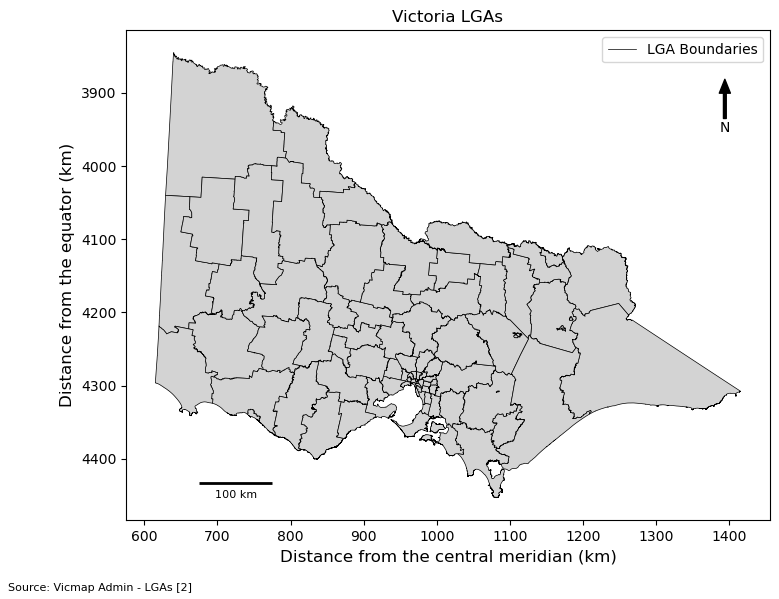

In [5]:
# --- Map of Victoria LGAs ---

fig, ax = plt.subplots(figsize=(8, 6))

# Border
vicGDF.plot(ax=ax, edgecolor='black', facecolor='lightgrey', linewidth=0.5)

# Orientation
ax.annotate('N', xy=(0.93, 0.90), xytext=(0.93, 0.8),
            arrowprops=dict(facecolor='black', width=2, headwidth=8, headlength=10),
            ha='center', va='center', fontsize=10, xycoords='axes fraction')

# Legend
ax.plot([], [], '', label="LGA Boundaries", color='black', linewidth=0.5)
ax.legend(loc='upper right', fontsize=10)

# Title and Labels
ax.set_title("Victoria LGAs", fontsize=12)
ax.set_xlabel("Distance from the central meridian (km)", fontsize=12)
ax.set_ylabel("Distance from the equator (km)", fontsize=12)

# Scale Bar
sclX = ax.get_xlim()[0] + 100_000
sclY = ax.get_ylim()[0] + 50_000
ax.hlines(y=sclY, xmin=sclX, xmax=sclX + 100_000, colors='black', linewidth=2)
ax.text(s='100 km', x=sclX + 50_000, y=sclY - 20_000, ha='center', fontsize=8)

# Source
ax.annotate("Source: Vicmap Admin - LGAs [2]", 
            xy=(0.01, 0.01), xycoords='figure fraction', fontsize=8, ha='left', va='bottom')

ax.xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f"{x / 1000:.0f}"))
ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda y, _: f"{abs(y) / 1000:.0f}"))

plt.tight_layout()
plt.show()


> **Map Interpretation**
>
> The map  presents the Local Government Areas (LGAs) of Victoria using the Vicmap topographically aligned dataset. Each LGA is represented by a grey polygon with black borders. The coordinate is labeled in kilometres from the central meridian and the equator (as per the VicGrid projection).
> 
> This map serves as a foundation for defining our study area. These LGAs will later be highlighted and overlaid with datasets on school locations, flood extents, and socio-economic indicators to investigate patterns of environmental vulnerability.


#### <a id='toc4_1_1_1_'></a>[Study Area - North Central Victoria](#toc0_)


The selected study area comprises five Local Government Areas (LGAs) in North Central Victoria, namely **Mitchell, Campaspe, Greater Bendigo, Greater Shepparton**, and **Strathbogie**. These LGAs were chosen for three key reasons: 
1. They were among the regions significantly impacted by the 2022 Victorian flood, making them relevant for a flood vulnerability analysis.
2. These LGAs are in diverse socio-economic conditions according to SEIFA scores. A spatial comparisons between more and less disadvantaged areas in relation to environmental exposure can be made. 
3. These LGAs exhibit differences in population density, school distribution, and elevation variability. 

The heterogeneity allows us to explore spatial relationships between natural hazard risk, school distribution, and socio-economic disadvantage to address broader regional planning challenges across Victoria.

In [6]:
targetLGA = ['MITCHELL', 'CAMPASPE', 'GREATER BENDIGO', 'GREATER SHEPPARTON', 'STRATHBOGIE']
lgaGDF = vicGDF[vicGDF["NAME"].isin(targetLGA)]
lgaGDF = lgaGDF.rename(columns={'OFFICIALNM': 'LGA Name'})

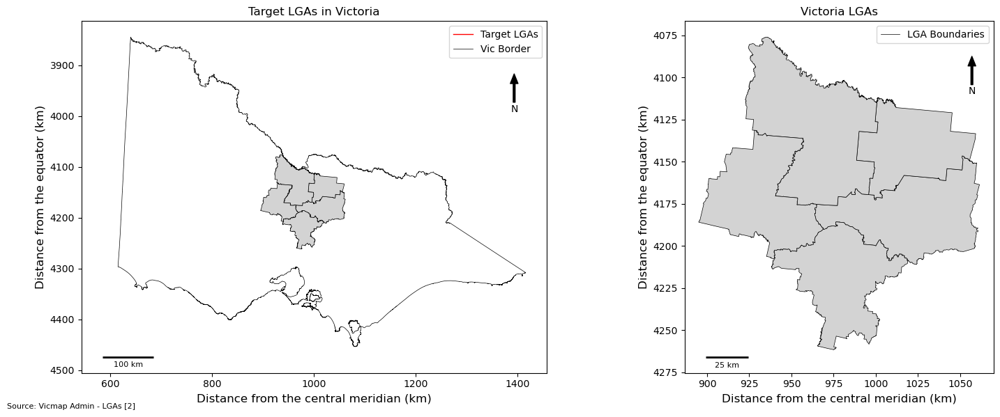

In [7]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

vicGDF.dissolve().boundary.plot(ax=ax1, edgecolor='black', linewidth=0.5)
lgaGDF.plot(ax=ax1, facecolor='lightgrey', edgecolor='black', linewidth=0.5)

# Orientation
ax1.annotate('N', xy=(0.93, 0.85), xytext=(0.93, 0.75),
             arrowprops=dict(facecolor='black', width=2, headwidth=8, headlength=10),
             ha='center', va='center', fontsize=10, xycoords='axes fraction')

# Legend
ax1.plot([], [], color='red', label="Target LGAs", linewidth=1)
ax1.plot([], [], color='black', label="Vic Border", linewidth=0.5)
ax1.legend(loc='upper right', fontsize=10)

# Title and labels
ax1.set_title("Target LGAs in Victoria", fontsize=12)
ax1.set_xlabel("Distance from the central meridian (km)", fontsize=12)
ax1.set_ylabel("Distance from the equator (km)", fontsize=12)

# Scale Bar
sclX1 = ax1.get_xlim()[0] + 10_000
sclY1 = ax1.get_ylim()[0] + 10_000
ax1.hlines(y=sclY1, xmin=sclX1, xmax=sclX1 + 100_000, colors='black', linewidth=2)
ax1.text(x=sclX1 + 50_000, y=sclY1 - 20_000, s='100 km', ha='center', fontsize=8)

# Axis formatting
ax1.xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f"{x / 1000:.0f}"))
ax1.yaxis.set_major_formatter(mtick.FuncFormatter(lambda y, _: f"{abs(y) / 1000:.0f}"))

# Border
lgaGDF.plot(ax=ax2, edgecolor='black', facecolor='lightgrey', linewidth=0.5)

# Orientation
ax2.annotate('N', xy=(0.93, 0.90), xytext=(0.93, 0.8),
             arrowprops=dict(facecolor='black', width=2, headwidth=8, headlength=10),
             ha='center', va='center', fontsize=10, xycoords='axes fraction')

# Legend
ax2.plot([], [], '', label="LGA Boundaries", color='black', linewidth=0.5)
ax2.legend(loc='upper right', fontsize=10)

# Title and labels
ax2.set_title("Victoria LGAs", fontsize=12)
ax2.set_xlabel("Distance from the central meridian (km)", fontsize=12)
ax2.set_ylabel("Distance from the equator (km)", fontsize=12)

# Scale Bar
sclX = ax2.get_xlim()[0] + 12_500
sclY = ax2.get_ylim()[0] + 5_000
ax2.hlines(y=sclY, xmin=sclX, xmax=sclX + 25_000, colors='black', linewidth=2)
ax2.text(s='25 km', x=sclX + 12_500, y=sclY - 6_500, ha='center', fontsize=8)

# Source annotation
fig.text(0.01, 0.01, "Source: Vicmap Admin - LGAs [2]", fontsize=8, ha='left', va='bottom')

# Axis formatting
ax2.xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f"{x / 1000:.0f}"))
ax2.yaxis.set_major_formatter(mtick.FuncFormatter(lambda y, _: f"{abs(y) / 1000:.0f}"))

plt.tight_layout()
plt.show()



> **Map Interpretation**
>
> The shaded polygons represent the 5 LGAs we selected as study area: Mitchell, Campaspe, Greater Bendigo, Greater Shepparton, and Strathbogie.

### <a id='toc4_1_2_'></a>[Victoria - 1 in 100 Year Flood Extent](#toc0_)

The 100-year flood extent polygon dataset[4] was critical for identifying which schools are in flood-prone zones. We selected the “Victoria – 1 in 100 Year Flood Extent” layer, which maps areas projected to flood in a 1% Annual Exceedance Probability (100-year return period) event.

By using this dataset, we assume it reliably captures the flood-prone areas in our study region. Key assumptions include:
1. The flood model data is accurate in location and extent of flood zones, (given it’s derived from hydrological models and historical data).
2. Using the 100-year ARI flood as our definition of “flood-prone” is appropriate for assessing school safety. 

We acknowledge some uncertainty in the flood polygons’ precision as the metadata notes a positional accuracy of about 5–100 m for older parts of the data

In [8]:
if False:
    floodGDF = gpd.read_file(floodPath).to_crs(epsg=7845)

    floodGDF = gpd.clip(floodGDF, vicGDF.dissolve())

In [9]:
if False:
    floodGDF.to_file('Data/Polygon/VIC Flood/lgaFlood.gpkg', layer='flood', driver='GPKG')

In [10]:
floodGDF = gpd.read_file('Data/Polygon/VIC Flood/lgaFlood.gpkg', layer='flood')
floodLGA = gpd.clip(floodGDF, lgaGDF)

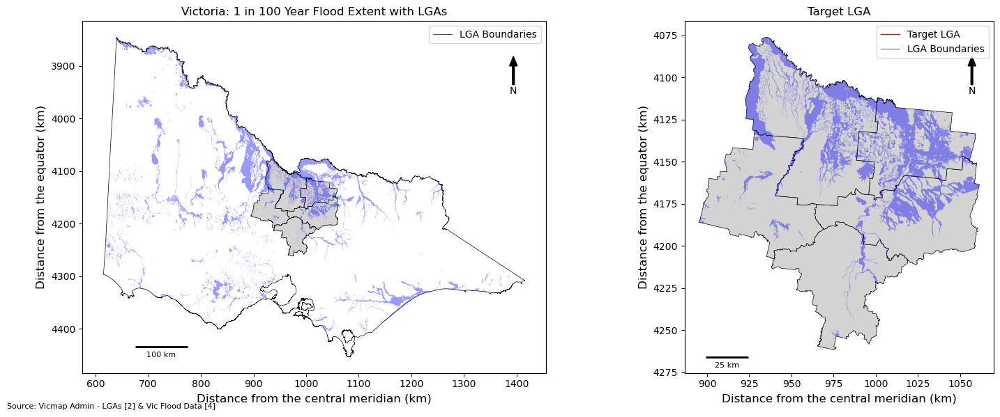

In [11]:
# --- Flood Extent Overview (Victoria vs. Study Area) ---

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

vicGDF.dissolve().boundary.plot(ax=ax1, edgecolor='black', linewidth=0.5)
lgaGDF.plot(ax=ax1, facecolor='lightgrey', edgecolor='black', linewidth=0.5)
floodGDF.plot(ax=ax1, color='blue', alpha=0.4, label='1 in 100 Year Flood Extent')

# Orientation
ax1.annotate('N', xy=(0.93, 0.90), xytext=(0.93, 0.8),
             arrowprops=dict(facecolor='black', width=2, headwidth=8, headlength=10),
             ha='center', va='center', fontsize=10, xycoords='axes fraction')

# Legend
ax1.plot([], [], '', label="LGA Boundaries", color='black', linewidth=0.5)
ax1.legend(loc='upper right', fontsize=10)

# Title and labels
ax1.set_title("Victoria: 1 in 100 Year Flood Extent with LGAs", fontsize=12)
ax1.set_xlabel("Distance from the central meridian (km)", fontsize=12)
ax1.set_ylabel("Distance from the equator (km)", fontsize=12)

# Scale bar
sclX1 = ax1.get_xlim()[0] + 100_000
sclY1 = ax1.get_ylim()[0] + 50_000
ax1.hlines(y=sclY1, xmin=sclX1, xmax=sclX1 + 100_000, colors='black', linewidth=2)
ax1.text(s='100 km', x=sclX1 + 50_000, y=sclY1 - 20_000, ha='center', fontsize=8)

# Axis formatting
ax1.xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f"{x / 1000:.0f}"))
ax1.yaxis.set_major_formatter(mtick.FuncFormatter(lambda y, _: f"{abs(y) / 1000:.0f}"))


lgaGDF.plot(ax=ax2, facecolor='lightgrey', edgecolor='black', linewidth=0.5)
floodLGA.plot(ax=ax2, color='blue', alpha=0.4, label='1 in 100 Year Flood Extent')

# Orientation
ax2.annotate('N', xy=(0.93, 0.90), xytext=(0.93, 0.8),
             arrowprops=dict(facecolor='black', width=2, headwidth=8, headlength=10),
             ha='center', va='center', fontsize=10, xycoords='axes fraction')

# Legend
ax2.plot([], [], color='red', label="Target LGA", linewidth=1)
ax2.plot([], [], color='black', label="LGA Boundaries", linewidth=0.5)
ax2.legend(loc='upper right', fontsize=10)

# Title and labels
ax2.set_title("Target LGA", fontsize=12)
ax2.set_xlabel("Distance from the central meridian (km)", fontsize=12)
ax2.set_ylabel("Distance from the equator (km)", fontsize=12)

# Scale Bar
sclX2 = ax2.get_xlim()[0] + 12_500
sclY2 = ax2.get_ylim()[0] + 5_000
ax2.hlines(y=sclY2, xmin=sclX2, xmax=sclX2 + 25_000, colors='black', linewidth=2)
ax2.text(s='25 km', x=sclX2 + 12_500, y=sclY2 - 6_500, ha='center', fontsize=8)

# Axis formatting
ax2.xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f"{x / 1000:.0f}"))
ax2.yaxis.set_major_formatter(mtick.FuncFormatter(lambda y, _: f"{abs(y) / 1000:.0f}"))

# Source annotation
fig.text(0.01, 0.01, "Source: Vicmap Admin - LGAs [2] & Vic Flood Data [4]", fontsize=8, ha='left', va='bottom')

plt.tight_layout()
plt.show()



> **Map Interpretation**
>
> The figure above presents a two-panel map showing the spatial distribution of 1-in-100-year flood extents across Victoria, with a specific focus on our target LGAs in North Central Victoria.
>
> On the left panel, the blue shaded areas represent regions vulnerable to 1-in-100-year flooding. Our selected LGAs are highlighted in grey. From this statewide view, it is evident that significant portions of North Central Victoria lie within flood-prone zones, particularly in the northern and northeastern parts of the state where terrain is flatter and river networks are more extensive (NCCMA, 2018).
>
> The right panel zooms in on the five target LGAs. This detailed view reveals that each LGA has flood-prone corridors, typically aligned with major river systems such as the Goulburn and Campaspe Rivers (NCCMA, 2018). This implies the physical spread of flood risk could harm community safety, especially where flood zones intersect with populated areas like schools. By intersecting school location data with the mapped flood extent, we can identify which schools are potentially exposed to flood risk.


### <a id='toc4_1_3_'></a>[Statistical Area Level 2](#toc0_)

In this step, we identify the SA2 regions that fall within each LGA in the study area as SEIFA scores and census data are reported at the SA2 level, whereas our primary units of analysis (e.g., flood exposure, school counts) are aggregated at the LGA level. 

First, we reproject the dataset to EPSG:7845. After filtering for only Victorian SA2s, each SA2 polygon is clipped to the corresponding LGA boundary. The result is a new GeoDataFrame, `sa2LGA`, which assigns each SA2 polygon a corresponding `LGA Name` based on its spatial location.



In [12]:
# Load and reproject SA2 shapefile
sa2Path = 'Data/Polygon/SA2/SA2_2021_AUST_GDA2020.shp'
sa2GDF = gpd.read_file(sa2Path).to_crs(epsg=7845)

# Select relevant columns 
sa2GDF = sa2GDF[['SA2_CODE21', 'SA2_NAME21', 'AREASQKM21', 'STE_NAME21', 'geometry']].iloc[:-3, :].copy()
sa2GDF = sa2GDF.rename(columns={
    'SA2_CODE21': 'SA2 Code',
    'SA2_NAME21': 'SA2 Name',
    'AREASQKM21': 'Area',
    'STE_NAME21': 'State'
})

# Filter only Victorian SA2s
sa2GDF = sa2GDF[sa2GDF["State"] == "Victoria"].iloc[:-2, :]

sa2GDF['SA2 Code'] = sa2GDF['SA2 Code'].astype(int)

sa2GDF.head()

,SA2 Code,SA2 Name,Area,State,geometry
644,201011001,Alfredton,52.7109,Victoria,"POLYGON ((867612.505 -4258484.096, 865228.817 ..."
645,201011002,Ballarat,12.3787,Victoria,"POLYGON ((870905.748 -4257528.895, 870692.487 ..."
646,201011005,Buninyong,51.5855,Victoria,"POLYGON ((872394.158 -4264374.277, 872398.991 ..."
647,201011006,Delacombe,34.1607,Victoria,"POLYGON ((864539.767 -4260989.361, 864534.921 ..."
648,201011007,Smythes Creek,104.7274,Victoria,"POLYGON ((862709.809 -4264443.168, 862696.336 ..."


In [13]:
sa2 = {
    lgaName: gpd.clip(sa2GDF, lgaPoly)
    for lgaName, lgaPoly
    in lgaGDF.set_index('LGA Name').geometry.items()
}

sa2LGA = gpd.GeoDataFrame(
    pd.concat(
        [gdf.assign(**{'LGA Name': lga}) for lga, gdf in sa2.items()],
        ignore_index=True
    ),
    crs=sa2GDF.crs
)

sa2LGA.head()

,SA2 Code,SA2 Name,Area,State,geometry,LGA Name
0,204011054,Alexandra,2118.9554,Victoria,"MULTIPOLYGON (((1026991.773 -4207812.382, 1026...",STRATHBOGIE SHIRE
1,204011057,Mansfield (Vic.),3927.8774,Victoria,"MULTIPOLYGON (((1036457.832 -4202621.652, 1036...",STRATHBOGIE SHIRE
2,204011062,Yea,1474.2972,Victoria,"MULTIPOLYGON (((1018345.888 -4208373.157, 1018...",STRATHBOGIE SHIRE
3,204011055,Euroa,2057.9046,Victoria,"POLYGON ((1013016.888 -4164093.610, 1013058.59...",STRATHBOGIE SHIRE
4,204011058,Nagambie,1294.3498,Victoria,"POLYGON ((977288.001 -4175151.548, 977323.762 ...",STRATHBOGIE SHIRE


## <a id='toc4_2_'></a>[Point Data](#toc0_)

### <a id='toc4_2_1_'></a>[School Locations 2021](#toc0_)

The school locations (2021) dataset[1] provides the geographic coordinates and attributes of all schools in Victoria. We chose this dataset because it contains the location of every primary and secondary school. 

Since the study specifically investigates government schools, we filtered by `Education_Sector` to select only `Government`. The reason for choosing government schools is that these schools are generally open to all in the local community, unlike selective or private school. We treat government schools as our population of interest, including both primary and secondary schools, so we filtered by`School_Type` to select both `Primary` and `Secondary`. We then filtered by state, selecting schools in Victoria.

School location is originally a point. To be safe, we buffered each school location by 250m. In doing so, the possibility that flood mapping might not capture very local inundation extents were considered. A new variable `inFlood` was defined to determine whether a school is in the flood zone. If the buffer zone intersects the flood extent polygon, `inFlood` is TRUE. The first research question “Are Government schools disproportionately located in flood-prone zones?” can be addressed by counting how many of the government schools in the study area are flagged as `inFlood`.

Key assumption includes:
1. Government schools in the data are correctly identified and that excluding others does not omit any that might be needed.
2. The LGA-defined region covers all the schools we consider “North Central Victoria”.
3. A school within 250 m of the flood zone should be considered at risk

In [14]:
slDF = pd.read_csv(slPath, encoding='windows-1252')

# Choosig only Government Primary and Secondary Schools
slDF = slDF[
    (slDF['Education_Sector'] == 'Government') & 
    ((slDF['School_Type'] == 'Primary') | (slDF['School_Type'] == 'Secondary')) &
    (slDF['Address_State'] == 'VIC')
][["School_Name", "School_Type", "Education_Sector", "LGA_Name", "X", "Y"]]

slDF.columns = ['School Name', 'School Type', 'Sector', 'LGA Name', 'Longitude', 'Latitude']

slDF.head()

,School Name,School Type,Sector,LGA Name,Longitude,Latitude
0,Alberton Primary School,Primary,Government,Wellington (S),146.666601,-38.617713
1,Allansford and District Primary School,Primary,Government,Warrnambool (C),142.590393,-38.386281
2,Avoca Primary School,Primary,Government,Pyrenees (S),143.475649,-37.084502
3,Avenel Primary School,Primary,Government,Strathbogie (S),145.234722,-36.901368
4,Warrandyte Primary School,Primary,Government,Manningham (C),145.213980,-37.742675


In [15]:
# Reprojected to GDA2020 / MGA Zone 55 (suitable for Victoria)
slGDF = gpd.GeoDataFrame(
    slDF,
    geometry=gpd.points_from_xy(slDF.Longitude, slDF.Latitude),
    crs="EPSG:4326"                                          
).to_crs(epsg=7845)

In [16]:
# Clip all school locations to target LGAs
slLGA = gpd.clip(slGDF, lgaGDF)

# Create a 250m buffer around each school
slLGA['inFlood'] = slLGA.buffer(250).intersects(floodLGA.unary_union)

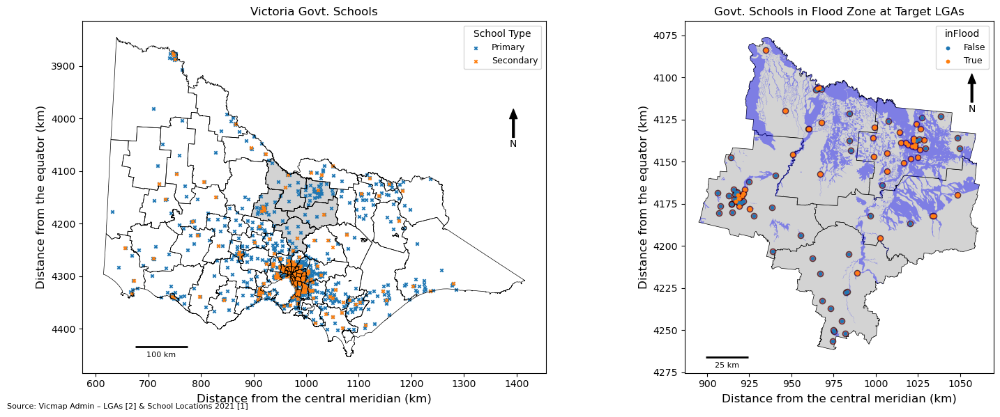

In [17]:
# --- Plot Schools within Flood Zones --- 

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Subplot 1
vicGDF.boundary.plot(ax=ax1, edgecolor='black', linewidth=0.5)
lgaGDF.plot(ax=ax1, facecolor='lightgrey', edgecolor='black', linewidth=0.5)

for type, group in slGDF.groupby('School Type'):
    group.plot(ax=ax1, marker='x', markersize=10, label=type, linestyle='None')

# Orientation
ax1.annotate('N', xy=(0.93, 0.75), xytext=(0.93, 0.65),
             arrowprops=dict(facecolor='black', width=2, headwidth=8, headlength=10),
             ha='center', va='center', fontsize=10, xycoords='axes fraction')

# Legend
ax1.legend(title="School Type", loc='upper right', fontsize=9, title_fontsize=10)

# Title and Labels
ax1.set_title("Victoria Govt. Schools", fontsize=12)
ax1.set_xlabel("Distance from the central meridian (km)", fontsize=12)
ax1.set_ylabel("Distance from the equator (km)", fontsize=12)

# Scale Bar
sclX1 = ax1.get_xlim()[0] + 100_000
sclY1 = ax1.get_ylim()[0] + 50_000
ax1.hlines(y=sclY1, xmin=sclX1, xmax=sclX1 + 100_000, colors='black', linewidth=2)
ax1.text(s='100 km', x=sclX1 + 50_000, y=sclY1 - 20_000, ha='center', fontsize=8)

# Axis Formatting
ax1.xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f"{x / 1000:.0f}"))
ax1.yaxis.set_major_formatter(mtick.FuncFormatter(lambda y, _: f"{abs(y) / 1000:.0f}"))

# Subplot 2
lgaGDF.plot(ax=ax2, facecolor='lightgrey', edgecolor='black', linewidth=0.5)
slLGA.plot(ax=ax2, facecolor='red', edgecolor='black', linewidth=1, alpha=0.6)
floodLGA.plot(ax=ax2, color='blue', alpha=0.4, label='1 in 100 Year Flood Extent')

for type, group in slLGA.groupby('inFlood'):
    group.plot(ax=ax2, markersize=10, label=type, linestyle='None')

# Orientation
ax2.annotate('N', xy=(0.93, 0.85), xytext=(0.93, 0.75),
             arrowprops=dict(facecolor='black', width=2, headwidth=8, headlength=10),
             ha='center', va='center', fontsize=10, xycoords='axes fraction')

# Legend
ax2.legend(title="inFlood", loc='upper right', fontsize=9, title_fontsize=10)

# Title and Labels
ax2.set_title("Govt. Schools in Flood Zone at Target LGAs", fontsize=12)
ax2.set_xlabel("Distance from the central meridian (km)", fontsize=12)
ax2.set_ylabel("Distance from the equator (km)", fontsize=12)

# Scale Bar
sclX2 = ax2.get_xlim()[0] + 12_500
sclY2 = ax2.get_ylim()[0] + 5_000
ax2.hlines(y=sclY2, xmin=sclX2, xmax=sclX2 + 25_000, colors='black', linewidth=2)
ax2.text(s='25 km', x=sclX2 + 12_500, y=sclY2 - 6_500, ha='center', fontsize=8)

# Axis Formatting
ax2.xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f"{x / 1000:.0f}"))
ax2.yaxis.set_major_formatter(mtick.FuncFormatter(lambda y, _: f"{abs(y) / 1000:.0f}"))

# Source Annotation
fig.text(0.01, 0.01, "Source: Vicmap Admin – LGAs [2] & School Locations 2021 [1]", 
         fontsize=8, ha='left', va='bottom')

plt.tight_layout()
plt.show()


> **Map Interpretation**
>
> This map quantifies potential flood exposure by identifying schools flagged as `inFlood = TRUE`.
>
> The left panel shows the location of all government schools in Victoria, classified by type as primary schools (blue) and secondary schools (orange). These schools are plotted over the LGA boundaries, with the five target LGAs shaded in grey.
>
> In the right panel, the government schools in the 5 LGAs are overlaid with coloured points indicating their flood exposure status. Schools falling within flood zones are highlighted in orange, while those outside are in blue. This clearly shows many schools across the study area intersect with flood zones, particularly in the center of Greater Shepparton and Greater Bendigo.
>

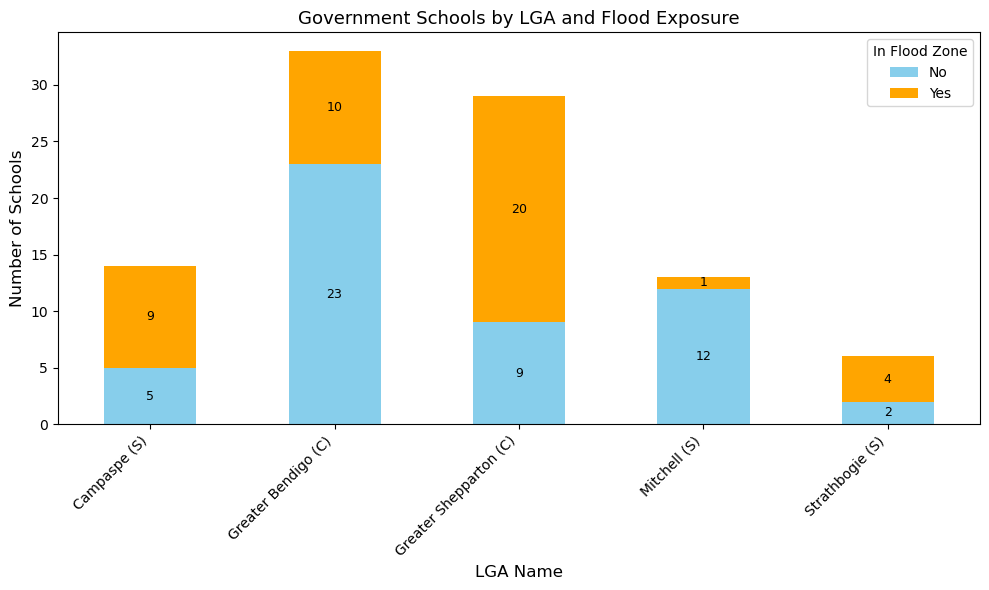

In [18]:
# --- Bar Plot: Schools by LGA and Flood Exposure --- 

ax = (slLGA.groupby(['LGA Name', 'inFlood'])
           .size()
           .unstack(fill_value=0)
           .plot(kind='bar', stacked=True, figsize=(10, 6), color=['skyblue', 'orange']))

# Title and axis label
plt.title("Government Schools by LGA and Flood Exposure", fontsize=13)
plt.xlabel("LGA Name", fontsize=12)
plt.ylabel("Number of Schools", fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.legend(title="In Flood Zone", labels=["No", "Yes"])
plt.tight_layout()

# Bar labels
for container in ax.containers:
    for bar in container:
        height = bar.get_height()
        if height > 0:
            ax.text(bar.get_x() + bar.get_width() / 2,
                    bar.get_y() + height / 2,
                    f"{int(height)}",
                    ha='center', va='center', fontsize=9, color='black')

plt.show()


> **Graph Interpretation**
>
> The bar chart reveals a breakdown of government school counts in the five target LGAs of North Central Victoria, segmented by whether they fall inside (orange) or outside (blue) the flood zones. 
>
> Greater Shepparton shows the highest number of flood-exposed schools, accounting for over two-thirds of its total 29 schools. Campaspe and Strathbogie also present a high proportion with 64-67% of schools situated in flood zones. While Greater Bendigo has the highest number of schools, only 10 schools are exposed. IN contrast, Mitchell has only 1 school exposed out of 13, suggesting relatively low vulnerability in terms of flood event. This indirectly supports the first hypothesis: “Government schools are disproportionately located in flood-prone zones compared to safer areas.”
>

### <a id='toc4_2_2_'></a>[Socio-Economic Indexes for SA2, AUS 2021](#toc0_)

The SEIFA dataset[5] was selected to represent the socio-economic disadvantage of communities across the study area. In particular, we used the Index of Relative Socio-Economic Disadvantage (IRSD) at the SA2 level. This index summarizes socio-economic conditions (income, education, employment, etc.) in an area, which is crucial for identifying disadvantaged areas. We chose SEIFA because one of our core questions is whether flood-exposed schools are located in low socio-economic status areas, and SEIFA provides a standardized measure for that. Lower IRSD scores indicate greater disadvantage, for example, an area with a very low SEIFA score likely has more lowincome households and higher unemployment.

In practice, each school was spatially joined to the SEIFA score of the SA2 it falls in. SEIFA scores were joined to the SA2 polygon geometries. Then, the SA2 polygons were clipped to the geometry of each LGA in our study area. Any SA2s outside the study region were excluded. We ensured that the SA2 codes/names in the SEIFA data matched those in our
spatial SA2 boundary file so that the join was accurate.

Key assumptions include:
1. The SEIFA IRSD score accurately reflects disadvantage for each SA2 and is comparable across the region. 
2. Socio-economic conditions are relatively uniform within an SA2, so a school inherits the SEIFA characteristics of its surrounding SA2. 

In [19]:
seifaDF = pd.read_excel(seifaPath, sheet_name="Table 1", skiprows=5)

# Keep only relevant columns
seifaDF = seifaDF.iloc[:-2, :3]
seifaDF.columns = ['SA2 Code', 'SA2 Name', 'Score']

# Convert SA2 Code to integer
seifaDF['SA2 Code'] = seifaDF['SA2 Code'].astype(int)

seifaDF.head()

,SA2 Code,SA2 Name,Score
0,101021007,Braidwood,1024
1,101021008,Karabar,994
2,101021009,Queanbeyan,1010
3,101021010,Queanbeyan - East,1025
4,101021012,Queanbeyan West - Jerrabomberra,1098


In [20]:
# Merge SEIFA scores with SA2 spatial geometries based on SA2 Code and Name
merged = sa2GDF.merge(seifaDF, on=['SA2 Code', 'SA2 Name'], how='left')
seifaSA2 = gpd.GeoDataFrame(merged, geometry='geometry', crs=sa2GDF.crs)

# Clip SEIFA SA2 data to study area
sa2Lga = {
    lga: gpd.clip(seifaSA2, lgaGeom)
    for lga, lgaGeom in lgaGDF.set_index("LGA Name").geometry.items()
}

# Combine all clipped SA2 areas
seifaLGA = gpd.GeoDataFrame(
    pd.concat([gdf.assign(**{'LGA Name': lga}) for lga, gdf in sa2Lga.items()],
              ignore_index=True),
    crs=seifaSA2.crs
)

seifaLGA['Score'] = pd.to_numeric(seifaLGA['Score'], errors='coerce')

### <a id='toc4_2_3_'></a>[2021 Census GCP for SA2, VIC 2021](#toc0_)

To understand the number of students being affected in each area, Census data on student populations was used. The 2021 Census General Community Profile table G15[6] provides counts of people in each SA2 by type of educational institution attending, such as number of primary and secondary school students, by sex and full-time/part-time status. By quantifying the student population, the scale of impact can be evaluated. For example, an area might have a flood-exposed school, but if that area has, say, 1,000 students, the potential exposure affects more people than an area with 100 students.

We extracted the total number of primary school students and secondary school students in each SA2. Again, the student data was merged with SA2 geometry and the SA2 polygons were clipped to each LGA. 

Key assumption includes:
1. Census 2021 data accurately reflects the distribution of students across the region and that using SA2-level counts is appropriate for regional analysis.


In [21]:
# Keep only government school student columns (primary and secondary)
cenDF = pd.read_csv(cenPath)
cenDF = cenDF[["SA2_CODE_2021", "Primary_Government_P", "Secondary_Government_P"]]
cenDF.columns = ["SA2 Code", "Primary Government Students", "Secondary Government Students"]

cenDF['SA2 Code'] = cenDF['SA2 Code'].astype(int)

cenDF.head()

,SA2 Code,Primary Government Students,Secondary Government Students
0,201011001,973,799
1,201011002,333,180
2,201011005,457,175
3,201011006,593,426
4,201011007,287,179


In [22]:
# Join student count data with SA2 spatial geometries
merged = sa2GDF.merge(cenDF, on='SA2 Code', how='left')
cenSA2 = gpd.GeoDataFrame(merged, geometry='geometry', crs=sa2GDF.crs)

# Clip student data to LGAs within the study region
cenLga = {
    lga: gpd.clip(cenSA2, lgaGeom)
    for lga, lgaGeom in lgaGDF.set_index("LGA Name").geometry.items()
}

# Combine all LGA-clipped student data
cenLGA = gpd.GeoDataFrame(
    pd.concat([gdf.assign(**{'LGA Name': lga}) for lga, gdf in cenLga.items()],
              ignore_index=True),
    crs=cenSA2.crs
)

cenLGA.head()

,SA2 Code,SA2 Name,Area,State,geometry,Primary Government Students,Secondary Government Students,LGA Name
0,204011054,Alexandra,2118.9554,Victoria,"MULTIPOLYGON (((1026991.773 -4207812.382, 1026...",242,289,STRATHBOGIE SHIRE
1,204011057,Mansfield (Vic.),3927.8774,Victoria,"MULTIPOLYGON (((1036457.832 -4202621.652, 1036...",501,403,STRATHBOGIE SHIRE
2,204011062,Yea,1474.2972,Victoria,"MULTIPOLYGON (((1018345.888 -4208373.157, 1018...",164,147,STRATHBOGIE SHIRE
3,204011055,Euroa,2057.9046,Victoria,"POLYGON ((1013016.888 -4164093.610, 1013058.59...",213,220,STRATHBOGIE SHIRE
4,204011058,Nagambie,1294.3498,Victoria,"POLYGON ((977288.001 -4175151.548, 977323.762 ...",238,130,STRATHBOGIE SHIRE


## <a id='toc4_3_'></a>[Raster Data](#toc0_)

### <a id='toc4_3_1_'></a>[VIC Elevation DEM 10m](#toc0_)

Digital Elevation Model (DEM) (10 m resolution)[3] was used to incorporate terrain information into the analysis. Undoubtedly, topography is inherently linked to flood risk. Low elevation area is more likely to be impacted by flood. By examining elevation, the questions of why certain schools are at a risk and whether there's a pattern (e.g. are flood-prone schools consistently at lower elevations?) can be answered. 

The Vicmap 10 m DEM provides the ground height above sea level for any location in Victoria. First, we reprojected the DEM raster data to EPSG:7845. Then, we clipped the reprojected DEM to the target LGAs. A downsampled raster at 100m was also saved as we may not need such a high resolution for the purpose of this analysis.



Key assumptions include:
1. DEM is reliable and sufficiently detailed to capture meaningful elevation differences at the scale of school sites.
2. In 10-meter resolution, any local elevation features (hills, valleys) that might affect flooding are reflected.



#### <a id='toc4_3_1_1_'></a>[Pre-Processing](#toc0_)

In [23]:
if False:
    dem = rasterio.open(demPath, 'r')

In [24]:
if False:
    print(f'Original CRS: {dem.crs}')

    dstCRS = 'EPSG:7845'
    dstTransform, dstWidth, dstHeight = calculate_default_transform(
        dem.crs, dstCRS,
        dem.width, dem.height,
        *dem.bounds
    )

    dstArr = np.empty((dstHeight, dstWidth), dtype=dem.dtypes[0])

    reproject(
        source      = dem.read(1),
        destination = dstArr,
        src_transform = dem.transform,
        src_crs     = dem.crs,
        dst_transform = dstTransform,
        dst_crs     = dstCRS,
        resampling  = Resampling.bilinear,
        src_nodata  = dem.nodata,
        dst_nodata  = dem.nodata
    )

    print(f'Reprojected array shape: {dstArr.shape}')
    print(f'Transformed CRS: {dstCRS}')

In [25]:
if False:
    geometry = [mapping(lgaGDF.unary_union)]

    with rasterio.open(
        'projDEM.tif', 'w',
        driver='GTiff',
        height=dstArr.shape[0],
        width=dstArr.shape[1],
        count=1,
        dtype=dstArr.dtype,
        crs=dstCRS,
        transform=dstTransform,
        nodata=dem.nodata
    ) as dst:
        dst.write(dstArr, 1)

    with rasterio.open('projDEM.tif') as src:
        clipArr, clippedTransform = mask(src, geometry, crop=True)
        clipMeta = src.meta.copy()
        clipMeta.update({
            'height': clipArr.shape[1],
            'width': clipArr.shape[2],
            'transform': clippedTransform
        })

    with rasterio.open('clippedDEM.tif', 'w', **clipMeta) as dst:
        dst.write(clipArr)

In [26]:
if False:
    def downsample(arr, transform, factor):
        outH = arr.shape[1] // factor
        outW = arr.shape[2] // factor

        outTransform = transform * Affine.scale(factor)

        outArr = np.empty((1, outH, outW), dtype=arr.dtype)

        reproject(
            source         = arr,
            destination    = outArr,
            src_transform  = transform,
            src_crs        = dstCRS,
            dst_transform  = outTransform,
            dst_crs        = dstCRS,
            resampling     = Resampling.bilinear,
            src_nodata     = dem.nodata,
            dst_nodata     = dem.nodata
        )
        return outArr, outTransform


    downsampledArr, downsampledTransform = downsample(clipArr, clippedTransform, factor=10)
    downsampledMeta = clipMeta.copy()
    downsampledMeta.update({
        'height': downsampledArr.shape[1],
        'width': downsampledArr.shape[2],
        'transform': downsampledTransform
    })

In [27]:
if False:
    outputPath = os.path.join("Data/Raster/Elevation", "lgaDEM10m.tif")

    saveMeta = clipMeta.copy()
    saveMeta.update({
        'height': clipArr.shape[1],
        'width': clipArr.shape[2],
        'transform': clippedTransform
    })

    with rasterio.open(outputPath, 'w', **saveMeta) as dst:
        dst.write(clipArr)

In [28]:
if False:
    outputPath = os.path.join("Data/Raster/Elevation", "lgaDEM100m.tif")

    with rasterio.open(outputPath, 'w', **downsampledMeta) as dst:
        dst.write(downsampledArr)

#### <a id='toc4_3_1_2_'></a>[Load DEM Raster](#toc0_)

In [29]:
# --- Load Final Clipped 10m DEM and Extract Metadata ---
rasterPath = 'Data/Raster/Elevation/lgaDEM10m.tif'

with rasterio.open(rasterPath) as src:
    dsArr = src.read(1) # Read elevation data into a NumPy array
    dsTransform = src.transform
    dsCRS = src.crs
    dsBounds = src.bounds # Get spatial bounds of the raster
    dsMeta = src.meta
    nodata = src.nodata # Identify the nodata value

# Print basic information about the raster
print(f"Shape: {dsArr.shape}")
print(f"CRS: {dsCRS}")
print(f"Bounds: {dsBounds}")
print(f"Transform:\n{dsTransform}")

Shape: (18527, 16608)
CRS: EPSG:7845
Bounds: BoundingBox(left=895054.7992178279, bottom=-4261650.880221053, right=1061407.4814138976, top=-4076076.690490406)
Transform:
| 10.02, 0.00, 895054.80|
| 0.00,-10.02,-4076076.69|
| 0.00, 0.00, 1.00|


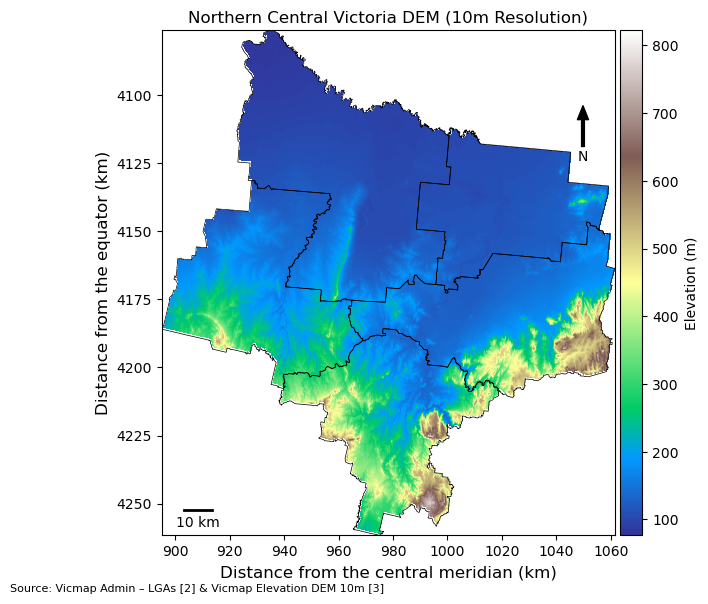

In [30]:
dsArr = np.where(dsArr == nodata, np.nan, dsArr)

fig, ax = plt.subplots(figsize=(8, 6))

# DEM background
im = rasterio.plot.show(
    dsArr,
    ax=ax,
    transform=dsTransform,
    cmap='terrain',
    interpolation='bilinear'
)
im = im.get_images()[0]

# Overlay LGA boundary
lgaGDF.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.5)

# Orientation (North arrow)
ax.annotate(
    'N',
    xy=(0.93, 0.85), xytext=(0.93, 0.75),
    xycoords='axes fraction',
    textcoords='axes fraction',
    arrowprops=dict(facecolor='black', width=2, headwidth=8, headlength=10),
    ha='center',
    va='center',
    fontsize=10
)

# Legend
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im, cax=cax, orientation='vertical').set_label('Elevation (m)')

# Scale bar
minX = dsTransform.c
maxY = dsTransform.f
maxX = minX + dsTransform.a * dsArr.shape[1]
minY = maxY + dsTransform.e * dsArr.shape[0]

sbLength = 10000  # metres
sbX = minX + (maxX - minX) * 0.05
sbY = minY + (maxY - minY) * 0.05
ax.plot([sbX, sbX + sbLength], [sbY, sbY], color='black', linewidth=2)
ax.text(
    sbX + sbLength / 2,
    sbY - (maxY - minY) * 0.01,
    '10 km',
    ha='center',
    va='top',
    fontsize=10
)

# Title and labels
ax.set_title('Northern Central Victoria DEM (10m Resolution)', fontsize=12)
ax.set_xlabel('Distance from the central meridian (km)', fontsize=12)
ax.set_ylabel('Distance from the equator (km)', fontsize=12)

# Axis formatting
ax.xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f"{x / 1000:.0f}"))
ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda y, _: f"{abs(y) / 1000:.0f}"))
ax.set_aspect('equal')

# Source annotation
fig.text(0.01, 0.001, "Source: Vicmap Admin – LGAs [2] & Vicmap Elevation DEM 10m [3]", 
         fontsize=8, ha='left', va='bottom')

plt.tight_layout()
plt.show()


> **Map Interpretation**
>
> The map above displays the Digital Elevation Model (DEM) for the five target LGAs in Northern Central Victoria. The elevation is visualized using a continuous color ramp from green (low elevation) to brown (high elevation).
>
> The map reveals that lower elevation area dominate the norhern and central regions, especially Greater Shepparton and Campaspe. Higher elevation areas are more prevalent in Strathbogie and Mitchell. This elevation gradient explains the spatial distribution of flood extents observed in earlier maps, that is, flood zones tend to coincide with flatter, low-lying areas.
>

___

# <a id='toc5_'></a>[Exploratory Spatial Data Analysis](#toc0_)

## <a id='toc5_1_'></a>[Descriptive Statistics](#toc0_)

### <a id='toc5_1_1_'></a>[SEIFA IRSD Scores Distribution](#toc0_)

In [31]:
# --- Summarize SEIFA IRSD Scores by LGA ---

# Group SEIFA scores by LGA Name for regional comparison
grouped = seifaLGA.groupby('LGA Name')['Score']

# Compute summary statistics 
summary = grouped.agg([
    ('Mean', 'mean'),
    ('Median', 'median'),
    ('Minimum', 'min'),
    ('Maximum', 'max'),
    ('Standard Deviation', 'std'),
    ('Skewness', lambda x: skew(x)),
    ('Kurtosis', lambda x: kurtosis(x))
]).round(2)

display(summary)

,Mean,Median,Minimum,Maximum,Standard Deviation,Skewness,Kurtosis
LGA Name,,,,,,,
CAMPASPE SHIRE,968.92,968.5,941,998,18.40,0.11,-0.97
GREATER BENDIGO CITY,991.28,994.0,912,1079,51.05,0.27,-0.90
GREATER SHEPPARTON CITY,969.23,975.0,854,1042,52.85,-0.73,0.12
MITCHELL SHIRE,1004.86,1009.5,902,1047,39.21,-1.24,1.34
STRATHBOGIE SHIRE,996.36,989.0,941,1046,32.34,0.01,-0.97


> **Table Interpretation**
>
> The table shows descriptive statistics for SEIFA IRSD scores by LGA. Among the 5 LGAs, Mitchell Shire has the highest mean and median, suggesting it is overall the least disadvantaged LGA. In contrast, Greater Shepparton City and Campaspe Shire have the lowest means (969.23 and 968.92 respectively), indicating these LGAs are relatively more disadvantaged on average. Greater Shepparton also shows negative skewness (-0.73), implying low outliers pulling the distribution towards the left. Meanwhile,  Greater Bendigo City has the widest range and the highest standard deviation (51.05), suggesting high variation in socio-economic status across its SA2 regions.
> 
>

<Figure size 1000x500 with 0 Axes>

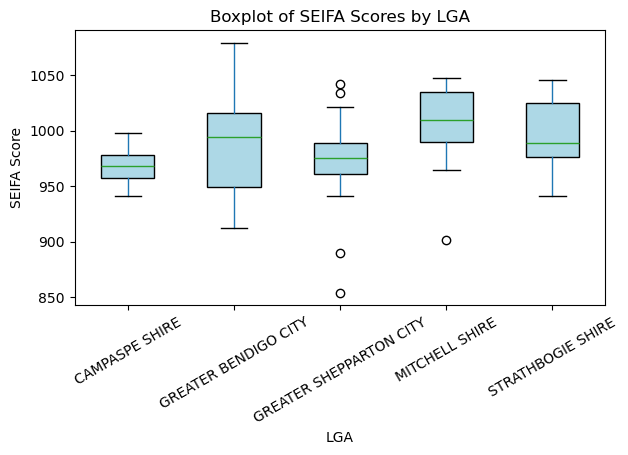

In [32]:
# --- Boxplot of SEIFA IRSD Scores by LGA ---
plt.figure(figsize=(10, 5))
seifaLGA.boxplot(column='Score', by='LGA Name', grid=False, patch_artist=True, boxprops=dict(facecolor="lightblue"))

# Set plot title and axis labels
plt.title('Boxplot of SEIFA Scores by LGA')
plt.suptitle('')
plt.xlabel('LGA')
plt.ylabel('SEIFA Score')
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

> **Graph Interpretation**
>
> From the boxplots, Campaspe and Greater Shepparton have lower medians and tighter boxes, supporting the findings above. Greater Bendigo shows the widest IQR and multiple outliers, confirming high variability. Likewise, Mitchell has the highest median and displays a slight right skewed distribution. 
> 
> According to the findings, it's likely there is a spatial association between flood-exposed schools and low SEIFA areas. To study the association, Raster Analysis and Geographically Weighted Regression were conducted in following parts.

### <a id='toc5_1_2_'></a>[School Type Count at Each SAs](#toc0_)

In [33]:
# --- Bar Chart of Government School Counts by LGA and Type ---

# Create pivot table: count schools by LGA and school type (Primary/Secondary)
pivot = (slLGA.groupby(['LGA Name','School Type'])
                   .size()
                   .unstack(fill_value=0)
                   .assign(Total=lambda d: d.sum(1))
                   .sort_values('Total',ascending=False))

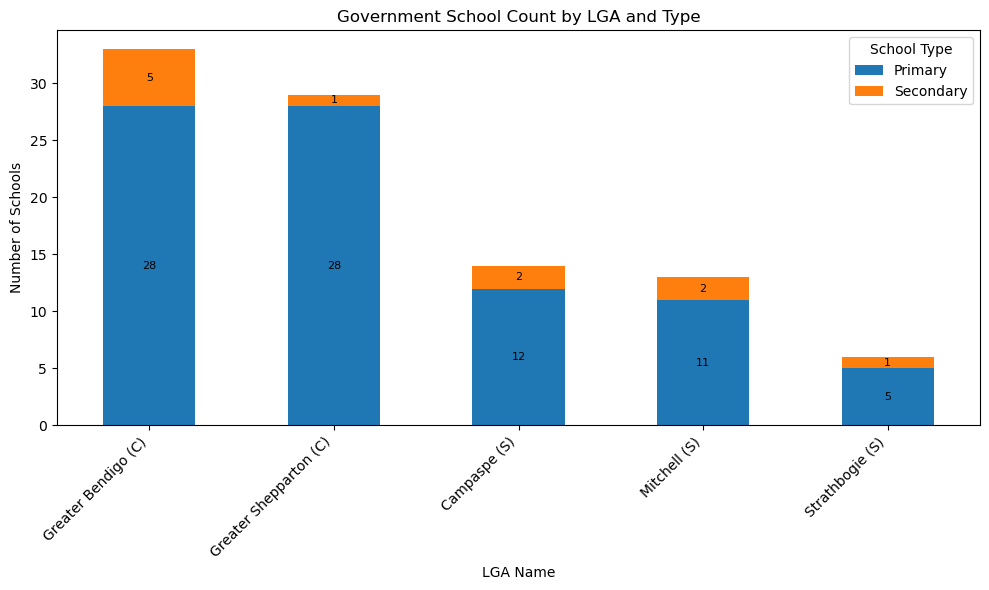

In [34]:
# Plot stacked bar chart of primary and secondary school counts by LGA
ax = pivot[['Primary', 'Secondary']].plot(kind='bar', stacked=True, figsize=(10, 6))

plt.title('Government School Count by LGA and Type')
plt.xlabel('LGA Name')
plt.ylabel('Number of Schools')
plt.xticks(rotation=45, ha='right')
plt.legend(title='School Type')
plt.tight_layout()

# Add value labels to each stacked bar segment
for c in ax.containers:
    ax.bar_label(c, label_type='center', fontsize=8, color='black')

plt.show()


> **Graph Interpretation**
>
> The chart displays the number of government primary and secondary schools in each LGA to provide information on the distribution of educational institutes. Greater Bendigo has the highest total number of government schools, with 28 primary and 5 secondary schools. Greater Shepparton follows closely with 29 schools, but has only 1 secondary school. However, Strathbogie has the lowest total number of schools. 

## <a id='toc5_2_'></a>[Point Pattern Analysis](#toc0_)

### <a id='toc5_2_1_'></a>[School Distribution in LGAs](#toc0_)

A combination of point pattern analysis methods was employed to investigae the spatial distribution of government schools in the 5 LGAs. These techniques are widely used to assess the degree of clustering, randomness, or dispersion in the distribution. We applied both distance-based and density-based approaches. A comparison of different methods is discussed at the end of the project.

#### <a id='toc5_2_1_1_'></a>[Distance-based Methods](#toc0_)

##### <a id='toc5_2_1_1_1_'></a>[Average Nearest Neighbour Analysis](#toc0_)

Average Nearest Neighbour Analysis is a distance-based point pattern analysis method used to determine whether a set of spatial points (e.g. schools) is randomly distributed, clustered, or uniformly dispersed across a geographic area. According to the equations shown below (Aryal, 2025), the observed mean distance calculates the average distance between each point and its nearest neighbor in the dataset, whereas the expected mean distance calculates expected average distance between points if they were randomly distributed, based on point density. The Nearest Neighbour Ratio (R) obtained can then be used to infer the spatial pattern:
- **R < 1**: The distribution is clustered.
- **R ≈ 1**: The distribution is random.
- **R > 1**: The distribution is even.

In our analysis, a hypothesis test was conducted to determine whether the pattern is statistically significant. 

![image-3.png](attachment:image-3.png)

*Note. Adapted from “How Average Nearest Neighbor Distance (Spatial Statistics) Works,” by Esri, n.d., ArcGIS Pro Help Documentation (https://pro.arcgis.com/en/pro-app/latest/tool-reference/spatial-statistics/h-how-average-nearest-neighbor-distance-spatial-st.htm). Copyright © Esri.*


In [35]:
# --- Nearest Neighbor Analysis (NNA) of School Distribution by LGA ---

rows = []

# Loop through each LGA and perform spatial point pattern analysis
for lgaName, lgaPoly in lgaGDF.set_index("LGA Name").geometry.items():

    # Filter schools located within the current LGA polygon
    schoolsInLGA = slLGA[slLGA.within(lgaPoly)]

    # Extract coordinates of school points
    coords = [(g.x, g.y) for g in schoolsInLGA.geometry]
    pp = PointPattern(np.array(coords))

    # Calculate observed mean nearest neighbor distance (NND)
    obs = pp.mean_nnd
    n   = pp.n
    dens = n / lgaPoly.area

    # Calculate expected mean NND and standard deviation
    exp = 0.5 / np.sqrt(dens)
    sd  = 0.26136 / np.sqrt(dens)

    # Compute z-score and two-sided p-value
    zVal = (obs - exp) / sd
    pVal = 2 * (1 - norm.cdf(abs(zVal)))
    
    # Compute R ratio
    Rval = obs / exp
    patt = 'clustered' if Rval < 1 else 'dispersed' if Rval > 1 else 'random'

    rows.append({
        'LGA Name': lgaName,
        'Schools': n,
        'Obs Mean NND (m)': round(obs, 2),
        'Exp Mean NND (m)': round(exp, 2),
        'R': round(Rval, 2),
        'Z-score': round(zVal, 2),
        'p-value': round(pVal, 3),
        'Pattern': patt
    })

annLGA = pd.DataFrame(rows)
display(annLGA)


,LGA Name,Schools,Obs Mean NND (m),Exp Mean NND (m),R,Z-score,p-value,Pattern
0,STRATHBOGIE SHIRE,6,10487.28,11759.79,0.89,-0.21,0.836,clustered
1,GREATER SHEPPARTON CITY,29,4663.88,4574.75,1.02,0.04,0.970,dispersed
2,CAMPASPE SHIRE,14,9765.29,8991.65,1.09,0.16,0.869,dispersed
3,GREATER BENDIGO CITY,33,4900.61,4777.70,1.03,0.05,0.961,dispersed
4,MITCHELL SHIRE,13,6227.85,7444.40,0.84,-0.31,0.755,clustered


> **Table Interpretation**
>
> From the table, key findings include:
> - Strathbogie Shire showed a nearest neighbour ratio (R) of 0.89, suggesting slight clustering, but the high p-value (0.836) indicates this pattern is not statistically significant.
> - Greater Shepparton City (R = 1.02) and Greater Bendigo City (R = 1.03) both exhibit near-random distributions.
> - Campaspe Shire (R = 1.09, p = 0.869) also suggests mild dispersion, but again lacks statistical significance.
> - Mitchell Shire had an R value of 0.84, shoing a weak clustering. The result was also non-significant (p = 0.755).
> 
> Overall, all five LGAs display p-values above the 0.05 threshold, indicating that no clustering or dispersion patterns observed are statistically significant. As a result government school distribution within each LGA does not exhibit strong clustering or dispersion.
>

In [36]:
# --- Nearest Neighbor Analysis (NNA): Flood vs Non-Flood Schools ---

rows = []

# Group schools by flood exposure status
for label, group in slLGA.groupby('inFlood'):
    labelStr = 'In Flood' if label else 'Not in Flood'

    # Extract point coordinates of schools
    coords = [(pt.x, pt.y) for pt in group.geometry]
    pp = PointPattern(np.array(coords))

    # Compute observed mean nearest neighbor distance (NND)
    obs = pp.mean_nnd
    n   = pp.n
    area = pp.mbb_area
    dens = n / area

    # Compute expected mean NND and standard deviation
    exp = 0.5 / np.sqrt(dens)
    sd  = 0.26136 / np.sqrt(dens)
    zVal = (obs - exp) / sd
    pVal = 2 * (1 - norm.cdf(abs(zVal)))

    # Compute R ratio
    Rval = obs / exp
    patt = 'clustered' if Rval < 1 else 'dispersed' if Rval > 1 else 'random'

    rows.append({
        'Group': labelStr,
        'Schools': n,
        'Obs Mean NND (m)': round(obs, 2),
        'Exp Mean NND (m)': round(exp, 2),
        'R': round(Rval, 2),
        'Z-score': round(zVal, 2),
        'p-value': round(pVal, 3),
        'Pattern': patt
    })

annFlood = pd.DataFrame(rows)
display(annFlood)

,Group,Schools,Obs Mean NND (m),Exp Mean NND (m),R,Z-score,p-value,Pattern
0,Not in Flood,51,7379.01,10270.36,0.72,-0.54,0.590,clustered
1,In Flood,44,6427.04,9933.90,0.65,-0.68,0.499,clustered


> **Table Interpretation**
>
> The ANN analysis was also used to compare the spatial arrangement of schools located within flood zones versus those outside flood zones. From the table, key findings include:
> - Schools in flood zones showed a nearest neighbour ratio (R) of 0.65 with a p-value of 0.499, indicating a moderate tendency toward clustering, but the result is not statistically significant
> - Schools not in flood zones exhibited an R value of 0.72  and p-value of 0.590, also suggesting a weak clustering pattern.
>
> Therefore, while schools in both groups appear to be somewhat clustered, there is no strong statistical evidence that flood-prone schools are more spatially concentrated than the non-flooded counterparts.
>


##### <a id='toc5_2_1_1_2_'></a>[Ripley's K and L Functions](#toc0_)

Likewise, Ripley's K and L functions are also used in point pattern analysis to determine spatial distribution, but across multiple spatial scales rather than just at a single nearest-neighbour distance. Ripley’s K function measures the expected number of other points within a distance d of a randomly chosen point, standardized by point density. Ripley's L Function is the transformation of the K function to linearize the output, making it easier to interpret deviations from randomness.

**Ripley's K Functions**

![image.png](attachment:image.png) 
where λ is the intensity (point density per area).



- $K(d) > \pi d^2$: clustering at distance $d$
- $K(d) < \pi d^2$: dispersion
- $K(d) = \pi d^2$: complete spatial randomness

**Ripley's K Functions**

![image-2.png](attachment:image-2.png)

- $L(d) > 0$: clustering at distance $d$
- $L(d) < 0$: dispersion
- $L(d) = 0$: randomness







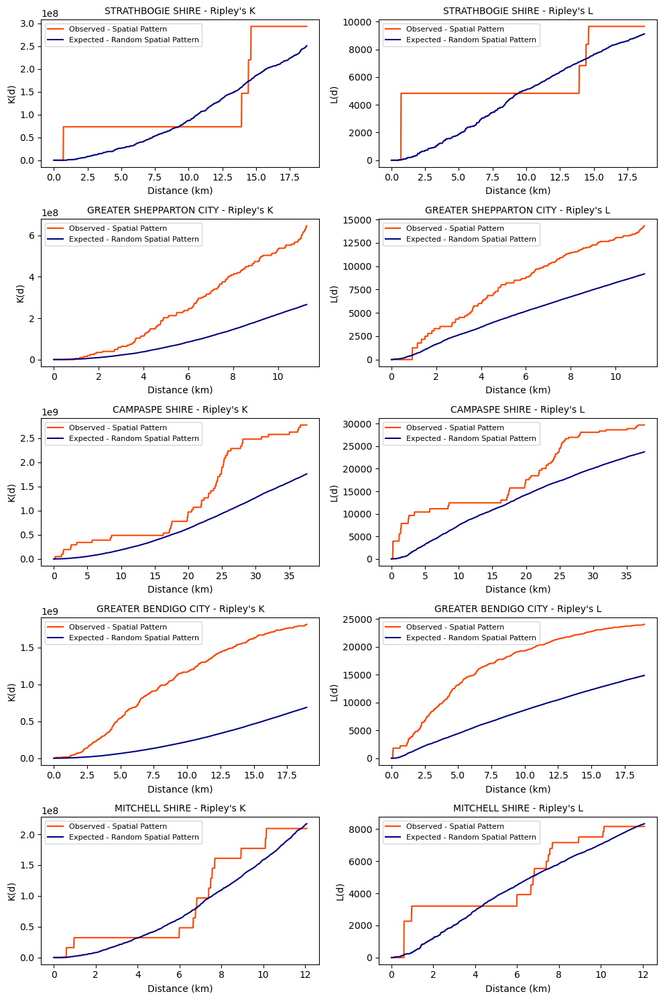

In [37]:
# --- Ripley's K and L Function Analysis for Each LGA ---

# Get list of (LGA Name, geometry) tuples
selectedLGAs = list(lgaGDF.set_index("LGA Name").geometry.items())

# Create subplot grid for 5 LGAs × 2 plots (K and L functions)
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(10, 15))
axes = axes.reshape(5, 2)

# Loop through each LGA and plot its K and L function results
for i, (lgaName, lgaPoly) in enumerate(selectedLGAs):

    # Get schools within current LGA polygon
    schoolsInLGA = slLGA[slLGA.within(lgaPoly)]
    coords = np.array([(g.x, g.y) for g in schoolsInLGA.geometry])

    # Compute Ripley's K and L functions
    kRes = k_test(coords, support=1000, keep_simulations=True, n_simulations=99)
    lRes = l_test(coords, support=1000, keep_simulations=True, n_simulations=99)

    # Plot Ripley's K function
    axK = axes[i, 0]
    axK.plot(kRes.support / 1000, kRes.statistic, 'orangered', label='Observed - Spatial Pattern')
    axK.plot(kRes.support / 1000, kRes.simulations.mean(0), 'navy', label='Expected - Random Spatial Pattern')
    axK.set_title(f"{lgaName} - Ripley's K", fontsize=10)
    axK.set_xlabel("Distance (km)")
    axK.set_ylabel("K(d)")
    axK.legend(fontsize=8)

    # Plot Ripley's L function
    axL = axes[i, 1]
    axL.plot(lRes.support / 1000, lRes.statistic, 'orangered', label="Observed - Spatial Pattern")
    axL.plot(lRes.support / 1000, lRes.simulations.mean(0), 'navy', label="Expected - Random Spatial Pattern")
    axL.set_title(f"{lgaName} - Ripley's L", fontsize=10)
    axL.set_xlabel("Distance (km)")
    axL.set_ylabel("L(d)")
    axL.legend(fontsize=8)

plt.tight_layout()
plt.show()


> **Graph Interpretation**
>
> The Ripley’s K and L function plots reveal how the spatial distribution of government schools varies across the five target LGAs at multiple distance scales. When observed K of L value is greater than expected, clustering of points at a given distance band is indicated. Oppositely, if the observed value is lower than expected, it suggests dispersion.
> 
> From the graph, key findings include:
> - In **Strathbogie Shire**, the observed K and L curves diverge from the expected line primarily at larger distances (over 14 km). This indicates while schools are relatively spread out at local scales, there is significant clustering at broader spatial extents.
> - In **Greater Shepparton City and Greater Bendigo City**, schools strongly clustered even at small distances (~2 km), suggesting central areas with many schools close to together.
> - In **Campaspe Shire**, schools appears to be randomly distributed at small scales but show clear clusters at distances over 15 km, reflecting multiple dispersed townships.
> - In **Mitchell Shire**, schools shows pattern close to random, with minor clustering at intermediate distances. This reflects schools are likely grouped around key population center. 
> 
>



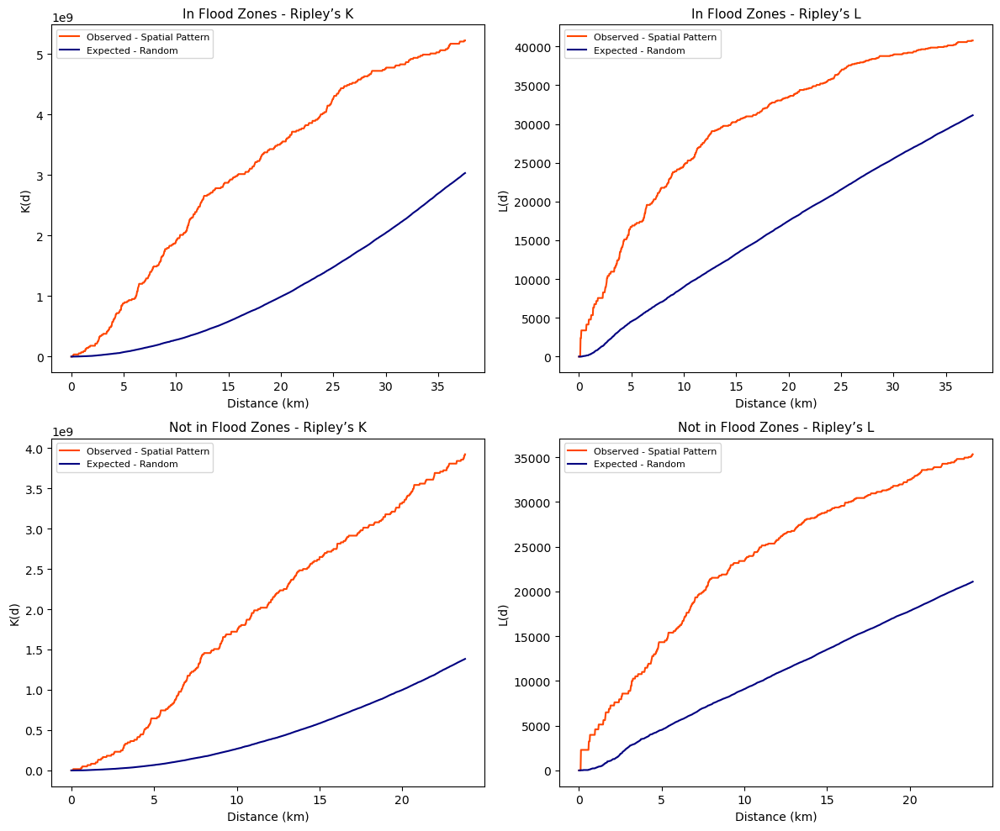

In [38]:
# --- Ripley's K and L Analysis: In Flood Zones vs Not in Flood Zones ---

# Create two groups of schools: flood-exposed and not flood-exposed
groups = {
    'In Flood Zones': slLGA[slLGA['inFlood'] == True],
    'Not in Flood Zones': slLGA[slLGA['inFlood'] == False]
}

# Set up subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))
axes = axes.reshape(2, 2)

# Loop over each group and compute spatial statistics
for i, (label, gdf) in enumerate(groups.items()):
    coords = np.array([(pt.x, pt.y) for pt in gdf.geometry])

    kRes = k_test(coords, support=1000, keep_simulations=True, n_simulations=99)
    lRes = l_test(coords, support=1000, keep_simulations=True, n_simulations=99)

    # Ripley's K
    axK = axes[i, 0]
    axK.plot(kRes.support / 1000, kRes.statistic, 'orangered', label='Observed - Spatial Pattern')
    axK.plot(kRes.support / 1000, kRes.simulations.mean(0), 'navy', label='Expected - Random')
    axK.set_title(f"{label} - Ripley’s K", fontsize=11)
    axK.set_xlabel("Distance (km)")
    axK.set_ylabel("K(d)")
    axK.legend(fontsize=8)

    # Ripley's L
    axL = axes[i, 1]
    axL.plot(lRes.support / 1000, lRes.statistic, 'orangered', label='Observed - Spatial Pattern')
    axL.plot(lRes.support / 1000, lRes.simulations.mean(0), 'navy', label='Expected - Random')
    axL.set_title(f"{label} - Ripley’s L", fontsize=11)
    axL.set_xlabel("Distance (km)")
    axL.set_ylabel("L(d)")
    axL.legend(fontsize=8)

plt.tight_layout()
plt.show()

> **Graph Interpretation**
>
> These plots reveal how the spatial distribution of government schools in flood zones and outside flood zones differs across multiple distance scales. 
> 
> From the graph, key findings include:
> - For **schools in flood zones**, show a strong upward deviation from the expected random pattern across all distances. This indicates a strong and sustained clustering tendency at both short and long distances. The pattern suggests that schools in flood-prone areas tend to be located in close proximity to one another.
> 
> - For **schools not in flood zones**, the observed curves also lie above the expected values, confirming some degree of clustering. However, the magnitude of divergence is smaller compared to the flood-zone group, suggesting weaker clustering.
> 
> To sum up, Government schools located in flood zones exhibit stronger spatial clustering than those in non-flooded areas. This pattern reinforces the idea that vulnerable clusters exist within flood-prone zones.
> 

##### <a id='toc5_2_1_1_3_'></a>[Ripley's G and F Function](#toc0_)

Ripley’s G and F functions serve as extensions to the average nearest neighbour approach, assessing local-scale clustering or dispersion. Ripley’s G Function measures the distribution of nearest-neighbour distances from each point to the closest other point in the dataset. G(d) gives the probability that the nearest neighbour of a randomly chosen point is within distance d. Ripley’s F Function measures the distribution of distances from random locations in the study area to the nearest observed point. F(d) is the probability that a random location lies within distance d of the nearest point.

**Ripley’s G Function**
- Observed G(d) > Expected G(d): Clustering
- Observed G(d) < Expected G(d): Dispersion

**Ripley’s F Function**
- Observed F(d) > Expected F(d): Clustering
- Observed F(d) < Expected F(d): Dispersion

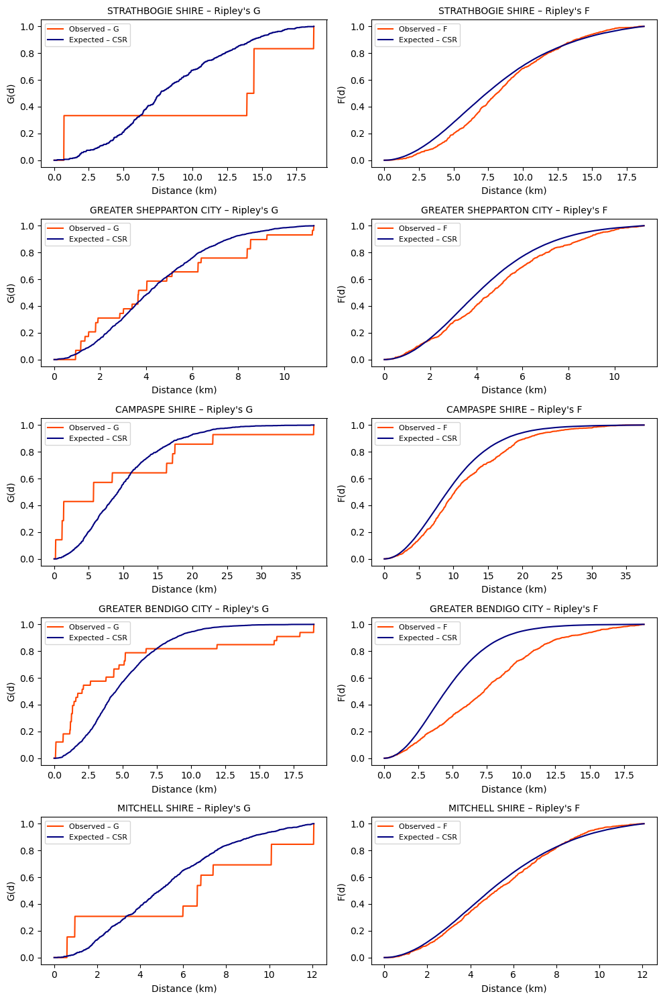

In [39]:
# --- Ripley’s G and F Function Analysis for Each LGA ---

# Create subplot grid: 5 LGAs × 2 columns (G and F functions)
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(10, 15))
axes = axes.reshape(5, 2)

# Loop over each LGA and compute G and F spatial statistics
for i, (lgaName, lgaPoly) in enumerate(selectedLGAs):

    # Get schools located within the LGA boundary
    schoolsInLGA = slLGA[slLGA.within(lgaPoly)]
    coords = np.array([(pt.x, pt.y) for pt in schoolsInLGA.geometry])

    # Compute Ripley’s G and F
    gRes = g_test(coords, support=1000, keep_simulations=True, n_simulations=99)
    fRes = f_test(coords, support=1000, keep_simulations=True, n_simulations=99)

    # G function 
    axG = axes[i, 0]
    axG.plot(gRes.support / 1000, gRes.statistic,  'orangered', label='Observed – G')
    axG.plot(gRes.support / 1000, gRes.simulations.mean(0), 'navy', label='Expected – CSR')
    axG.set_title(f"{lgaName} – Ripley's G", fontsize=10)
    axG.set_xlabel("Distance (km)")
    axG.set_ylabel("G(d)")
    axG.legend(fontsize=8)

    # F function 
    axF = axes[i, 1]
    axF.plot(fRes.support / 1000, fRes.statistic,  'orangered', label='Observed – F')
    axF.plot(fRes.support / 1000, fRes.simulations.mean(0), 'navy', label='Expected – CSR')
    axF.set_title(f"{lgaName} – Ripley's F", fontsize=10)
    axF.set_xlabel("Distance (km)")
    axF.set_ylabel("F(d)")
    axF.legend(fontsize=8)

plt.tight_layout()
plt.show()

> **Graph Interpretation**
>
> The Ripley’s G and F function plots provide additional insights into the local-scale spatial patterns of government school distributions across the five LGAs. When the observed G(d) or F(d) curve rises above the expected CSR (Complete Spatial Randomness) curve, it indicates clustering. If the curve falls below the expected line, it suggests dispersion.
> 
> From the graph, key findings include:
> - In **Strathbogie Shire**, schools are slightly dispersed.
> 
> - In **Greater Shepparton & Greater Bendigo**, schools are clustered strongly at very short distance (~2 km), indicating dense local distribution.
> 
> - In **Campaspe Shire**, there is evidence of local clustering, but dispersed at long distance. There are possibly clustered islands in a dispersed landscape.
> 
> - In **Mitchell Shire**:  Distribution of schools is largely random, with possible mild dispersion.
> 

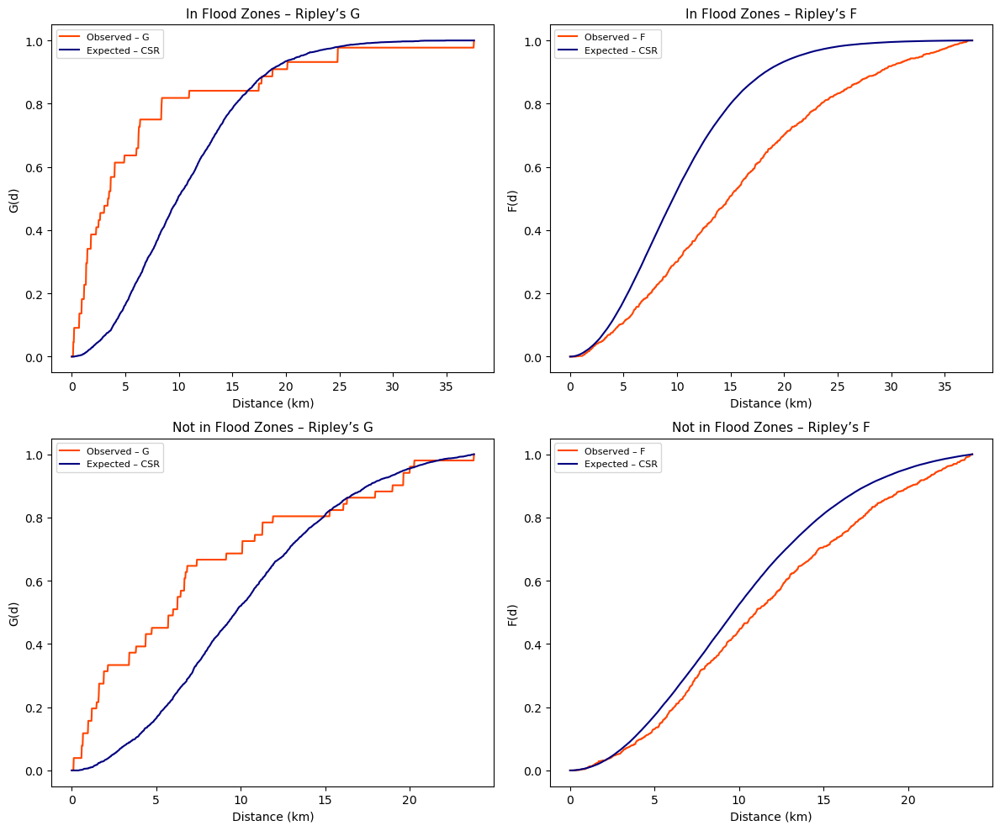

In [40]:
# --- Ripley’s G and F Analysis: In Flood Zones vs Not in Flood Zones ---

# Define school groups based on flood exposure status
groups = {
    'In Flood Zones': slLGA[slLGA['inFlood'] == True],
    'Not in Flood Zones': slLGA[slLGA['inFlood'] == False]
}

# Set up subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))
axes = axes.reshape(2, 2)

# Loop through each group and perform G/F spatial tests
for i, (label, gdf) in enumerate(groups.items()):
    coords = np.array([(pt.x, pt.y) for pt in gdf.geometry])
    
    # Skip analysis if group has too few points for meaningful inference
    if len(coords) < 5:
        continue  # Skip groups with too few points
    
    # Perform Ripley's G and F tests
    gRes = g_test(coords, support=1000, keep_simulations=True, n_simulations=99)
    fRes = f_test(coords, support=1000, keep_simulations=True, n_simulations=99)

    # G plot
    axG = axes[i, 0]
    axG.plot(gRes.support / 1000, gRes.statistic, 'orangered', label='Observed – G')
    axG.plot(gRes.support / 1000, gRes.simulations.mean(0), 'navy', label='Expected – CSR')
    axG.set_title(f"{label} – Ripley’s G", fontsize=11)
    axG.set_xlabel("Distance (km)")
    axG.set_ylabel("G(d)")
    axG.legend(fontsize=8)

    # F plot
    axF = axes[i, 1]
    axF.plot(fRes.support / 1000, fRes.statistic, 'orangered', label='Observed – F')
    axF.plot(fRes.support / 1000, fRes.simulations.mean(0), 'navy', label='Expected – CSR')
    axF.set_title(f"{label} – Ripley’s F", fontsize=11)
    axF.set_xlabel("Distance (km)")
    axF.set_ylabel("F(d)")
    axF.legend(fontsize=8)

plt.tight_layout()
plt.show()

> **Graph Interpretation**
>
> The Ripley’s G and F functions assess the local-scale spatial patterns of schools located inside and outside flood zones.
> 
> From the graph, key findings include:
> - For **Schools in Flood Zones**, the G function shows a sharp rise at small distances, indicating that schools are closely spaced and clustered at fine scales (within ~5 km). The F function lies well below the CSR expectation, suggesting large gaps between some school clusters. Together, these patterns reflect a layout where schools are densely grouped in pockets.
> 
> - For **Schools Not in Flood Zones**, the G curve still lies above CSR, but the rise is more gradual, indicating moderate clustering. The F curve remains close to the expected CSR, implying a more uniform distribution with fewer large gaps across the region.
> 
> Both G and F functions confirm that government schools in flood zones are more spatially clustered, while schools outside flood zones tend to be more evenly distributed. This reinforces concerns that flood-prone areas may host concentrated clusters of schools, increasing localized vulnerability during extreme events.


#### <a id='toc5_2_1_2_'></a>[Density-based methods](#toc0_)

##### <a id='toc5_2_1_2_1_'></a>[Quadrat Count](#toc0_)
Quadrat count is a density-based method used in point pattern analysis to assess the spatial distribution of points (e.g., schools, trees, crimes) across a defined area. This method divides the study area into a grid of equal-sized rectangular or square units, called quadrats. In each quadrat, the number of points is counted and the distribution is analyzed using summary statistics. 


**Variance to Mean Ratio**:

$$
\text{VMR} = \frac{\text{Variance of counts}}{\text{Mean of counts}}
$$

* **VMR > 1**: Clustering
* **VMR ≈ 1**: Random distribution
* **VMR ≈ 0**: Uniform distribution





In [41]:
# --- Quadrat Analysis (Q-statistic) by LGA for School Distribution ---

rows = []

# Loop through each LGA and apply quadrat-based spatial analysis
for lgaName, lgaPoly in lgaGDF.set_index('LGA Name').geometry.items():

    # Filter schools within current LGA
    schoolsInLGA = slLGA[slLGA.within(lgaPoly)]
    coords = np.array([(g.x, g.y) for g in schoolsInLGA.geometry])

    # Create point pattern object
    pp = PointPattern(coords)

    # Divide LGA bounding rectangle into a 4x4 grid and compute Q-statistic
    qs = QStatistic(pp, shape='rectangle', nx = 4, ny = 4)

    # Get point counts in each quadrat cell
    counts = np.array(list(qs.mr.point_location_sta().values()))

    # Compute variance-mean ratio (VMR)
    mean = np.mean(counts)
    var = np.var(counts, ddof = 1)
    vmr = var / mean
    
    # Get chi-square test statistic and p-value 
    chi2 = qs.chi2
    df = qs.df
    pVal = qs.chi2_pvalue
    
    # Interpret spatial pattern based on VMR thresholds
    pattern = 'clustered' if vmr > 1.1 else ('uniform' if vmr < 0.9 else 'random')
    rows.append({
        'LGA Name': lgaName,
        'Cells': len(counts),
        'Points': pp.n,
        'VMR': round(vmr, 2),
        'Chi-square': round(chi2, 2),
        'p-value': round(pVal, 3),
        'Pattern': pattern
    })

quadLGA = pd.DataFrame(rows).sort_values('LGA Name')
display(quadLGA)

,LGA Name,Cells,Points,VMR,Chi-square,p-value,Pattern
2,CAMPASPE SHIRE,16,14,1.20,18.00,0.263,clustered
3,GREATER BENDIGO CITY,16,33,4.94,74.15,0.000,clustered
1,GREATER SHEPPARTON CITY,16,29,2.66,39.97,0.000,clustered
4,MITCHELL SHIRE,16,13,1.35,20.23,0.163,clustered
0,STRATHBOGIE SHIRE,16,6,1.02,15.33,0.428,random


> **Table Interpretation**
>
> The Quadrat Count method evaluates the spatial distribution of government schools across the five LGAs by dividing each region. The Variance-to-Mean Ratio (VMR) and associated Chi-square test determine whether the observed distribution significantly deviates from randomness.
> 
> From the table, key findings include:
> - **Greater Bendigo & Greater Shepparton City** shows strong and statistically significant clustering of schools, with p < 0.001.
> 
> - **Campaspe Shire & Mitchell Shire** has a VMR of 1.20 and 1.35 respectively, suggesting mild clustering, but the result is not statistically significant.
> 
> - **Strathbogie Shire** shows random distribution and test is non-significant.
> 
> In summary, only Greater Bendigo and Greater Shepparton show statistically significant school clustering; the other LGAs do not deviate from complete spatial randomness at the 5 % confidence interval.


In [42]:
# --- Quadrat Analysis (Q-statistic): Flood vs Non-Flood Schools ---

# Define two groups based on flood exposure
groups = {
    'In Flood': slLGA[slLGA['inFlood'] == True],
    'Not in Flood': slLGA[slLGA['inFlood'] == False]
}

rows = []

# Loop through each group and apply quadrat-based spatial test
for label, gdf in groups.items():
    coords = np.array([(pt.x, pt.y) for pt in gdf.geometry])
    if len(coords) < 5:
        continue  # too few points for quadrat count

    pp = PointPattern(coords)

    # Apply Q-statistic using a 4x4 grid on the bounding rectangle
    qs = QStatistic(pp, shape='rectangle', nx=4, ny=4)  # 4x4 grid

    # Extract point counts from each quadrat cell
    counts = np.array(list(qs.mr.point_location_sta().values()))
    mean = np.mean(counts)
    var = np.var(counts, ddof=1)
    vmr = var / mean

    # Extract test statistics from QStatistic
    chi2 = qs.chi2
    df = qs.df
    pVal = qs.chi2_pvalue

    # Classify spatial pattern based on VMR thresholds
    pattern = 'clustered' if vmr > 1.1 else ('uniform' if vmr < 0.9 else 'random')

    rows.append({
        'Group': label,
        'Cells': len(counts),
        'Points': pp.n,
        'VMR': round(vmr, 2),
        'Chi-square': round(chi2, 2),
        'p-value': round(pVal, 3),
        'Pattern': pattern
    })

quadFlood = pd.DataFrame(rows)
display(quadFlood)

,Group,Cells,Points,VMR,Chi-square,p-value,Pattern
0,In Flood,16,44,5.07,76.00,0.0,clustered
1,Not in Flood,16,51,7.66,114.96,0.0,clustered


> **Table Interpretation**
>
> The Quadrat Count method evaluates the sspatial clustering of schools inside and outside flood zones using a uniform 4×4 grid.
> 
> From the table, key findings include:
> - For **In Flood Zones**, The VMR of 5.07 and Chi-square value of 76.00 (p < 0.001) indicate a strong and statistically significant clustering of schools. This suggests that within flood-prone areas, schools are not evenly distributed but tend to aggregate in specific high-risk clusters, potentially corresponding to low-lying areas.
> 
> - For **Not In Flood Zones**, an even higher VMR of 7.66 and Chi-square value of 114.96 (p < 0.001) were observed. This reflects an even stronger degree of significant clustering among schools located in safer areas. The result suggests that school clustering is a general spatial characteristic across the study region, not solely a feature of flood-prone zones.
> 
> To sum up, both groups of schools exhibit strong and statistically significant clustering. This reflects underlying infrastructure patterns.





##### <a id='toc5_2_1_2_2_'></a>[Kernel Density Estimation](#toc0_)

Kernel Density Estimation (KDE) is a non-parametric spatial analysis method used to estimate the density of events, such as schools and trees, and to determine the areas of higher or lower event occurrence intensity. KDE sums the contributions of all kernels at each location in the study area to produce a continuous density surface. It produces a heatmap that highlights clusters (hotspots) and areas of low point density (cold spots), as shown below.



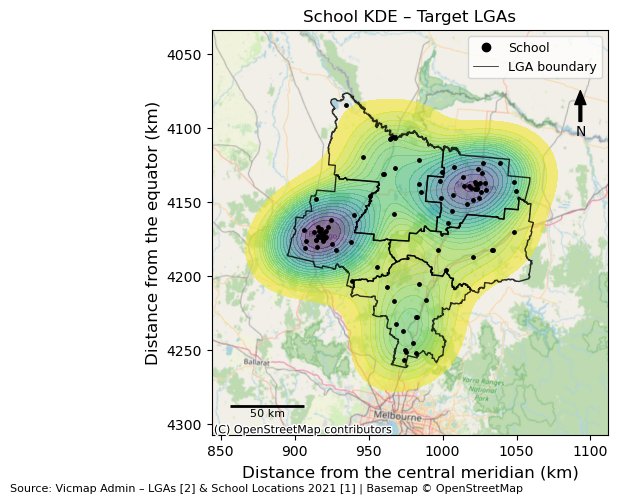

In [43]:
# --- Kernel Density Estimate (KDE) Map of School Locations in Target LGAs ---

fig , ax = plt.subplots(figsize = (10 , 5))

# Plot KDE of school locations
sns.kdeplot(
    x = slLGA.geometry.x.values ,
    y = slLGA.geometry.y.values ,
    n_levels = 20 ,
    fill = True ,
    alpha = 0.55 ,
    cmap = 'viridis_r' ,
    ax = ax
)

# Add OpenStreetMap basemap
ctx.add_basemap(ax , crs = slLGA.crs.to_string() , source = ctx.providers.OpenStreetMap.Mapnik)

# Plot school points and LGA boundaries
slLGA.plot(ax = ax , color = 'k' , markersize = 6)
lgaGDF.boundary.plot(ax = ax , facecolor = 'none' , edgecolor = 'black' , linewidth = 1 , alpha = 0.8)

# Set title and axis labels
ax.set_title('School KDE – Target LGAs' , fontsize = 12)
ax.set_xlabel('Distance from the central meridian (km)' , fontsize = 12)
ax.set_ylabel('Distance from the equator (km)' , fontsize = 12)

# Format x and y axis ticks
ax.xaxis.set_major_formatter(mtick.FuncFormatter(lambda x , _ : f'{x / 1000:.0f}'))
ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda y , _ : f'{abs(y) / 1000:.0f}'))

# Add North arrow annotation
ax.annotate('N' , xy = (0.93 , 0.85) , xytext = (0.93 , 0.75) ,
            arrowprops = dict(facecolor = 'black' , width = 2 , headwidth = 8 , headlength = 10) ,
            ha = 'center' , va = 'center' , fontsize = 10 , xycoords = 'axes fraction')

# Add scale bar (50 km)
sclX = ax.get_xlim()[0] + 12_500
sclY = ax.get_ylim()[0] + 20_000
ax.hlines(y = sclY , xmin = sclX , xmax = sclX + 50_000 , colors = 'black' , linewidth = 2)
ax.text(x = sclX + 25_000 , y = sclY - 7_500 , s = '50 km' , ha = 'center' , fontsize = 8)

# Add custom legend for schools and LGA boundaries
handles = [
    Line2D([], [] , marker = 'o' , color = 'k' , linestyle = 'None' , markersize = 6 , label = 'School') ,
    Line2D([], [] , color = 'k' , linewidth = 0.5 , label = 'LGA boundary')
]
ax.legend(handles = handles , loc = 'upper right' , fontsize = 9)

# Attribution footer for data sources and basemap
fig.text(0.1 , 0.001 , 'Source: Vicmap Admin – LGAs [2] & School Locations 2021 [1] | Basemap © OpenStreetMap' ,
         fontsize = 8 , ha = 'left' , va = 'bottom')

plt.tight_layout()
plt.show()


> **Map Interpretation**
>
> The map presents the KDE of government school locations across the five LGAs. Areas of higher density are represented by darker contours (black and purple), while lower-density regions appear as lighter rings (yellow-green). Black dots indicate the exact school locations. 
> 
> From the map, key findings include:
> - Two distinct high-density clusters of schools are clearly visible in **Greater Bendigo City and Greater Shepparton City**. There is also a cluster in Campaspe Shire. These peaks indicate that schools are highly concentrated in the center of each LGA. 
> 
> - **Strathbogie and Mitchell Shire** show minimal density gradient, indicating isolated schools.
> 
> To sum up, KDE output aligns with findings from ANN, Ripley’s functions, and Quadrat Count analysis.



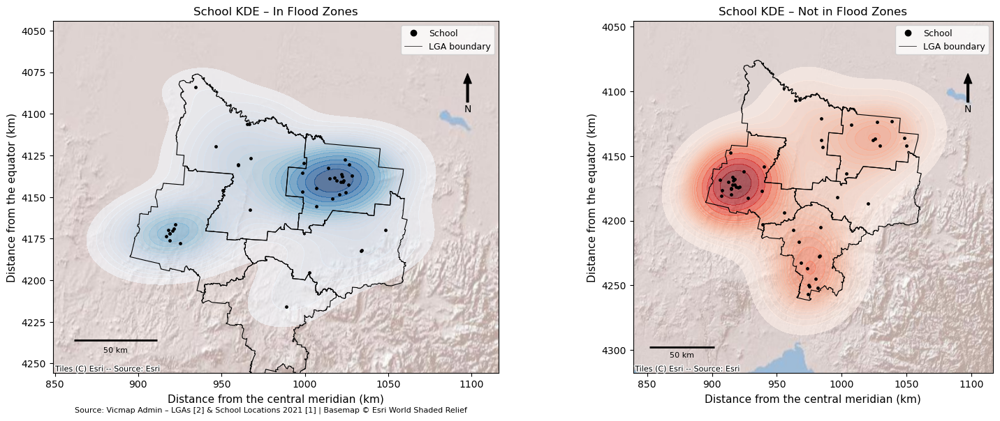

In [44]:
# --- Comparative KDE Maps: Flooded vs Non-Flooded Schools ---

# Separate schools based on flood exposure
floodSchools = slLGA[slLGA['inFlood'] == True]
safeSchools  = slLGA[slLGA['inFlood'] == False]

# Set up subplot
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))

# Loop over each group to generate KDE plots
for ax, (label, gdf, cmap) in zip(axes, [
    ("In Flood Zones", floodSchools, 'Blues'),
    ("Not in Flood Zones", safeSchools, 'Reds')
]):
    # KDE surface
    sns.kdeplot(
        x=gdf.geometry.x,
        y=gdf.geometry.y,
        fill=True,
        cmap=cmap,
        alpha=0.6,
        n_levels=20,
        ax=ax
    )
    
    # Basemap + schools + LGA borders
    ctx.add_basemap(ax, crs='EPSG:7845', source=ctx.providers.Esri.WorldShadedRelief)
    gdf.plot(ax=ax, color='k', markersize=6)
    lgaGDF.boundary.plot(ax=ax, edgecolor='black', linewidth=0.8)

    # Title and labels
    ax.set_title(f"School KDE – {label}", fontsize=12)
    ax.set_xlabel("Distance from the central meridian (km)", fontsize=11)
    ax.set_ylabel("Distance from the equator (km)", fontsize=11)
    ax.xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{x / 1000:.0f}'))
    ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda y, _: f'{abs(y) / 1000:.0f}'))

    # North arrow
    ax.annotate('N', xy=(0.93, 0.85), xytext=(0.93, 0.75),
                arrowprops=dict(facecolor='black', width=2, headwidth=8, headlength=10),
                ha='center', va='center', fontsize=10, xycoords='axes fraction')

    # Scale bar
    sclX = ax.get_xlim()[0] + 12_500
    sclY = ax.get_ylim()[0] + 20_000
    ax.hlines(y=sclY, xmin=sclX, xmax=sclX + 50_000, colors='black', linewidth=2)
    ax.text(x=sclX + 25_000, y=sclY - 7_500, s='50 km', ha='center', fontsize=8)

    # Legend
    handles = [
        Line2D([], [], marker='o', color='k', linestyle='None', markersize=6, label='School'),
        Line2D([], [], color='black', linewidth=0.5, label='LGA boundary')
    ]
    ax.legend(handles=handles, loc='upper right', fontsize=9)

# Footer annotation
fig.text(0.1, 0.001, 'Source: Vicmap Admin – LGAs [2] & School Locations 2021 [1] | Basemap © Esri World Shaded Relief',
         fontsize=8, ha='left', va='bottom')

plt.tight_layout()
plt.show()

> **Map Interpretation**
>
> The pair of maps above compares the spatial density of government schools located inside flood zones (left) and outside flood zones (right) across the five target LGAs. 
> 
> From the map, key findings include:
> - For **In Flood Zones**, the KDE shows two notable hotspots, particularly in Greater Shepparton and Greater Bendigo. This shows schools are highly concentrated in low-lying, flood-prone areas.
> 
> - For **Not In Flood Zones**, the KDE shows one notable hotspot in Greater Bendigo. Higher number of schools are highly concentrated outside the flood areas compared to those in flood zones. It's reasonable as Greater Bendigo has the highest number of school. Some might be clustered in flood zones and some clustered outside flood zones.

## <a id='toc5_3_'></a>[Areal Data Analysis](#toc0_)

In this section, we conducted an polygon-based spatial analysis in our study area to investigate the relationship between:
- SEIFA IRSD scores
- Flood exposure of schools
- Distribution of government school students

We spatially joined and aggregated three datasets at the SA2 level. Using this, we computed:
- `total`: total number of government schools in each SA2
- `flooded`: number of schools located in flood zones
- `safe`: proporrtion of safe schools, which shows the percentage of schools in each SA2 not exposed to flooding
- `student`: sum of government primary and secondary students



In [45]:
# --- Calculate Proportion of Flood-Safe Schools per SA2 ---

# Spatial join: assign each school to its SA2 and LGA based on location
schoolSA2 = (
    gpd.sjoin(
        slLGA.drop(columns=['LGA Name']),
        sa2LGA[['SA2 Code', 'LGA Name', 'geometry']],
        predicate='within',
        how='inner'
    )[['SA2 Code', 'LGA Name', 'inFlood']]
    .groupby(['SA2 Code', 'LGA Name'])['inFlood']
    .agg(total='count', flooded='sum')
    .reset_index()
)

# Compute proportion of schools in each SA2 that are NOT in flood zones
schoolSA2['safe'] = 1 - (schoolSA2['flooded'] / schoolSA2['total'])

In [46]:
# --- Merge SEIFA, Flood Exposure, and Student Count Data at SA2 Level ---

# Step 1: Merge SEIFA data with flood-safe school ratios (from schoolSA2)
# Step 2: Merge with census student population by SA2
# Step 3: Calculate total number of government school students per SA2
arealGDF = (seifaLGA.merge(schoolSA2, on=['SA2 Code', 'LGA Name']
                          , how='left')
           .merge(cenLGA[['SA2 Code', 'LGA Name', 'Primary Government Students','Secondary Government Students']] 
                  , on=['SA2 Code', 'LGA Name']
                  , how='left'))

arealGDF['students'] = (arealGDF['Primary Government Students'] + arealGDF['Secondary Government Students'])


In [47]:
# Select and reorder relevant columns for analysis
arealGDF = arealGDF[[
    'SA2 Code',
    'SA2 Name',
    'LGA Name',
    'Score',
    'total',
    'flooded',
    'safe',
    'students',
    'geometry'
]].copy()

# Fill missing flood exposure values (NaN → 0) for SA2s with no schools
arealGDF[['total', 'flooded', 'safe']] = arealGDF[['total', 'flooded', 'safe']].fillna(0)

arealGDF.head()

,SA2 Code,SA2 Name,LGA Name,Score,total,flooded,safe,students,geometry
0,204011054,Alexandra,STRATHBOGIE SHIRE,989,0.0,0.0,0.00,531,"MULTIPOLYGON (((1026991.773 -4207812.382, 1026..."
1,204011057,Mansfield (Vic.),STRATHBOGIE SHIRE,1028,0.0,0.0,0.00,904,"MULTIPOLYGON (((1036457.832 -4202621.652, 1036..."
2,204011062,Yea,STRATHBOGIE SHIRE,995,0.0,0.0,0.00,311,"MULTIPOLYGON (((1018345.888 -4208373.157, 1018..."
3,204011055,Euroa,STRATHBOGIE SHIRE,978,4.0,3.0,0.25,433,"POLYGON ((1013016.888 -4164093.610, 1013058.59..."
4,204011058,Nagambie,STRATHBOGIE SHIRE,988,2.0,1.0,0.50,368,"POLYGON ((977288.001 -4175151.548, 977323.762 ..."


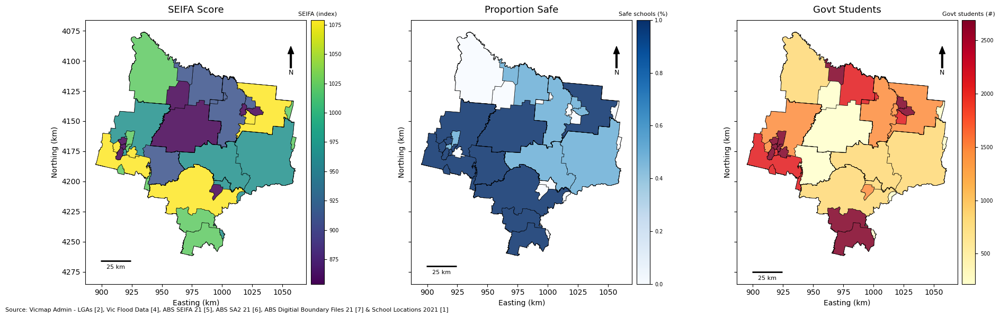

In [48]:
# --- Choropleth Maps of Socioeconomic Score, Flood Safety, and Student Population by SA2 ---

# Define variables to visualize, their titles, colorbar labels, and colormaps
cols   = ['Score','safe','students']
titles = ['SEIFA Score','Proportion Safe','Govt Students']
cbLabs = ['SEIFA (index)','Safe schools (%)','Govt students (#)']
cmaps  = ['viridis','Blues','YlOrRd']

# Create side-by-side plots
fig, axs = plt.subplots(1,3,figsize=(19,6),sharex=True,sharey=True)

for i,(v,ttl,cbarLab,cmap) in enumerate(zip(cols,titles,cbLabs,cmaps)):
    ax = axs[i]
    
    # choropleth
    arealGDF.plot(column=v, cmap=cmap, scheme='quantiles', k=5,
                  edgecolor='k', linewidth=0.5, alpha=0.85,
                  legend=False, ax=ax)
    lgaGDF.boundary.plot(ax=ax, edgecolor='black', linewidth=0.5, alpha=0.85)
    
    # orientation arrow
    ax.annotate('N', xy=(0.93,0.90), xytext=(0.93,0.80),
                arrowprops=dict(facecolor='black', width=2, headwidth=8, headlength=10),
                ha='center', va='center', fontsize=9, xycoords='axes fraction')
    
    # scale bar
    sx = ax.get_xlim()[0] + 12500
    sy = ax.get_ylim()[0] +  5000
    ax.hlines(y=sy, xmin=sx, xmax=sx+25000, colors='black', linewidth=2)
    ax.text(x=sx+12500, y=sy-6500, s='25 km', ha='center', fontsize=8)
    
    # axes & title
    ax.set_xlabel('Easting (km)', fontsize=10)
    ax.set_ylabel('Northing (km)', fontsize=10)
    ax.xaxis.set_major_formatter(mtick.FuncFormatter(lambda x,_:f'{x/1000:.0f}'))
    ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda y,_:f'{abs(y)/1000:.0f}'))
    ax.set_title(ttl, fontsize=13, pad=10)
    
    # colour-bar
    sm = plt.cm.ScalarMappable(cmap=cmap,
                               norm=plt.Normalize(vmin=arealGDF[v].min(),
                                                  vmax=arealGDF[v].max()))
    sm._A = []
    cbar = fig.colorbar(sm, ax=ax, fraction=0.045, pad=0.015)
    cbar.ax.set_title(cbarLab, fontsize=8, pad=6)
    cbar.ax.tick_params(labelsize=7)

fig.text(0.01,0.01,'Source: Vicmap Admin - LGAs [2], Vic Flood Data [4], ABS SEIFA 21 [5], ABS SA2 21 [6], ABS Digitial Boundary Files 21 [7] & School Locations 2021 [1]', fontsize=8, ha='left')
plt.tight_layout()
plt.show()


> **Map Interpretation**
>
> The three choropeth maps visualize spatital variation of three key variables across SA2s in the study area. Together, these maps provide insight into where vulnerable populations and infrastructure risk intersect.
> 
> From SEIFA Score map, key findings include:
> - Areas with **low SIEFA score (purple/blue) are more disadvantaged.**
> - These low-SEIFA zones are concentrated in **central and some western SA2s**, indicating regional socio-economic vulnerability.
> - Higher-SEIFA (yellow) areas are more concentrated in the **north and southeast**
> 
> From Proportion of Safe Schools map, key findings include:
> - **Lighter blue and white areas** highlight SA2s where some or all schools are **flood-exposed**.
> - **Dark blue areas** indicates **100% flood-safe schools.**
> - Some **moderately disadvantaged areas in the north** also have **lower safety proportions**
> 
> From Government School Students map, key findings include:
> - Darker red areas indicates higher student populations
> - Student populations concentrates in the **center of Greater Sheeparton and Greater Bendigo, and the southern Mitchell Shire.**
> - Some of the **high-enrolment areas have partial flood exposure**, highlighting flooding could disrupt a large number of students.
> 

### <a id='toc5_3_1_'></a>[Global Autocorrelation](#toc0_)

Global spatial autocorrelation assesses whether similar values of the three key variable (SEIFA scores, school safety, and number of students) are spatially clustered across an entire study area. It tests whether adjacent or nearby SA2s tend to have similar or dissimilar values. In global spatial autocorrelation, the global statistics summarize this pattern across the whole region.

- Positive autocorrelation means that similar values ( e.g. high with high or low with low) are clustered together. 
- Negative autocorrelation means that dissimilar values (e.g. high next to low) are more common.
- No autocorrelation implies spatial randomness.

**Autocorrelation Indices**

Moran’s I is a global measure of spatial autocorrelation based on value similarity. It takes into account feature locations and attributes values. Geary’s C is more sensitive to local variation, focusing on differences between values. General G identifies hotspots of high values or coldspots of low values across the region.

| Statistics     | What It Measures                           | Value Range | Interpretation                                         |
| ------------- | ------------------------------------------ | ----------- | ------------------------------------------------------ |
| **Moran’s I** | Correlation of variable with its neighbors | -1 to +1    | > 0: clustering, < 0: dispersion, ≈ 0: random          |
| **Geary’s C** | Dissimilarity between neighbors            | 0 to 2      | < 1: clustering, > 1: dispersion, ≈ 1: random          |
| **General G** | Intensity of high or low value clustering  | ≥ 0         | High G: high-value clusters; Low G: low-value clusters |

As these autocorrelation indices are inferential statistics, hypothese testings were conducted to test the statistical significance of the result at 5% confidence interval. The Null hypothesis is there is a complete CSR and clusters don't exist.


#### <a id='toc5_3_1_1_'></a>[Moran’s 𝐼 Index, Geary’s 𝐶, General G-Statistic](#toc0_)

In [49]:
# --- Global Spatial Autocorrelation Analysis for SEIFA, Safe Schools, and Students ---

# Step 1: Create spatial weight matrix using Queen contiguity
wSA2=libpysal.weights.Queen.from_dataframe(arealGDF)
wSA2.transform='r'

# Step 2: Compute spatial statistics for selected variables
out=[]
for v in ['Score','safe','students']:
    x=arealGDF[v].fillna(0).values # Replace NaNs with 0s before analysis
    out.append({
        'var':v,
        'I':round(esda.Moran(x,wSA2).I,3),
        'pI':round(esda.Moran(x,wSA2).p_sim,4),
        'C':round(esda.Geary(x,wSA2).C,3),
        'pC':round(esda.Geary(x,wSA2).p_sim,4),
        'G':round(G(x,wSA2).G,3),
        'pG':round(G(x,wSA2).p_sim,4)
    })
pd.DataFrame(out)

,var,I,pI,C,pC,G,pG
0,Score,0.147,0.025,0.805,0.028,0.090,0.234
1,safe,0.125,0.048,0.983,0.412,0.193,0.005
2,students,0.448,0.002,0.653,0.003,0.082,0.232


> **Table Interpretation**
>
> 
> From the table, key findings include:
> - **SEIFA Score** shows mild but significant clustering of similar SEIFA scores. Disadvantaged areas tend to cluster.
> - **Proportion Safe** has a weak global clustering overall (Moran’s I), but hotspots of safe areas detected by General G. 
> - **Govt Students** is strongly clustered. SA2s with many students group together while low-student areas form their own cluster.  
>
> According to the findings of choropleth maps and table, we can conclude:
> 1. The central study area (dark-purple on the SEIFA map) matches the **positive clustering for disadvantage areas. ** 
> 2. Those SA2s that are light-blue/white in the safety map confirms **low-safety areas occur together**.  
> 3. SA2s with **high SEIFA and high safety** underlines the hot-spot detected by General G. 
> 4. Deep-red student counts concentrate inside the low-SEIFA and low-safety belt.
> 5. Peripheral SA2s not only enjoy **higher SEIFA and safety** but also host **fewer government students**.  
 


### <a id='toc5_3_2_'></a>[Local Autocorrelation](#toc0_)
Local spatial autocorrelation examines spatial patterns at a local scale, identifying where clusters or outliers occur. Unlike global statistics, local statistics detect specific areas of:
- High-High (HH) clusters: areas with high values surrounded by other high values
- Low-Low (LL) clusters: areas with low values near other low values
- Outliers: high values next to low values (HL), or low values near high values (LH)

**Autocorrelation Indices**


| Statistics           | Purpose                                                                                                                   | Interpretation                            |
| ------------------- | ------------------------------------------------------------------------------------------------------------------------- | ----------------------------------------- |
| **Local Moran’s I** | Measures spatial association **for each SA2**. Identifies clusters (HH, LL) and outliers (HL, LH).                        | Local clusters and spatial anomalies      |
| **Getis-Ord Gi**    | Detects **spatial concentrations** of high or low values.                                                                 | A local version of the global G statistic |
| **Getis-Ord Gi\***  | Similar to Gi but uses a **standardized z-score**, highlighting statistically significant **hotspots** and **coldspots**. | Hot/cold spot detection                   |

We conducted local autocorrelation for the three variables. First, we computed local moran's I for each SA2 to determine the magnitude of local spatial autocorrelation. P-value is also computed to determine the significance for identifying meaningful clusters. Moran Quadrants (HH, LL, HL, LH) that are statistically significant are illustrated in the Local Moran I and Quadrant Maps. Last, Gi* z-scores were computed to classify areas into hotspots (high-high) and coldspots (low-low).

#### <a id='toc5_3_2_1_'></a>[Local Moran’s 𝐼 Index, Getis-Ord 𝐺𝑖 and 𝐺𝑖∗ statistics](#toc0_)

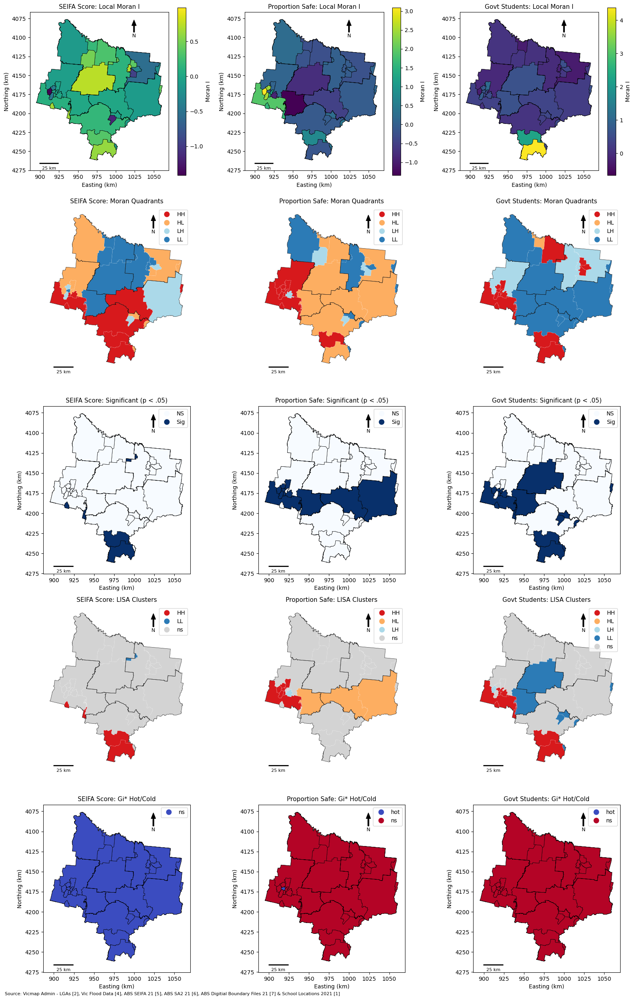

In [50]:
# --- Local Spatial Autocorrelation Analysis (LISA, Gi*) Across SEIFA, Flood Safety, and Student Population ---

# Step 1: Define KNN spatial weights (k=5) and row-standardize
wSA2 = weights.KNN.from_dataframe(arealGDF, k=5)
wSA2.transform = "R" 

# Step 2: Define variables and visualization settings
cols   = ['Score', 'safe', 'students']
titles = ['SEIFA Score', 'Proportion Safe', 'Govt Students']
cbLabs = ['Moran I','Moran I','Moran I']
cmaps  = ['viridis', 'Blues', 'YlOrRd']

# Step 3: Create 5-row × 3-column plot grid 
fig, axs = plt.subplots(5, 3, figsize=(16, 25))

# Step 4: Loop through each variable and compute spatial statistics
for j, (v, ttl, cmap, cbarLab) in enumerate(zip(cols, titles, cmaps, cbLabs)):
    
    x     = arealGDF[v].fillna(0).astype(float).values
    lisa  = Moran_Local(x, wSA2)
    gi    = G_Local(x, wSA2, permutations=0)

    arealGDF[f'{v}_I']    = lisa.Is
    arealGDF[f'{v}_sig']  = lisa.p_sim < .05
    arealGDF[f'{v}_quad'] = lisa.q
    arealGDF[f'{v}_gi']   = np.select(
                                [(gi.p_norm < .05) & (gi.Zs > 0),
                                 (gi.p_norm < .05) & (gi.Zs < 0)],
                                ['hot', 'cold'],
                                'ns'
                             )
    
    # Local Moran I values
    ax = axs[0, j]
    arealGDF.plot(column=f'{v}_I', cmap='viridis', k=5, edgecolor='k', linewidth=.5, ax=ax, legend=True, legend_kwds={'label': cbarLab})
    lgaGDF.boundary.plot(ax=ax, edgecolor='black', linewidth=0.5, alpha=.85)
    ax.set_title(f'{ttl}: Local Moran I', fontsize=11)

    
    # Quadrant map
    ax = axs[1, j]
    lisa_cluster(lisa, arealGDF, p=1, ax=ax)
    lgaGDF.boundary.plot(ax=ax, edgecolor='black', linewidth=0.5, alpha=.85)
    ax.set_title(f'{ttl}: Moran Quadrants', fontsize=11)
    
    # Significant vs NS
    ax = axs[2, j]
    arealGDF.assign(sig=arealGDF[f'{v}_sig'].map({True: 'Sig', False: 'NS'})) \
            .plot(column='sig', cmap='Blues', categorical=True, edgecolor='k', linewidth=.5, ax=ax, legend=True)
    lgaGDF.boundary.plot(ax=ax, edgecolor='black', linewidth=0.5, alpha=.85)
    ax.set_title(f'{ttl}: Significant (p < .05)', fontsize=11)

    # LISA clusters (p < .05)
    ax = axs[3, j]
    lisa_cluster(lisa, arealGDF, p=.05, ax=ax)
    lgaGDF.boundary.plot(ax=ax, edgecolor='black', linewidth=0.5, alpha=.85)
    ax.set_title(f'{ttl}: LISA Clusters', fontsize=11)
    
    # Gi* hot/cold spots
    ax = axs[4, j]
    arealGDF.plot(column=f'{v}_gi', categorical=True, cmap='coolwarm',
                  edgecolor='k', linewidth=0.5, ax=ax, legend=True)
    lgaGDF.boundary.plot(ax=ax, edgecolor='black', linewidth=0.5, alpha=.85)
    ax.set_title(f'{ttl}: Gi* Hot/Cold', fontsize=11)

# Step 5: Add north arrows, scale bars, axis labels to each subplot
for r in range(5):
    for c in range(3):
        ax = axs[r, c]

        ax.annotate('N', xy=(0.75, 0.95), xytext=(0.75, 0.85),
                    arrowprops=dict(facecolor='black', width=2,
                                    headwidth=8, headlength=10),
                    ha='center', va='center', fontsize=9,
                    xycoords='axes fraction')
        
        sx = ax.get_xlim()[0] + 12_500
        sy = ax.get_ylim()[0] + 5_000
        ax.hlines(y=sy, xmin=sx, xmax=sx + 25_000,
                  colors='black', linewidth=2)
        ax.text(sx + 12_500, sy - 6_500, '25 km',
                ha='center', va='center', fontsize=8)
        
        ax.set_xlabel('Easting (km)', fontsize=10)
        ax.set_ylabel('Northing (km)', fontsize=10)

        ax.xaxis.set_major_formatter(
            mtick.FuncFormatter(lambda x, _: f'{x/1000:.0f}')
        )
        ax.yaxis.set_major_formatter(
            mtick.FuncFormatter(lambda y, _: f'{abs(y)/1000:.0f}')
        )
# Step 6: Data source footnote
fig.text(0.01,0.0005,'Source: Vicmap Admin - LGAs [2], Vic Flood Data [4], ABS SEIFA 21 [5], ABS SA2 21 [6], ABS Digitial Boundary Files 21 [7] & School Locations 2021 [1]', fontsize=8, ha='left')
plt.tight_layout()
plt.show()

> **Map Interpretation**
>
> The map displays the Local Moran’s I cluster patterns for government school flood exposure across Victorian SA2 regions. 
> 
> From **SEIFA Score** map, key findings include:
> - Adadvantaged SA2s grouped together in southern regions (H-H clusters in dark red).
> - Disdvantaged SA2s grouped in Northern and central areas (L-L cluster in dark blue). 
> - LISA & Gi* confirms significant pockets of disadvantage in the center.
>
> From **Proportion of Safe Schools** map, key findings include:
> - Low flood safety is locally concentrated in central and eastern SA2s (L-L clusters in dark blue).
> - High flood safety is locally concentrated in northwestern SA2s (H-H cluster in dark red). 
> - Gi* highlights broad hot zones of school safety
> 
> From **Government Students** map, key findings include:
> - High-enrolment areas are co-located in southern SA2s (H-H cluster in dark red).
> - Low-Low clusters in northest
> - LISA & Gi* confirms student populations are spatially segregated
> 
> In conclusion, this spatial pattern confirms **significant spatial clustering** of school flood exposure, reinforcing the need for localized adaptation strategies.

## <a id='toc5_4_'></a>[Raster Analysis](#toc0_)

### <a id='toc5_4_1_'></a>[Flood Risk Exposure for Schools](#toc0_)

This section analyzes terrain attributes (elevation, slope, and distance to the cloest flood zones) for each government school location in North Central Victoria using a Digital Elevation Model (DEM). The slope values are visualized as a background raster with local government area (LGA) boundaries overlaid to contextualize terrain variation across the region. Elevation values are categorized based on the threshold:

- **High elevation**: elevation >= 300m
- **Medium elevation**: 150 <= elevation < 300m
- **Low elevation**: elevation < 150m

The raster layers of elevation, slope, elevation risk code, and distance to flood are then sampled at each school’s location. The extracted values are assigned to each school as new attributes (`elev`, `slope`, `elev code`, `distFlood`). This allows further analysis on how terrain factors relate to flood exposure and spatial vulnerability.

#### <a id='toc5_4_1_1_'></a>[School Elevation](#toc0_)

In [51]:
# --- Terrain Derivatives and Flood Risk Sampling at School Locations ---

# Convert elevation array to float and mask NoData values
elev = dsArr.astype('float32')
elev[elev == -9999] = np.nan
demRD = rd.rdarray(elev, no_data=np.nan)
pxW = dsTransform.a
pxH = -dsTransform.e
demRD.geotransform = (0, pxW, 0, 0, 0, pxH)

# slope / aspect via TerrainAttribute
slopeDeg  = np.array(rd.TerrainAttribute(demRD, attrib='slope_degrees'))
aspectDeg = np.array(rd.TerrainAttribute(demRD, attrib='aspect'))
aspectDeg = np.where(slopeDeg < 1, -1, aspectDeg)

# elevation
elevArr = np.full(elev.shape, np.nan, dtype='uint8')
elevArr[elev < 150] = 2
elevArr[(elev >= 150) & (elev < 300)] = 1
elevArr[elev >= 300] = 0
elevLut = {0: 'High', 1: 'Medium', 2: 'Low'}

# Create binary mask for flood extent and compute Euclidean distance
floodMask = rasterize(
    [(geom, 1) for geom in floodGDF.geometry],
    out_shape = dsArr.shape,
    transform = dsTransform,
    fill = 0,
    dtype = 'uint8'
)

distFlood = distance_transform_edt(floodMask == 0) * dsTransform.a

# write temp 3-band raster
tmpMem = '/vsimem/derivs.tif'
with rasterio.open(tmpMem, 'w', driver='GTiff',
                   height=elev.shape[0], width=elev.shape[1],
                   count=4, dtype='float32', crs=dsCRS,
                   transform=dsTransform) as dst:
    dst.write(elev, 1)
    dst.write(slopeDeg, 2)
    dst.write(elevArr, 3)
    dst.write(distFlood,   4)

# sample at school points
xy = [(pt.x, pt.y) for pt in slLGA.geometry]
with rasterio.open(tmpMem) as src:
    sampleArr = np.array(list(src.sample(xy, indexes=[1, 2, 3, 4])))

# Add terrain variables back to school GeoDataFrame
slLGA['elev']    = sampleArr[:, 0]
slLGA['slope'] = sampleArr[:, 1]
slLGA['elev code'] = sampleArr[:, 2].astype('int8')
slLGA['elevation']  = slLGA['elev code'].map(elevLut)
slLGA['distFlood']  = sampleArr[:, 3]



A Slope calculation (degrees)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 2.62442                         ] (1% - 257.4s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 5.32483                         ] (1% - 525.0s - 1 threads)


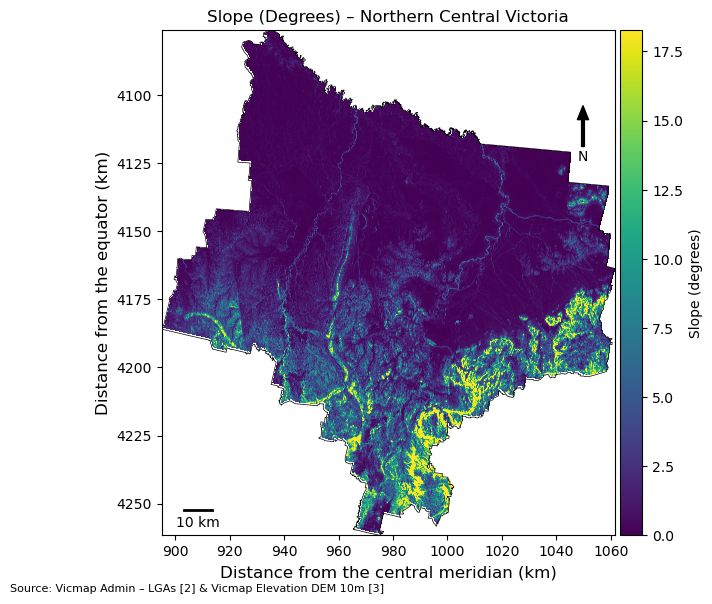

In [52]:
# --- Slope Raster Map of North Central Victoria ---

fig, ax = plt.subplots(figsize=(8, 6))

# Background: slope raster
slopeMasked = np.where(np.isnan(slopeDeg), np.nan, slopeDeg)
im = ax.imshow(
    slopeMasked,
    cmap='viridis',
    vmin=0,
    vmax=np.nanpercentile(slopeMasked, 98),
    extent=(dsTransform.c, dsTransform.c + dsTransform.a * slopeDeg.shape[1],
            dsTransform.f + dsTransform.e * slopeDeg.shape[0], dsTransform.f),
    origin='upper'
)

# LGA overlay
lgaGDF.dissolve().plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.5)

# North arrow
ax.annotate('N', xy=(0.93, 0.85), xytext=(0.93, 0.75),
            xycoords='axes fraction', textcoords='axes fraction',
            arrowprops=dict(facecolor='black', width=2, headwidth=8, headlength=10),
            ha='center', va='center', fontsize=10)

# Colorbar
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im, cax=cax, orientation='vertical').set_label('Slope (degrees)')

# Scale bar
minX = dsTransform.c
maxY = dsTransform.f
maxX = minX + dsTransform.a * slopeDeg.shape[1]
minY = maxY + dsTransform.e * slopeDeg.shape[0]

sbLength = 10000  # 10 km
sbX = minX + (maxX - minX) * 0.05
sbY = minY + (maxY - minY) * 0.05
ax.plot([sbX, sbX + sbLength], [sbY, sbY], color='black', linewidth=2)
ax.text(sbX + sbLength / 2, sbY - (maxY - minY) * 0.01, '10 km',
        ha='center', va='top', fontsize=10)

# Title and axis labels
ax.set_title('Slope (Degrees) – Northern Central Victoria', fontsize=12)
ax.set_xlabel('Distance from the central meridian (km)', fontsize=12)
ax.set_ylabel('Distance from the equator (km)', fontsize=12)

# Axis formatting (to km)
ax.xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f"{x / 1000:.0f}"))
ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda y, _: f"{abs(y) / 1000:.0f}"))
ax.set_aspect('equal')

# Data source
fig.text(0.01, 0.001, "Source: Vicmap Admin – LGAs [2] & Vicmap Elevation DEM 10m [3]", 
         fontsize=8, ha='left', va='bottom')

plt.tight_layout()
plt.show()


##### <a id='toc5_4_1_1_1_'></a>[Elevation Distribution: Flood vs Non-Flood Schools](#toc0_)

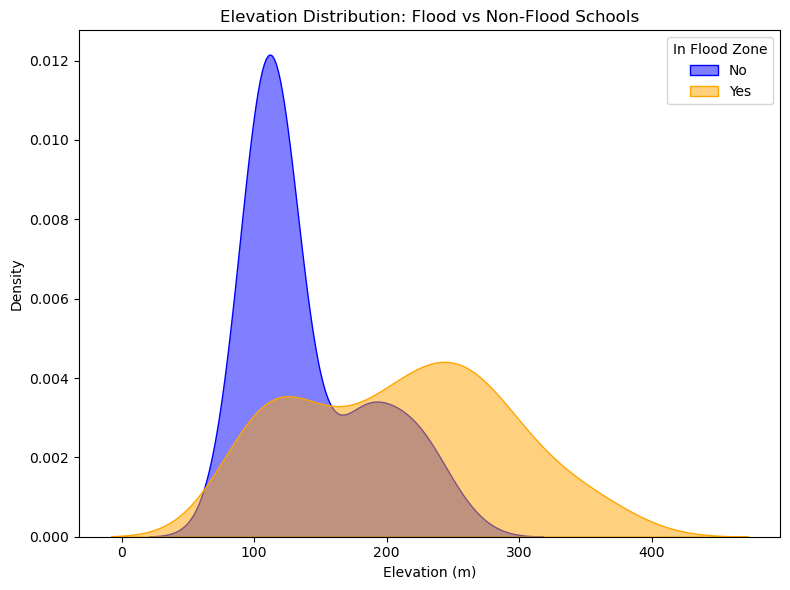

In [53]:
# --- KDE Plot: Elevation Distribution of Flooded vs Non-Flooded Schools ---
plt.figure(figsize=(8, 6))
sns.kdeplot(data=slLGA, x='elev', hue='inFlood', fill=True,
            palette={True: 'blue', False: 'orange'}, alpha=0.5, common_norm=False)

plt.xlabel('Elevation (m)')
plt.ylabel('Density')
plt.title('Elevation Distribution: Flood vs Non-Flood Schools')
plt.legend(title='In Flood Zone', labels=['No', 'Yes'])
plt.grid(False)
plt.tight_layout()
plt.show()

> **Table Interpretation**
>
> 
> From the table, key findings include:
> - High density of schools at 100m elevation is in flood zone
> - For those not in flood zone, the schools in ~250m are more than those in ~100m.
>
> In summary, the blue (flooded) curve skews toward lower elevations. It supports the assumption that lower terrain increases flood risk.
>
> 
>
> 
>
> 
>
> 
>
> 
>
> 

 

In [54]:
# Display the number of schools in each elevation risk category (High, Medium, Low)
display(pd.crosstab(slLGA['LGA Name'], slLGA['elevation']))

elevation,High,Low,Medium
LGA Name,,,
Campaspe (S),0,14,0
Greater Bendigo (C),0,3,30
Greater Shepparton (C),0,27,2
Mitchell (S),7,0,6
Strathbogie (S),0,1,5


In [55]:

# Keep only relevant columns for reporting, analysis, or export
slLGA = slLGA[['School Name', 'School Type', 'LGA Name', 'inFlood', 'elev', 'slope', 'elevation', 'distFlood', 'geometry']]
slLGA.head()

,School Name,School Type,LGA Name,inFlood,elev,slope,elevation,distFlood,geometry
1327,Euroa Secondary College,Secondary,Strathbogie (S),True,175.578033,0.943110,Medium,10.016418,POINT (1033513.851 -4182244.897)
298,Euroa Primary School,Primary,Strathbogie (S),True,176.013443,1.099187,Medium,0.000000,POINT (1034185.167 -4182056.560)
1080,Peranbin Primary College,Primary,Strathbogie (S),True,176.115799,0.165641,Medium,58.405254,POINT (1048356.878 -4169779.576)
217,Kialla Central Primary School,Primary,Greater Shepparton (C),True,116.133034,1.240186,Low,0.000000,POINT (1024688.363 -4147330.764)
585,Orrvale Primary School,Primary,Greater Shepparton (C),True,117.062592,0.096244,Low,0.000000,POINT (1025954.507 -4142727.648)


#### <a id='toc5_4_1_2_'></a>[Flood Exposed Govt Schools Percentage by LGAs](#toc0_)

In [56]:
# --- Summary Table: Proportion of Flood-Exposed Schools by LGA ---

# Create pivot table with count of flooded and total schools per LGA
pivot = slLGA.pivot_table(index='LGA Name', values='inFlood', aggfunc=['sum', 'count'])
pivot.columns = ['Flooded', 'Total']
pivot['% Flooded'] = (pivot['Flooded'] / pivot['Total'] * 100).round(1) # Calculate percentage of schools in flood zones

# Sort LGAs by flood exposure rate (descending)
pivot = pivot.sort_values('% Flooded', ascending=False)

pivot.style.format({'% Flooded': '{:.1f}'})

,Flooded,Total,% Flooded
LGA Name,,,
Greater Shepparton (C),20,29,69.0
Strathbogie (S),4,6,66.7
Campaspe (S),9,14,64.3
Greater Bendigo (C),10,33,30.3
Mitchell (S),1,13,7.7


>
> **Table Interpretation**
>
> The table presents the proportion of government schools within each LGA that are located in flood-prone zones, derived from overlaying school point data with flood extent raster layers. The percentage is calculated by dividing the number of schools within flood zones by the total number of government schools per LGA.
> 
> From the table, key findings include:
> - **Greater Shepparton** has the highest proportion of flood-exposed schools at 69.0%, with 20 of 29 schools located within flood zones. 
> - **Strathbogie and Campaspe** also show high exposure rates, with 66.7% and 64.3% of schools in flood zones, respectively.
> - **Greater Bendigo and Mitchell** has significantly lower percentage of schools in flood zones, at 30.03% and 7.7% respectively.
>
> In conclusion, the top three LGAs show more than 60% of schools exposed to flooding, indicating a high spatial concentration of educational vulnerability. The low exposure rate in Mitchell provides a useful reference point for best-practice school siting.
>
> 

#### <a id='toc5_4_1_3_'></a>[Primary and Secondary School Distances to Flood](#toc0_)

In [57]:
# --- Average Distance to Flood Zone by School Type and LGA ---

# Create pivot table showing the mean distance to flood zones
pivot = slLGA.pivot_table(index='LGA Name', columns='School Type', values='distFlood', aggfunc='mean').round(2)

pivot.style.format("{:.2f}")

School Type,Primary,Secondary
LGA Name,,
Campaspe (S),255.16,94.10
Greater Bendigo (C),1456.94,566.39
Greater Shepparton (C),287.01,0.00
Mitchell (S),5895.99,323.12
Strathbogie (S),212.95,10.02


>
> **Table Interpretation**
>
> The table summarizes the average distance in meters from each school to the nearest mapped flood zone in each LGA.
> 
> From the table, key findings include:
> - **Mitchell** has the largest average distances from flood zones for both primary (5895.99 m) and secondary schools (323.12 m)
> - **Greater Bendigo** schools are also generally located further from flood zones. 
> - **Greater Shepparton, Campaspe and Strathbogie** show much closer proximity, especially for secondary schools
>
> In conclusion, secondary schools are generally closer to flood zones than primary schools across all LGAs, which can better protect kids at a younger age. However, this may amplify disruption impacts due to more concentrated student populations in secondary school. Schools in Greater Shepparton, Campaspe, and Strathbogie have a higher risk of flooding.

### <a id='toc5_4_2_'></a>[Watershed Analysis](#toc0_)

This subsection performs a watershed analysis to simulate water flow patterns across the study area using a DEM. The process models how rainfall would flow downhill, identifying flow paths, potential accumulation zones, and watershed behavior.

Elevation pits or depressions in the DEM are filled using three sequential steps to ensure correct terrain:
- `fill_pits`: removes isolated low spots.
- `fill_depressions`: ensures flow continuity by removing broader basins.
- `resolve_flats`: adjusts flat areas to ensure directional flow.

In [58]:
# Load spatial grid metadata and DEM values
grid = Grid.from_raster(rasterPath)
demArr = grid.read_raster(rasterPath)

# Convert NoData values to NaN
nodata_val = grid.nodata 
dem = demArr.astype('float32')
dem[dem == nodata_val] = np.nan 

grid.mask = np.isfinite(dem) # True where elevation is valid
mask = grid.mask

In [59]:
# Fill sinks
pitDEM   = grid.fill_pits(dem, nodata_in=np.nan, nodata_out=np.NaN)
depDEM   = grid.fill_depressions(pitDEM, nodata_in=np.nan, nodata_out=np.NaN)
flatDEM  = grid.resolve_flats(depDEM, nodata_in=np.nan, nodata_out=np.NaN)

In [60]:
# Flow Direction
nodir = 0 # for 'no flow'
dirmap = (64, 128, 1, 2, 4, 8, 16, 32) # D8 direction 

# Compute D8 flow direction
flowD  = grid.flowdir(flatDEM,
                     nodata_in = np.nan,
                     nodata_out= nodir,
                     dirmap=dirmap,
                     routing   ='d8')

flowTemp = flowD.copy().astype(np.float32)
flowTemp[np.isnan(dem)] = np.NaN

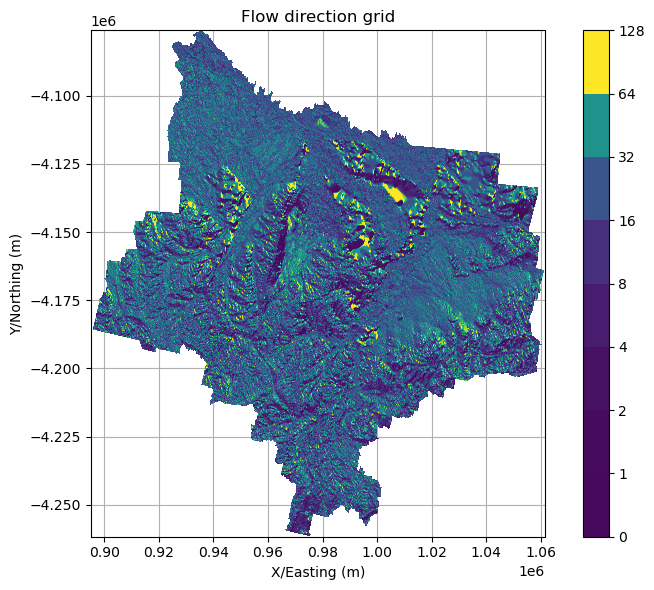

In [61]:
# --- Plot D8 Flow Direction Grid ---

fig = plt.figure(figsize=(8,6))
fig.patch.set_alpha(0)

plt.imshow(flowTemp, extent = grid.extent, cmap='viridis', zorder=2)

# Add colorbar with D8 direction values
boundaries = ([0] + sorted(list(dirmap)))
plt.colorbar(boundaries= boundaries,
             values=sorted(dirmap))
plt.xlabel('X/Easting (m)')
plt.ylabel('Y/Northing (m)')
plt.title('Flow direction grid', size=12)
plt.grid(zorder=-1)

plt.tight_layout()
plt.show()

>
> **Map Interpretation**
>
> The flow direction map shows how water will move across the landscape. Flow directions are calculated using the D8 algorithm, where each cell routes water to one of its 8 neighbors (N, NE, E, SE, S, SW, W, NW).
> 

In [62]:
# Flow accumulation
flowAcc = grid.accumulation(flowTemp, nodata_out=np.NaN, dirmap=dirmap, routing='d8')
accTemp = flowAcc.copy().astype(np.float32)
accTemp[np.isnan(demArr)] = np.NaN

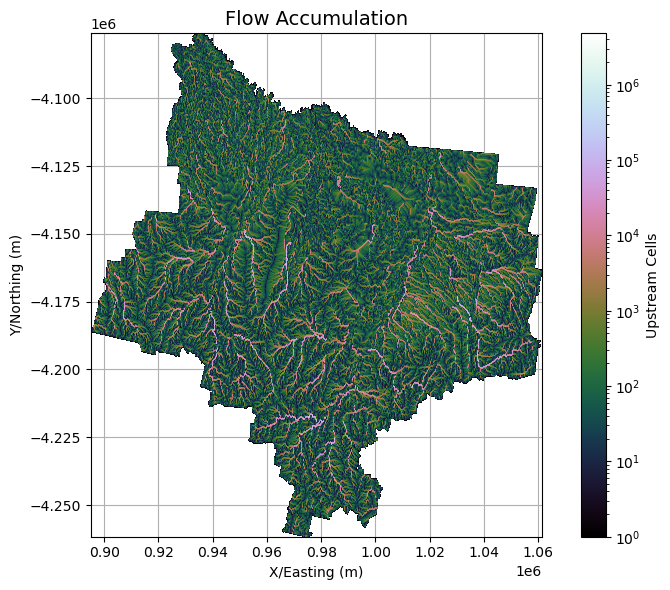

In [63]:
# --- Plot Flow Accumulation Grid ---

fig, ax = plt.subplots(figsize=(8,6))
fig.patch.set_alpha(0)
plt.grid('on', zorder=0)
im = ax.imshow(accTemp, extent=grid.extent, zorder=2,
               cmap='cubehelix',
               norm=colors.LogNorm(1, np.nanmax(accTemp)),
               interpolation='bilinear')

# Add colorbar
plt.colorbar(im, ax=ax, label='Upstream Cells')
plt.title('Flow Accumulation', size=14)
plt.xlabel('X/Easting (m)')
plt.ylabel('Y/Northing (m)')

plt.tight_layout()
plt.show()

>
> **Map Interpretation**
>
> Flow accumulation computes the number of upstream cells that drain through it. Areas with high accumulation values represent major drainage lines, valleys, or streams.
> 

In [64]:
gridTemp = copy.deepcopy(grid)

#### <a id='toc5_4_2_1_'></a>[Random Pour Point](#toc0_)

This part of the raster-based hydrological analysis simulates how surface water would drain into and through a selected bore point. It models the contributing catchment, identifies drainage channels, and visualizes the stream network using flow direction and accumulation data derived from the DEM. 

Here, we chose a random bore point (1,000,000 E, –4,200,000 N). Thos point is automatically snapped to the nearest cell with high flow accumulation (>10,000 upstream cells). The model then delineates the contributing catchment area that drains to this snapped outlet using the flow direction grid. This outlines the hydrological basin surrounding the pour point. 

Afterwards, the analysis was extended to the entire study area, extracting a broader stream network by applying a higher accumulation threshold (>75,000) to identify major rivers and tributaries, and converting these flow paths into vector format (LineStrings) and storing them in a GeoDataFrame.

In [65]:
# --- Catchment Delineation from Flow Direction Grid ---

# Example point in projected coordinates (Easting, Northing)
x, y = 1e6, -4.2e6 

# Snap pour point to a high-flow cell (>10,000 upstream cells)
xSnap, ySnap = gridTemp.snap_to_mask(accTemp > 10000, (x, y))

# Delineate catchment area upstream of the snapped point
catch = gridTemp.catchment(x=xSnap, y=ySnap, fdir=flowD, dirmap=dirmap, xytype='coordinate')


gridTemp.clip_to(catch)
clipCatch = gridTemp.view(catch)

Text(0.5, 1.0, 'Delineated Catchment')

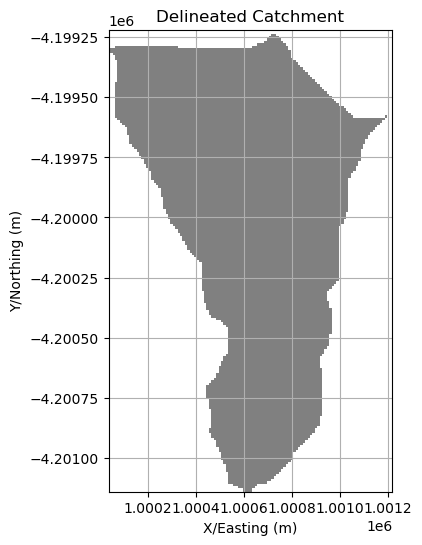

In [66]:
# --- Plot Delineated Catchment Area ---

fig, ax = plt.subplots(figsize=(8,6))
fig.patch.set_alpha(0)

plt.grid('on', zorder=0)

# Display catchment area mask
im = ax.imshow(np.where(clipCatch, clipCatch, np.nan), extent = gridTemp.extent,
               zorder=1, cmap='Greys_r', alpha = 0.5)
plt.xlabel('X/Easting (m)')
plt.ylabel('Y/Northing (m)')
plt.title('Delineated Catchment', size = 12)

In [67]:
# Extract stream network
streamNet = gridTemp.extract_river_network(flowD, accTemp > 100, dirmap=dirmap)

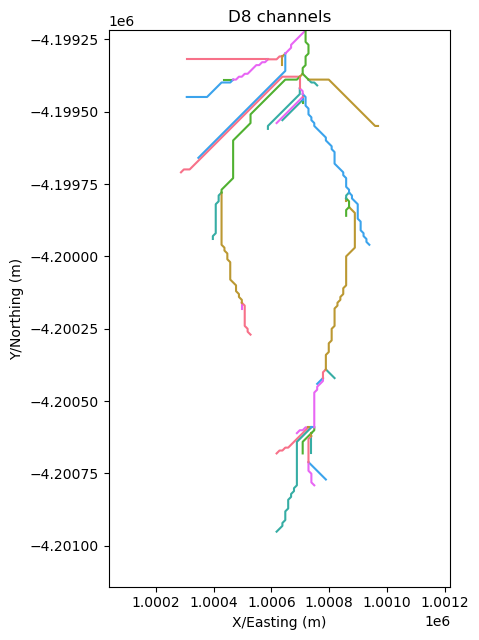

In [68]:
# --- Plot Extracted D8 Stream Network with Outlet Point ---

sns.set_palette('husl')
fig, ax = plt.subplots(figsize=(8.5,6.5))

# Set map extent using raster bounding box
plt.xlim(gridTemp.bbox[0], gridTemp.bbox[2])
plt.ylim(gridTemp.bbox[1], gridTemp.bbox[3])
ax.set_aspect('equal')

# Plot each stream segment from the extracted stream network
for branch in streamNet['features']:
    line = np.asarray(branch['geometry']['coordinates'])
    plt.plot(line[:, 0], line[:, 1])
    
# Mark the snapped pour point on the map
ax.plot(x, y, 'k', marker = 'o', markersize = 10)

_ = plt.title('D8 channels', size=12)

plt.xlabel('X/Easting (m)')
plt.ylabel('Y/Northing (m)')

plt.tight_layout()
plt.show()

>
> **Map Interpretation**
>
> Within the delineated catchment, the model traces D8 flow paths, representing small-scale stream segments that water would follow.

In [69]:
# Extract stream network
streamNet = grid.extract_river_network(flowD, accTemp > 75_000, dirmap=dirmap)

In [70]:
# Extract valid line geometries from the stream network
lines = [
    LineString(f["geometry"]["coordinates"])
    for f in streamNet["features"]
    if f["geometry"]["type"] == "LineString" and len(f["geometry"]["coordinates"]) > 1
]

streamGDF = gpd.GeoDataFrame(geometry=lines, crs=slLGA.crs)
streamGDF = streamGDF[streamGDF.length > 0].reset_index(drop=True)
streamUnion = streamGDF.unary_union

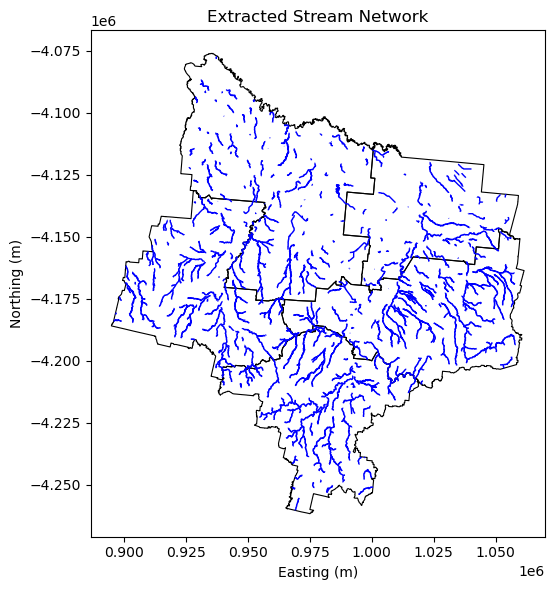

In [71]:
# --- Plot Extracted D8 Stream Network Over LGA Boundaries ---

fig, ax = plt.subplots(figsize=(8, 6))
lgaGDF.boundary.plot(ax=ax, edgecolor='black', linewidth=0.8)
streamGDF.plot(ax=ax, color='blue', linewidth=1, label='Streams')

# Add plot title and axis labels
ax.set_title('Extracted Stream Network', fontsize=12)
ax.set_xlabel('Easting (m)')
ax.set_ylabel('Northing (m)')
plt.tight_layout()
plt.show()


>
> **Map Interpretation**
>
> The Extracted Steam Network map shows how water detains and illustrates the stream network in the study area.

#### <a id='toc5_4_2_2_'></a>[Drainage-Based School Flood Exposure](#toc0_)

This subsection integrates stream proximity, catchment delineation, and terrain-derived features to score each school based on its potential flood vulnerability. This goes beyond simple "in flood zone or not" logic and considers hydrological context, catchment size, and relative elevation.

First of all, schools were snapped to the nearest stream segment within 1 km. If distance of school point to the stream network is within 1km, it’s flagged as `inDrain = True`, meaning it's in drain zone. Next, ror each `inDrain` school, a catchment area was delineated using the flow direction grid and stored as a polygon for spatial analysis. This step is to identify the upstream area contributing runoff to each school. Larger catchments mean more potential water volume and higher risk. Then, catchments were analyzed to derive two key flags for each school:
- `floodIntersect`: Does the school’s catchment intersect the mapped 1-in-100-year flood extent?
- `largeWS`: Is the catchment larger than 25 km², which has higher runoff potential? 

Last, each school is assigned a composite risk score (0–5) based on five binary/ordinal indicators:
| **Risk Factor**            | **Variable**     | **Score Contribution**                               |
| -------------------------- | ---------------- | ----------------------------------                   |
| In Drainage Network        | `inDrain`        | +1 (True), 0 (False)                                 |
| Catchment intersects flood | `floodIntersect` | +1 (True), 0 (False)                                 |
| Large catchment area       | `largeWS`        | +1 (True), 0 (False)                                 |
| Directly in flood extent   | `inFlood`        | +1 (True), 0 (False)                                 |
| Elevation class            | `elevation`      | +1 (Low), +0.5 (Medium), +0 (High)                   |


The total score is the sum of all five factors:
- 0–1.5 = **Low Risk**
- 1.6–3.5 = **Medium Risk**
- 3.6–5.0 = **High Risk**



In [72]:
# --- Snap Schools to Nearest Stream (Within 1 km) and Flag Drainage Proximity ---

snapDist = 1000  # Maximum snapping distance in meters

def snapPt(pt, lineUnion):
    n = nearest_points(pt, lineUnion)[1] # Find closest point on stream
    return n if pt.distance(n) <= snapDist else None

snapPts, schIdx = [], []

# Loop through each school
for i, r in slLGA.iterrows():
    p = snapPt(r.geometry, streamUnion)
    if p:
        snapPts.append(p)
        schIdx.append(i)

# Create GeoDataFrame for snapped schools
snapGDF = gpd.GeoDataFrame(
    slLGA.loc[schIdx, ['School Name', 'LGA Name']],
    geometry=snapPts,
    crs=slLGA.crs
)
snapGDF['inDrain'] = True # Flag for schools within stream drainage network

# Update original school GeoDataFrame to include 'inDrain' flag
slLGA.loc[snapGDF.index, 'inDrain'] = True
slLGA['inDrain'] = slLGA['inDrain'].fillna(False)

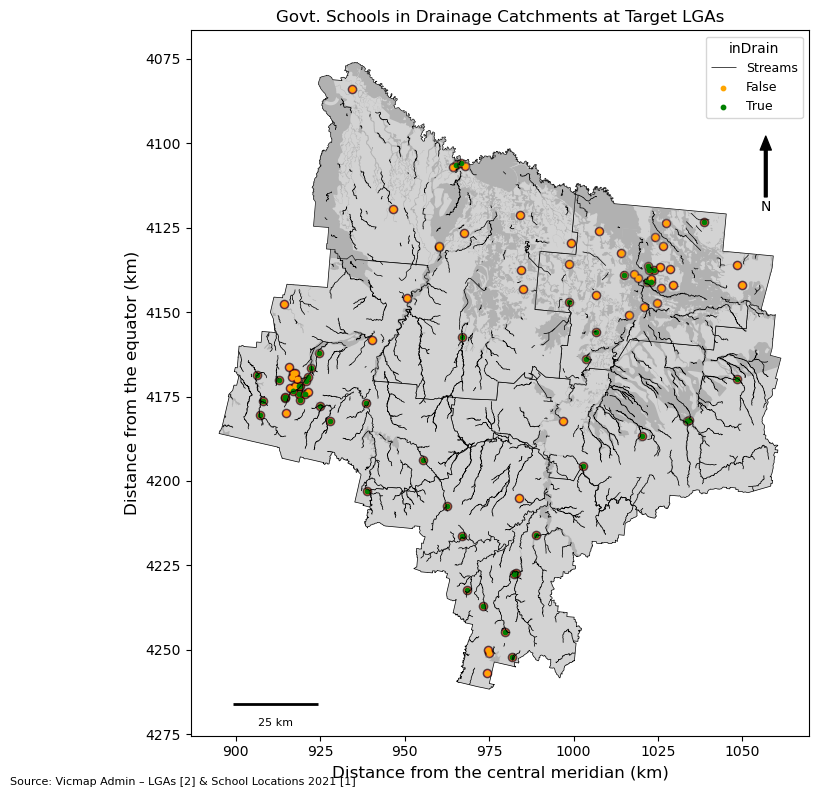

In [73]:
# --- Map of Government Schools in Drainage Catchments and Flood Zones ---

fig, ax = plt.subplots(figsize=(10, 8))

lgaGDF.plot(ax=ax, facecolor='lightgrey', edgecolor='black', linewidth=0.5)
slLGA.plot(ax=ax, facecolor='red', edgecolor='black', linewidth=1, alpha=0.6)
floodLGA.plot(ax=ax, color='grey', alpha=0.4, label='1 in 100 Year Flood Extent')
streamGDF.plot(ax=ax, color='black', linewidth=0.5, label='Streams')

cmap = {True: 'green', False: 'orange'}

for status, group in slLGA.groupby('inDrain'):
    group.plot(ax=ax, markersize=10, label=status, linestyle='None', color=cmap[status])

# Orientation
ax.annotate('N', xy=(0.93, 0.85), xytext=(0.93, 0.75),
            arrowprops=dict(facecolor='black', width=2, headwidth=8, headlength=10),
            ha='center', va='center', fontsize=10, xycoords='axes fraction')

# Legend
ax.legend(title="inDrain", loc='upper right', fontsize=9, title_fontsize=10)

# Title and Labels
ax.set_title("Govt. Schools in Drainage Catchments at Target LGAs", fontsize=12)
ax.set_xlabel("Distance from the central meridian (km)", fontsize=12)
ax.set_ylabel("Distance from the equator (km)", fontsize=12)

# Scale Bar
sclX = ax.get_xlim()[0] + 12_500
sclY = ax.get_ylim()[0] + 5_000
ax.hlines(y=sclY, xmin=sclX, xmax=sclX + 25_000, colors='black', linewidth=2)
ax.text(s='25 km', x=sclX + 12_500, y=sclY - 6_500, ha='center', fontsize=8)

# Axis Formatting
ax.xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f"{x / 1000:.0f}"))
ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda y, _: f"{abs(y) / 1000:.0f}"))

# Source Annotation
fig.text(0.01, 0.01, "Source: Vicmap Admin – LGAs [2] & School Locations 2021 [1]", 
         fontsize=8, ha='left', va='bottom')

plt.tight_layout()
plt.show()

>
> **Map Interpretation**
>
> This map displays the spatial relationship between government schools and the extracted stream network across the selected LGAs. Green points indicate schools located within a defined drainage catchment. Orange points indicate schools outside of catchment boundaries. From the map, several clusters of schools are in drainage network in Greater Bendigo and Greater Shepparton. These schools may be more susceptible to overland runoff or upstream catchment impacts, even if not within a formal flood extent.
>
> 
> 
> 
> 


In [74]:
# Delineate Individual Catchments

seen = {}
catchPolys, catchIdx, catchGroup = [], [], []

# Loop through each school snapped to a stream 
for i, r in snapGDF.iterrows():
    x, y = r.geometry.x, r.geometry.y
    xSnap, ySnap = grid.snap_to_mask(accTemp > 10000, (x, y))

    key = (round(xSnap, 1), round(ySnap, 1))

    if key in seen:
        # Reuse existing group ID if catchment already processed
        group_id = seen[key]
    else:
        # Assign new group ID and store key
        group_id = len(seen)
        seen[key] = group_id

        # Compute upstream catchment mask using D8 flow directions
        mask = grid.catchment(
            x=xSnap, y=ySnap,
            fdir=flowTemp,
            dirmap=dirmap,
            nodata=-9999,
            as_mask=True,
            xytype='coordinate'
        )

        # Convert raster catchment mask to polygon geometry
        geom = [shape(s) for s, v in shapes(
            mask.astype('uint8'),
            mask=mask.astype('uint8'),
            transform=grid.affine
        ) if v == 1]

        # Store resulting catchment 
        if geom:
            catchPolys.append(geom[0])
            catchIdx.append(i)
            catchGroup.append(group_id)

# Create GeoDataFrame with catchment polygons
catchGDF = gpd.GeoDataFrame(
    {'schlIdx': catchIdx, 'groupID': catchGroup},
    geometry=catchPolys,
    crs=slLGA.crs
)


In [75]:
dissolvedCatch = catchGDF.dissolve(by='groupID').reset_index()

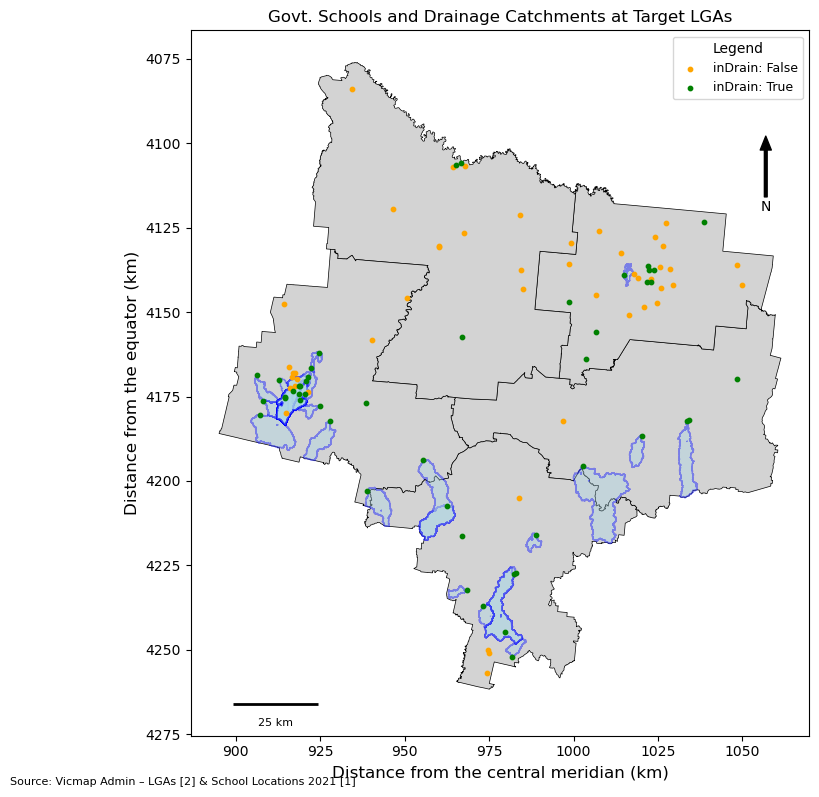

In [76]:
# --- Map of Government Schools and Their Drainage Catchments ---

fig, ax = plt.subplots(figsize=(10, 8))

# Base LGA map
lgaGDF.plot(ax=ax, facecolor='lightgrey', edgecolor='black', linewidth=0.5)

# Catchments
dissolvedCatch.plot(ax=ax, facecolor='lightblue', edgecolor='blue', alpha=0.4, linewidth=1, label='Catchments')

# Schools colored by inDrain
cmap = {True: 'green', False: 'orange'}
for status, group in slLGA.groupby('inDrain'):
    group.plot(ax=ax, markersize=10, label=f'inDrain: {status}', linestyle='None', color=cmap[status])

# Orientation arrow
ax.annotate('N', xy=(0.93, 0.85), xytext=(0.93, 0.75),
            arrowprops=dict(facecolor='black', width=2, headwidth=8, headlength=10),
            ha='center', va='center', fontsize=10, xycoords='axes fraction')

# Legend
ax.legend(loc='upper right', fontsize=9, title='Legend', title_fontsize=10)

# Title and axis labels
ax.set_title("Govt. Schools and Drainage Catchments at Target LGAs", fontsize=12)
ax.set_xlabel("Distance from the central meridian (km)", fontsize=12)
ax.set_ylabel("Distance from the equator (km)", fontsize=12)

# Scale bar
sclX = ax.get_xlim()[0] + 12_500
sclY = ax.get_ylim()[0] + 5_000
ax.hlines(y=sclY, xmin=sclX, xmax=sclX + 25_000, colors='black', linewidth=2)
ax.text(s='25 km', x=sclX + 12_500, y=sclY - 6_500, ha='center', fontsize=8)

# Axis formatting (convert to km)
import matplotlib.ticker as mtick
ax.xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f"{x / 1000:.0f}"))
ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda y, _: f"{abs(y) / 1000:.0f}"))

# Source annotation
fig.text(0.01, 0.01, "Source: Vicmap Admin – LGAs [2] & School Locations 2021 [1]", 
         fontsize=8, ha='left', va='bottom')

plt.tight_layout()
plt.show()


>
> **Map Interpretation**
>
> This map illustrates the spatial distribution of government schools in relation to delineated drainage catchments across the selected LGAs. Blue polygons represent drainage catchments. This map shows several schools in Greater Shepparton and Mitchell lie within drainage catchments. These schools may be more vulnerable to surface runoff.

In [77]:
# Calculate catchment area in square kilometers
catchGDF['areaKM'] = catchGDF.area / 1e6
wsThresh = 25  # Define a threshold for large catchments

# Check whether each catchment intersects with the 1-in-100 year flood zone
catchGDF['floodIntersect'] = catchGDF.intersects(floodLGA.unary_union)
catchGDF['largeWS'] = catchGDF['areaKM'] > wsThresh

# Join catchment attributes 
slLGA = slLGA.join(
    catchGDF.set_index('schlIdx')[['floodIntersect', 'largeWS']],
    how='left'
).fillna({
    'floodIntersect': False,
    'largeWS': False
})

In [78]:
# Calculate cumulative risk score based on multiple spatial factors
slLGA['risk score'] = (
      slLGA['inDrain'].map({True: 1, False: 0})
    + slLGA['floodIntersect'].map({True: 1, False: 0})
    + slLGA['largeWS'].map({True: 1, False: 0})
    + slLGA['inFlood'].map({True: 1, False: 0})
    + slLGA['elevation'].map({'Low': 1, 'Medium': 0.5, 'High': 0})
)

# Categorize risk score into qualitative levels
slLGA['Risk'] = pd.cut(
    slLGA['risk score'],
    bins=[-0.1, 1.5, 3.5, 5],
    labels=['Low', 'Medium', 'High']
)

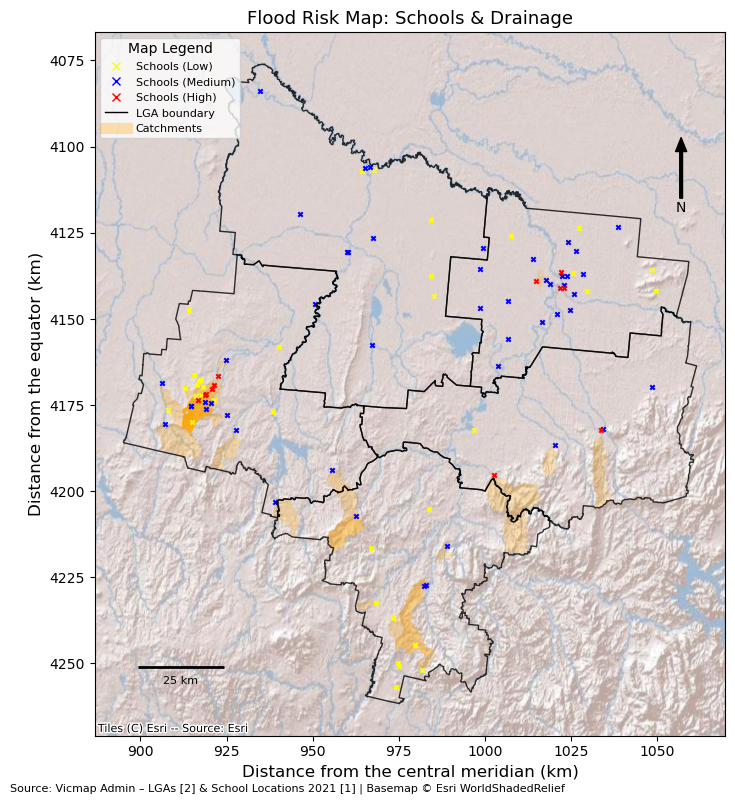

In [79]:
# --- Final Flood Risk Map: Schools and Drainage Catchments ---

fig, ax = plt.subplots(figsize=(10, 8))

# Catchments
catchGDF.plot(ax=ax, facecolor='orange', alpha=0.25, label='Catchments')

# Schools by risk level
cMap = {'Low': 'yellow', 'Medium': 'blue', 'High': 'red'}
for c, g in slLGA.groupby('Risk'):
    g.plot(ax=ax, markersize=10, color=cMap[c], marker='x', label=f'Schools ({c})')

# LGA boundaries
lgaGDF.boundary.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, alpha=0.8)

# Basemap
ctx.add_basemap(ax, crs='EPSG:7845', source=ctx.providers.Esri.WorldShadedRelief)

# Title & axis labels
ax.set_title('Flood Risk Map: Schools & Drainage', fontsize=13)
ax.set_xlabel('Distance from the central meridian (km)', fontsize=12)
ax.set_ylabel('Distance from the equator (km)', fontsize=12)

# Axis formatting to show km
ax.xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{x / 1000:.0f}'))
ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda y, _: f'{abs(y) / 1000:.0f}'))

# North arrow
ax.annotate('N', xy=(0.93, 0.85), xytext=(0.93, 0.75),
            arrowprops=dict(facecolor='black', width=2, headwidth=8, headlength=10),
            ha='center', va='center', fontsize=10, xycoords='axes fraction')

# Scale bar (25 km)
sclX = ax.get_xlim()[0] + 12_500
sclY = ax.get_ylim()[0] + 20_000
ax.hlines(y=sclY, xmin=sclX, xmax=sclX + 25_000, colors='black', linewidth=2)
ax.text(x=sclX + 12_500, y=sclY - 5_000, s='25 km', ha='center', fontsize=8)

# Custom legend
handles = [
    Line2D([], [], marker='x', color='yellow', linestyle='None', markersize=6, label='Schools (Low)'),
    Line2D([], [], marker='x', color='blue', linestyle='None', markersize=6, label='Schools (Medium)'),
    Line2D([], [], marker='x', color='red', linestyle='None', markersize=6, label='Schools (High)'),
    Line2D([], [], color='black', linewidth=1, label='LGA boundary'),
    Line2D([], [], color='orange', linewidth=8, alpha=0.3, label='Catchments')
]
ax.legend(handles=handles, loc='upper left', fontsize=8, title="Map Legend", title_fontsize=10, frameon=True)

# Source annotation
fig.text(0.1, 0.001,
         'Source: Vicmap Admin – LGAs [2] & School Locations 2021 [1] | Basemap © Esri WorldShadedRelief',
         fontsize=8, ha='left', va='bottom')

plt.tight_layout()
plt.show()


>
> **Map Interpretation**
>
> This map provides a comprehensive spatial overview of government school flood risk across the study area. Orange polygons are the drainage cathcments while the coloured markers represent schools categorised by flood risk level:
> - Red X: High flood risk schools
> - Blue X: Medium flood risk schools
> - Yellow X: Low flood risk schools
> 
> From the map, key findings include: 
> - **High-risk schools (red)** are concentrated in Greater Bendigo and Greater Shepparton, where schools tend to fall within catchment areas, close to flood zones, and sit at low elevations.
> - **Medium-risk schools (blue)** are more spatially dispersed but still align with moderately vulnerable catchments or terrain.
> - **Low-risk schools (yellow)** are also found Greater Bendigo, Greater Shepparton, Campaspe and Mitchell, where elevation is higher and drainage or flood exposure is minimal.
> 
> 
> 

___

# <a id='toc6_'></a>[Geographical Weighted Regression](#toc0_)

In this section, we conducted Geographically Weighted Regression (GWR) to analyze the flood exposure of government schools. This technique allows relationship between the dependent and independent variables to vary across space. Unlike global regression which estimates one single coefficient for each variable across the entire study area, GWR estimates local coefficients for each location, capturing spatial heterogeneity in the relationships. This is particularly useful for environmental or social phenomena like flood risk that are not spatially uniform. All relevant variables are defined as follows:

**Dependent Variable**
1. **`Proportion`**: proportion of government schools in each SA2 area that are not exposed to flooding
  $$
  \text{proportion} = 1 - \left(\frac{\text{flooded schools}}{\text{total schools}}\right)
  $$

**Independent Variables**
1. **`elevation`**
2. **`distFlood`**
3. **`floodIntersect`**
4. **`slope`**
5. **`inFlood`**
6. **`inDrain`** 
7. **`largeWS`** 

To make the model more interpretable and better targeted for flood risk planning, we developed a **parsimonious GWR model** which included only the most relevant environmental variables. This model can effecitvely predict the proportion of flood-safe schools across the SA2s in the study area compared to the full model with socioeconomic variables including SEIFA score and student population. 

Since `elevation` and `slope` are correlated, they are not independent to each other. Only elevation was used as elevation is more meaningful in the analysis. `DistFlood` and `inFlood` are similar parameters. `DistFlood` is continuous variable measuring distance of school to flood, so we only kept `DistFlood`. Likewise, `inDrain` and `largeWS` and `floodIntersection` are not independent, so only `floodIntersection` was kept. 

In summary, we aim to identify spatial variation in environmental factors that explain why some SA2 areas have a higher proportion of flood-safe schools than others using the parsimonious GWR model. The variables included in the parsimonious model are:

* **Dependent Variable**: **`proportion`**
* **Independent Variables**: **`elevation`, `distFlood`, `floodIntersect`**




### <a id='toc6_1_1_'></a>[Pre-Processing](#toc0_)

In [80]:
# Create GeoDataFrame with selected flood risk variables
point = slLGA[['elev', 'slope', 'inFlood', 'inDrain', 'distFlood', 'floodIntersect', 'largeWS', 'geometry']].copy()
point = point.rename(columns={
    'elev': 'elevation'
    })

# Prepare SA2-level data from arealGDF with socioeconomic and school counts
areal = arealGDF[['SA2 Name', 'LGA Name', 'Score', 'flooded', 'total', 'students', 'geometry']].copy()

areal = areal.rename(columns={
    'Score': 'seifa',
    'flooded': 'floodSchool',
    'total': 'totalSchool',
    'students': 'totalStudent',
    'SA2 Name': 'sa2Name'
})

# Spatial join: assign each school to the SA2 it falls within
joined = gpd.sjoin(point, areal, how='inner', predicate='within')

joined['sa2Name'] = joined.geometry.apply(
    lambda geom: areal.loc[areal.contains(geom), 'sa2Name'].values[0]
)

# Group by SA2 and compute SA2-level summaries of school attributes
data = joined.groupby('sa2Name').agg({
    'LGA Name': 'first', 
    'elevation': 'mean', 
    'slope': 'mean',
    'distFlood': 'mean',
    'inDrain': 'sum',
    'floodIntersect': 'sum',
    'largeWS': 'sum',
    'seifa': 'first',
    'floodSchool': 'first',
    'totalSchool': 'first',
    'totalStudent': 'first'
}).reset_index()

# Merge aggregated data back with SA2 geometries
dataGDF = areal[['sa2Name', 'geometry']].merge(data, on='sa2Name')
dataGDF = dataGDF.rename(columns={'sa2Name': 'SA2 Name'})
cols = [col for col in dataGDF.columns if col != 'geometry'] + ['geometry']
dataGDF = dataGDF[cols]

In [81]:
# Ensure School Count Columns Are Integer
dataGDF["floodSchool"]  = dataGDF["floodSchool"].astype(int)
dataGDF["totalSchool"]  = dataGDF["totalSchool"].astype(int)
dataGDF.head()

,SA2 Name,LGA Name,elevation,slope,distFlood,inDrain,floodIntersect,largeWS,seifa,floodSchool,totalSchool,totalStudent,geometry
0,Euroa,STRATHBOGIE SHIRE,179.777496,0.980540,95.095322,4,2,2,978,3,4,433,"POLYGON ((1013016.888 -4164093.610, 1013058.59..."
1,Nagambie,STRATHBOGIE SHIRE,140.847870,1.209976,347.190674,1,1,1,988,1,2,368,"POLYGON ((977288.001 -4175151.548, 977323.762 ..."
2,Shepparton Surrounds - West,GREATER SHEPPARTON CITY,112.796425,0.340597,134.541931,4,1,0,975,7,9,666,"MULTIPOLYGON (((1011778.522 -4164101.119, 1011..."
3,Shepparton Surrounds - East,GREATER SHEPPARTON CITY,129.219193,1.275688,603.886047,1,0,0,1034,3,7,453,"MULTIPOLYGON (((1054163.078 -4148157.866, 1054..."
4,Seymour Surrounds,MITCHELL SHIRE,230.969147,3.125032,7309.393066,3,1,1,1046,1,4,448,"MULTIPOLYGON (((969361.071 -4190247.118, 96936..."


In [82]:
# Extract SA2 Centroid Coordinates
gdf = dataGDF.copy()
gdf['cx'] = gdf.geometry.centroid.x
gdf['cy'] = gdf.geometry.centroid.y
coords = gdf[['cx', 'cy']].values

### <a id='toc6_1_2_'></a>[Feature Engineering](#toc0_)


In [83]:
# Dependent variable (y)
# Proportion of schools in each SA2 that are NOT flood-exposed
gdf['proportion'] = 1 - (gdf['floodSchool'] / gdf['totalSchool'])
y = gdf[['proportion']].values 

# Independent variables (X)
xCols = ['elevation', 'slope', 'distFlood', 'inDrain', 'floodIntersect', 'largeWS', 'seifa', 'totalStudent']
X = gdf[xCols].copy()

In [84]:
# Apply z-score normalization to all predictors
scaler = StandardScaler()
X = pd.DataFrame(
    StandardScaler().fit_transform(X),
    columns=xCols, index=gdf.index
)

In [85]:
# Compute absolute correlation matrix
corr = X.corr().abs()

# Extract variable pairs with high correlation
pairs = [
    (i, j, corr.loc[i, j])
    for i in xCols for j in xCols
    if i < j and corr.loc[i, j] > 0.70
]

print("Highly-correlated pairs (|r| > 0.70):")
for i, j, r in pairs:
    print(f"  {i}  ~  {j}   r = {r:.2f}")

Highly-correlated pairs (|r| > 0.70):
  floodIntersect  ~  inDrain   r = 0.73


In [86]:
# Compute VIF for each standardized predictor
vif = pd.Series(
    [variance_inflation_factor(X.values, k) for k in range(X.shape[1])],
    index=xCols,
    name='VIF'
).round(2)

print("\nVIF (z-scored):")
display(vif)


VIF (z-scored):


elevation         3.77
slope             2.21
distFlood         2.65
inDrain           2.74
floodIntersect    3.94
largeWS           2.62
seifa             1.37
totalStudent      1.90
Name: VIF, dtype: float64

>
> **Table Interpretation**
>
> The Variance Inflation Factor (VIF) measures how much the variance of a regression coefficient is inflated due to multicollinearity, that is, high correlation with other predictor variables.
> - VIF = 1: No multicollinearity
> - VIF > 5: Concerning (strong multicollinearity)
> - VIF > 10: Serious multicollinearity
> 
> From the table, key findings include: 
> - None of your variables exceed the critical VIF threshold of 5, so multicollinearity is manageable
> - High VIFs means`largeWS` and `inDrain` may correlate with `floodIntersect`, drop these two variables
> - High VIFs means`slope` may correlate with elevation, drop `slope`
> 
> 

In [87]:
# Final Set of Explanatory Variables for Modeling
xCols = ['elevation', 'distFlood', 'floodIntersect']
X = gdf[xCols].copy()

### <a id='toc6_1_3_'></a>[Model](#toc0_)

In [88]:
from mgwr.sel_bw import Sel_BW

# Automatically search for optimal bandwidth using cross-validation (AICc)
bw = Sel_BW(coords, y, X).search(bw_min=2)
bw

41.0

In [89]:
# --- Fit Geographically Weighted Regression (GWR) Model ---

from mgwr.gwr import GWR, Gaussian

# Initialize GWR model with: 
# - coords: spatial locations (centroids)
# - y: dependent variable (proportion of safe schools)
# - X: standardized explanatory variables (elevation, distFlood, floodIntersect)
# - bw: optimal bandwidth from Sel_BW
# - kernel: Gaussian weighting function
# - fixed=False: adaptive kernel (variable bandwidth based on local density)
gwr = GWR(coords, y, X, bw, kernel='gaussian', fixed=False, family=Gaussian())

# Fit the model
res = gwr.fit()
print(res.summary())

Model type                                                         Gaussian
Number of observations:                                                  50
Number of covariates:                                                     4

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                              2.673
Log-likelihood:                                                       2.272
AIC:                                                                  3.456
AICc:                                                                 6.819
BIC:                                                               -177.280
R2:                                                                   0.535
Adj. R2:                                                              0.504

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

>
> **Table Interpretation**
>
> This output shows the model performance. The parsimonious model achieves good R² and very low BIC with only 3 predictors. The low AIC and BIC suggests model has a good balance between model fit and complexity. The model has moderate explanatory power. R-squared of 53.5% means 53.5% of variation in the school safety is explained.
> 
> 
> From the table, key findings include: 
> - Distance to flood is the strongest and most significant predictor.  SA2s with schools farther from flood zones tend to have higher safe proportions.
> - Elevation and flood catchment intersection are not significant in this reduced model, possibly due to shared spatial patterns or reduced variance after aggregation.
> - GWR supports spatial variation in the relationship, but the direction of influence is largely stable
> 
> 

### <a id='toc6_1_4_'></a>[Interpretation](#toc0_)

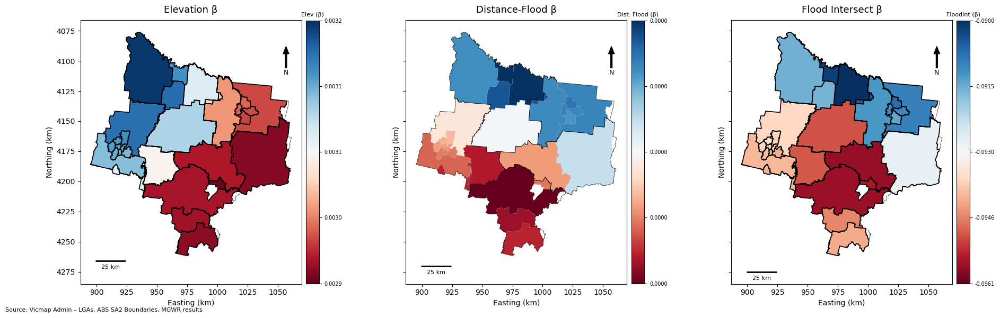

In [90]:
# --- Visualize GWR Coefficients for Key Predictors ---

# Assign local GWR coefficients to GeoDataFrame
coefCols = ['bElevation', 'bDistFlood', 'bFloodIntersection']
gdf[coefCols] = res.params[:, 1:]

# Identify statistically significant coefficients 
tVals = res.filter_tvals()[:, 1:]
sigCols = [f'{c}Sig' for c in coefCols]
gdf[sigCols] = (np.abs(tVals) > 2.09)

titles   = ['Elevation β', 'Distance-Flood β', 'Flood Intersect β']
cbarLabs = ['Elev (β)', 'Dist. Flood (β)', 'FloodInt (β)']
cmap     = 'RdBu'

# Plot coefficient maps with significance outlines
fig, axs = plt.subplots(1, 3, figsize=(19, 6), sharex=True, sharey=True)

for ax, col, ttl, cblab in zip(axs, coefCols, titles, cbarLabs):
    vmin, vmax = gdf[col].min(), gdf[col].max()

    # Plot β value choropleth
    gdf.plot(column=col, cmap=cmap, vmin=vmin, vmax=vmax,
             edgecolor='0.6', linewidth=0.1, legend=False, ax=ax)
    
    # Overlay LGA boundaries
    lgaGDF.boundary.plot(ax=ax, edgecolor='black', linewidth=0.5, alpha=0.85)

    # Highlight significant regions
    gdf[gdf[f'{col}Sig']].boundary.plot(ax=ax, color='black', linewidth=1.2)

    # North arrow
    ax.annotate('N', xy=(0.93, 0.90), xytext=(0.93, 0.80),
                arrowprops=dict(facecolor='black', width=2,
                                headwidth=8, headlength=10),
                ha='center', va='center', xycoords='axes fraction', fontsize=9)

    # Scale bar
    sx = ax.get_xlim()[0] + 12500
    sy = ax.get_ylim()[0] +  5000
    ax.hlines(y=sy, xmin=sx, xmax=sx + 25000, colors='black', linewidth=2)
    ax.text(x=sx + 12500, y=sy - 6500, s='25 km', ha='center', fontsize=8)

    # Axis labels
    ax.set_xlabel('Easting (km)', fontsize=10)
    ax.set_ylabel('Northing (km)', fontsize=10)
    ax.xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f'{x/1000:.0f}'))
    ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda y, _: f'{abs(y)/1000:.0f}'))
    ax.set_title(ttl, fontsize=13, pad=10)

    # Colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin, vmax))
    sm._A = []
    cbar = fig.colorbar(sm, ax=ax, fraction=0.045, pad=0.015)
    cbar.ax.set_title(cblab, fontsize=8, pad=6)
    ticks = np.linspace(vmin, vmax, 5)
    cbar.set_ticks(ticks)
    cbar.set_ticklabels([f'{t:.4f}' for t in ticks])
    cbar.ax.tick_params(labelsize=7)

fig.text(0.01, 0.01,
         'Source: Vicmap Admin – LGAs, ABS SA2 Boundaries, MGWR results',
         fontsize=8, ha='left')
plt.tight_layout()
plt.show()

>
> **Map Interpretation**
>
>  The GWR coefficient map shows spatially varying effects of three predictors on the proportion of schools safe from flood at the SA2 level.
> 
> 
> For **Elevation β**, key findings include: 
> - Blue shades in the **Campaspe and Greater Bendigo** indicates that higher elevation is associated with a greater proportion of flood-safe schools.
> - Red shades in **Greater Shepparton, Strathbogie and Mitchell** means that in those regions, elevation either has no protective effect or other flood drivers dominate
> - Black-outlined areas represent statistically significant β values (|t| > 2.09), highlighting regions where the elevation effect is strongest and most reliable.
> 
> For **Distance to Flood β**, key findings include: 
> - Blue shades in the **Campaspe, Stathbogie and Greater Shepparton** indicates greater distance from flood zones significantly increases school safety.
> - Red shades in **Greater Bendigo and Mitchell** means distance to flood zones has little or no predictive power
> 
> For **Flood Intersect β**, key findings include: 
> - Blue shades in the **Campaspe and Greater Shepparton** means flood zone intersection has positive association with school safety in these areas.
> - Red shades in **Greater Bendigo, Strathbogie, and Mitchell** means schools in flood-intersected zones are less likely to be safe, as expected.
> - SA2s with bold black outlines indicate areas where the relationship between flood intersection and school safety is statistically significant (|t| > 2.09)
> 

### <a id='toc6_1_5_'></a>[Result](#toc0_)

In [91]:
# Compute predicted 'safe' proportion from GWR model
gdf['safePred'] = res.predy.flatten() 

# Invert to derive 'risk' as 1 - predicted safe proportion
gdf['risk'] = 1 - gdf['safePred']
gdf = gdf.drop(columns=['safePred'])

# Classify risk into 3 groups using Natural Breaks (Jenks)
classifier = mapclassify.NaturalBreaks(gdf['risk'], k=3)
gdf['class'] = classifier.yb
gdf['class'] = gdf['class'].map({0: 'Low', 1: 'Medium', 2: 'High'})

# Dissolve polygons by risk class for visualization
bufferRisk = gdf.dissolve(by='class')
bufferRisk = bufferRisk.reset_index()

In [92]:
# GWR risk buffer layer
riskLayer = gdf[['SA2 Name', 'LGA Name', 'seifa', 'totalStudent', 'class', 'geometry']].copy()

# Set CRS and convert to GeoJSON
riskLayer = gpd.GeoDataFrame(riskLayer, geometry='geometry', crs=dataGDF.crs)
riskLayer = riskLayer.to_crs(epsg=4326)
riskLayer['geometry'] = riskLayer['geometry'].simplify(tolerance=0.001, preserve_topology=True)
riskLayer['id'] = riskLayer.index.astype(str)
riskLayer['SA2 Name'] = riskLayer['SA2 Name'].str.title()
riskLayer['LGA Name'] = riskLayer['LGA Name'].str.title()
riskLayer = riskLayer.rename(columns={
    'seifa': 'SEIFA Score',
    'totalStudent': 'Total Students'
})
geojson = json.loads(riskLayer.set_index('id').to_json())

In [93]:
# Plot using Plotly
minx, miny, maxx, maxy = riskLayer.total_bounds
lat = (miny + maxy) / 2
lon = (minx + maxx) / 2

In [94]:
# --- Interactive Choropleth Map of GWR-Based Flood Risk ---

fig = px.choropleth_mapbox(
    riskLayer,
    geojson=geojson,
    locations='id',
    color='class',
    mapbox_style='open-street-map',
    zoom=8,
    center={"lat": lat, "lon": lon},
    opacity=0.7,
    color_discrete_map={
        'High': 'red',
        'Medium': 'orange',
        'Low': 'green'
    },
    hover_data={
        'SA2 Name': True,
        'LGA Name': True,
        'SEIFA Score': True,
        'Total Students': True,
        'id': False,
        'class': False
    }
)

# Layout 
fig.update_layout(
    title={
        'text': "<b>GWR Risk Buffer and SA2 Boundaries</b>",
        'y': 0.98,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="center",
        x=0.5
    ),
    font=dict(family="Arial", size=12),
    autosize=False,
    width=950,
    height=900,
    margin=dict(l=20, r=20, t=80, b=30),
    mapbox=dict(pitch=0, bearing=0),
    paper_bgcolor='white'
)

fig.show()

>
> **Map Interpretation**
>
> This map classifies each SA2 region into Low, Medium, or High flood risk zones based on the risk score we define, helping to assess the scale of impact on school students. 
> 
> 
> From the map, key findings include: 
> - **Red areas (High risk)**: many schools in **Greater Shepparton, Strathbogie, Campaspe and northern Greater Bendigo** are vulnerable. Some of these SA2 like South East Shepparton have larger student populations, amplifying the scale of potential impact if flooding occurs.
> - **Orange areas (Medium risk)**: Western and southern Greater Bendigo have at moderate safety levels, served as transitional areas between red and green zones
> - **Green areas (Low risk):** Low risk areas concentrated in **Mitchell**. Many SA2s like Kilmore and Wallan also have moderate to high student populations, which is a good sign that large student groups are at lower risk.
> 
> 

# <a id='toc7_'></a>[Discussion](#toc0_)

### <a id='toc7_1_1_'></a>[Research Questions and Hypothesis](#toc0_)

This spatial analysis provided insights into each research question. For RQ1, the results indicate that government schools show a noticeable presence in flood-prone zones, rather than being uniformly distributed. Several schools intersect or lie adjacent to designated floodplains, suggesting they may be disproportionately located in flood-prone areas. This supports Hypothesis 1, as the clustering of school sites along streams and catchements implies non-random placement favoring floodplain areas. Historical settlement patterns such as building towns and schools near water sources likely contributed to this pattern.

For RQ2, the analysis reveals a positive spatial association, that is, areas with higher socio-economic disadvantage tend to contain more flood-exposed government schools. This aligns with Hypothesis 2, indicating an environmental equity concern. This finding is consistent with broader research showing low-income communities often reside in high-risk flood zones and suffer disproportionate impacts (Rufat et al., 2015). However, the relationship was not strong everywhere. There are pockets where disadvantaged areas are not highly flood-exposed and vice versa. 

For RQ3, the study found evidence of spatial clustering of vulnerability. Specifically, local cluster analysis (LISA) identified several geographic clusters where
neighboring areas both exhibit high levels of school flood exposure and disadvantage. For example, districts along major rivers in the north-central region showed clusters of highly vulnerable schools, with low elevation, flood intersections, and high disadvantage. This confirms Hypothesis 3. Notably, the clustering of at-risk schools often corresponds to floodplain corridors, illustrating regional hotspot areas requiring attention. A few outlier areas were observed as well.

| **Research Question**                                                                                  | **Hypothesis**                                                                    | **Conclusion**                                                                                                                                                                                                                            |
| ------------------------------------------------------------------------------------------------------ | --------------------------------------------------------------------------------- | ----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- |
| **1.** Are government schools disproportionately located in flood-prone zones?                       | Government schools are disproportionately located in flood-prone zones compared to safer areas.                     | Supported                                                                                              |
| **2.** Is there a spatial association between flood-exposed schools and socio-economic disadvantage? | Flood-exposed schools are more likely to be located in areas of socio-economic disadvantage.                        | Supported |
| **3.** Are there spatial clusters of vulnerable schools?                                             | There are spatial clusters or hotspots where flood-exposed and/or disadvantaged schools are concentrated. | Supported                    |






### <a id='toc7_1_2_'></a>[Density-Based vs. Distance-Based Point Pattern Techniques](#toc0_)


The project applied both density-based and distance-based point pattern techniques to analyze school location patterns. Density-based methods (such as quadrat counts and Kernel Density Estimation) focus on the intensity of points in space, essentially first-order properties of the distribution. Kernel Density Estimation (KDE) produced a smooth density
surface highlighting “hotspots” of school locations in Greater Bendigo and Greater Shepparton. In our case, KDE underscored that school density peaks in certain floodplain towns. However, the outcome depends on the chosen bandwidth and can oversmooth or hide small-scale variations. It provides a general picture of intensity but may blur fine details.

In contrast, distance-based methods examine the spacing between points to assess second-order properties, offering a deeper understanding of clustering or dispersion at multiple scales. We employed metrics like ANN,  Ripley’s K and L function, G and F functions. The ANN ratio in our analysis was significantly less than 1, with p-value < 0.01. This indicates that schools are on average much closer to their nearest neighbor than would be expected in CSR. It's a clear sign of clustering.

In our study, both approaches agreed that the pattern of school locations is clustered rather than random, but they offered different insights. The density maps identified specific
high-density areas, such as Shepparton and Bendigo. This could be overlaid with flood zones to qualitatively assess risk concentrations. The distance-based results provided statistical significance of clustering and quantified the clustering intensity over distance. One challenge with distance-based methods like Ripley’s K is edge effects and computational intensity. It can be slow and requires edge correction for accuracy (Baddeley et al., 2015). In summary, density-based techniques were valuable for visualization and highlighting hotspots, whereas distance-based techniques allowed formal hypothesis testing of clustering and revealed multi-scale patterning.

### <a id='toc7_1_3_'></a>[Spatial Autocorrelation](#toc0_)

In the global autocorrelation, Moran’s I confirmed an overall clustered pattern of vulnerable schools, it does not pinpoint where these clusters or outliers are. We therefore applied Local Indicators of Spatial Association (LISA) to identify significant local clusters and spatial outliers. A cluster was evident in the mid-Goulburn River catchment, where multiple neighboring SA2s like Shepparton all showed elevated school flood risk and high disadvantage, reinforcing each other’s vulnerability. In our
case, both global and local measures aligned in showing clustering, but the LISA provided the spatial diagnosis of cluster locations. This reflects a general principle that global analysis assumes one homogenous process, while local analysis allows that relationships differ by location (Aryal, 2015).

### <a id='toc7_1_4_'></a>[Vulnerability Risk Score](#toc0_)



A custom risk score was developed to quantify each school’s flood vulnerability, incorporating 5 factors. The intent was to create a composite index of flood vulnerability for schools that accounts for both hydrological exposure and site-specific characteristics. However, it is important to critically evaluate the design of this risk score. One limitation is the simplicity of how factors are combined. We assume each factor was of equal importance. In reality, not all factors contribute equally to
risk, for instance, a school barely on the fringe of a mapped flood zone is treated the same as one at the river’s edge.  Another concern is potential redundancy or correlation among factors. Several components of the score are related to flooding and might co-occur. The score might be double-counting the same underlying risk. This could exaggerate the vulnerability of some schools without truly adding independent information.

In future work, a more robust approach could involve weighting factors by their estimated impact or performing a sensitivity analysis to see how changes in factor definitions affect the scores. Moreover, linking the score with actual observed flood outcomes could help validate and calibrate it (Chakraborty et al., 2025).

### <a id='toc7_1_5_'></a>[Geographically Weighted Regression](#toc0_)

An integral part of evaluating flood risk was analyzing the watersheds upstream of each school. By delineating catchment areas and drainage lines, we could identify schools
with large upstream basins or those situated in low-lying drainage depressions. 

To further probe the relationship between school distribution and environmental factors, we employed GWR. The GWR results revealed notable spatial heterogeneity in the relationships. We found a strong negative coefficient on elevation in parts of the Goulburn Valley. It showed that SA2s at lower elevations has highly concentrated governmnet schools. Also, distance to flood zones also had a negative coefficient. Areas closer to large rivers had more government schools proportionally. In contrast, in the central highlands region, the same variables’ coefficients were weak or even opposite. Some higher-elevation, more urbanized SA2s (like a regional suburb center on relatively higher ground) had a lower proportion of government schools. Yet,  they are not flood-prone, indicating elevation alone isn’t driving that. In essence, GWR confirmed that the association between school location characteristics and flood risk is not uniform region-wide. This aligns with findings in literature that social or infrastructural variables can have spatially heterogeneous relationships with flood exposure. One limitation of our GWR is the relatively small number of SA2 observations. There is a risk of overfitting local noise.

In summary, the watershed analysis enriched our understanding of physical flood drivers at each school site, and the GWR analysis enriched our understanding of how the spatial distribution of government schools correlates with environmental factors in a location-specific way. Together, these advanced techniques strengthen the case that flood vulnerability of schools is influenced by both natural and socio-spatial processes that vary across the landscape.


### <a id='toc7_1_6_'></a>[Limitation](#toc0_)


The time-invariance of our analysis is a limitation. We took a snapshot of schools and current flood risk. We did not account for climate change projections, which are highly relevant for sustainability. Flood hazards in this region may worsen with climate change. Our analysis also didn’t consider temporal aspects like the age of school infrastructure and relocation efforts. A dynamic analysis incorporating change over time or scenario projections would be beneficial for flood management.

Another limitation is the risk score we used. As discussed, it's a simplified construct that does not encompass all dimensions of vulnerability. It omits factors like emergency preparedness, quality of school construction, or the adaptive capacity of school administrations. Social vulnerability was only indirectly accounted for. 

Further research can address these limitations. Incorporating additional data layers like school building floor heights and presence of mitigation infrastructure could refine the risk assessment. A study encompassing all school types would allow an equity analysis of the entire education sector’s exposure. It would be insightful to examine if private schools systematically enjoy safer locations. In terms of method, applying a multivariate spatial regression could formally test the influence of disadvantage on flood risk while accounting for spatial autocorrelation, complementing the GWR exploration.

# <a id='toc8_'></a>[Sustainability](#toc0_)

In the Sustainability Plan 2030, University of Melbourne has committed to aligning its research with the Sustainable Development Goals. Our project exemplifies this alignment by tackling challenges at the nexus of climate resilience (flood risk), quality education, and social equity.

The findings of this project have direct implications for the SDG4 (Quality Education), particularly target 4.a which calls for building and upgrading education facilities to provide safe and effective learning environments for all (United Nations, n.d.). Our analysis revealed that many government
schools in North Central Victoria are located in flood-prone zones, meaning their learning environments are at risk of severe disruption. Moreover, we found that disadvantaged communities often have the most flood-exposed schools connects to equity in education. Addressing these disparities by improving the flood resilience of schools is therefore part and parcel of achieving SDG 4’s mandate of inclusive education.

This project is also aligned with SDG 11 (Sustainable Cities and Communities), which strives to make human settlements inclusive, safe, resilient, and sustainable. Our finding of clustered school flood vulnerability highlights specific communities that are not resilient. Target 11.5 of SDG 11 explicitly aims to reduce the number of people affected by
water-related disasters and to decrease economic losses, with special focus on protecting the poor and vulnerable (United Nations, n.d). By identifying these at-risk schools, our study points toward where interventions could substantially reduce disaster impact, supporting SDG 11.5 indicators of protecting critical infrastructure and basic services. 


According to our findings, recommendations to improve flood resilience and promote social equity in school infrastructure planning are: 
- Prioritize at-risk schools for upgrades
- Integrate flood risk into school site selection
- Address social vulnerability through funding
- Incorporate emergency response plan for flood event

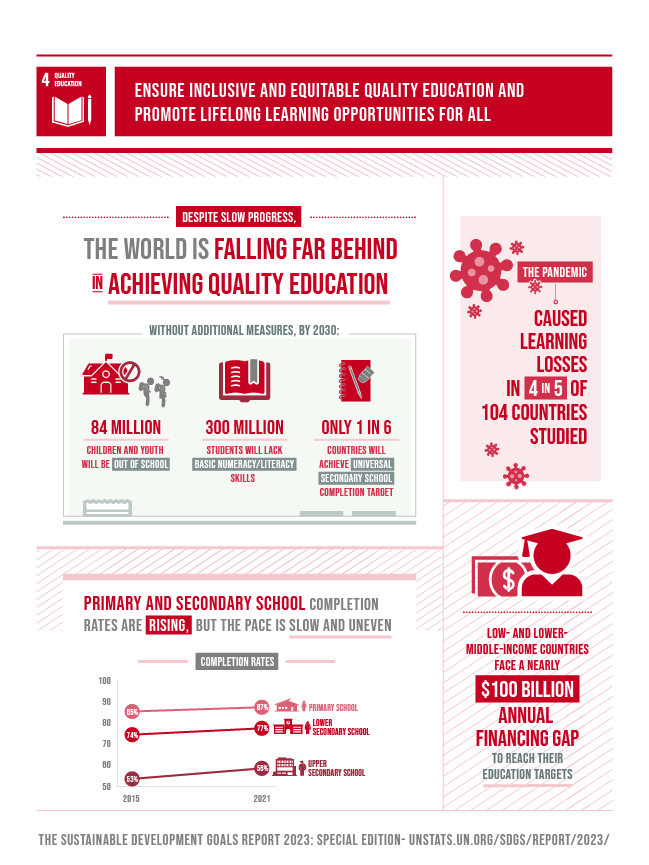
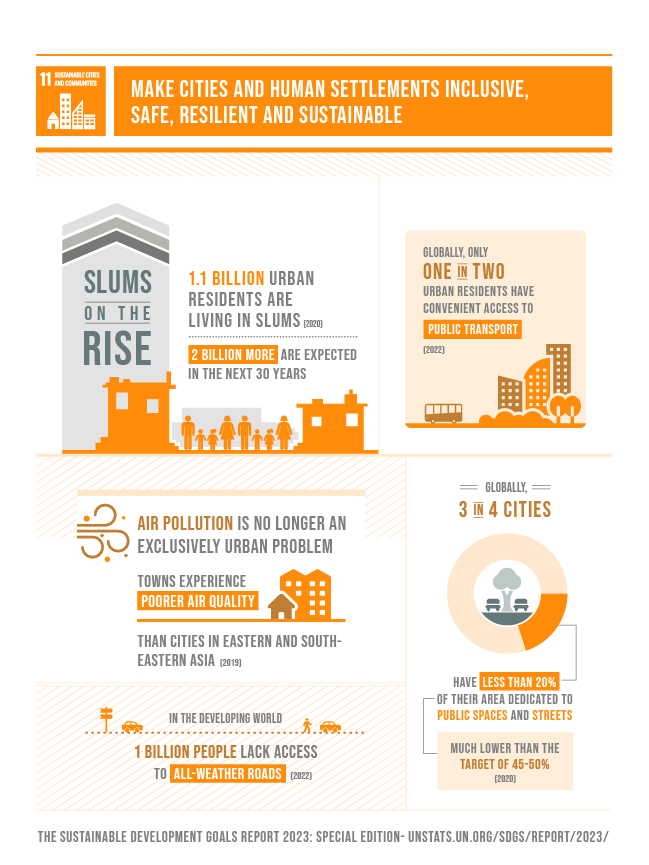

*Note. Adapted from “The Sustainable Development Goals Report 2022” (Goal 4 infographic) and “The Sustainable Development Goals Report 2023” (Goal 11 infographic), by United Nations, 2022, 2023, United Nations Statistics Division (https://unstats.un.org/sdgs/report/2022/; https://unstats.un.org/sdgs/report/2023/). Copyright © 2022 & 2023 United Nations.*

___

# <a id='toc9_'></a>[Conclusion](#toc0_)

This project has examined the flood vulnerability of government schools in North Central Victoria. The results support our hypotheses defined in the study. We
identified distinct geographic clusters of high vulnerability schools, which are essentially hotspots of risk that demand targeted policy attention. We hope through combining geospatial data, statistical analysis, and sustainability frameworks, this work could provide an in-depth understanding of the school safety in terms of flood Exposure and socio-economic disadvantage in North Central Victoria.

___

# <a id='toc10_'></a>[References](#toc0_)

[1] Department of Education and Training, *School Locations 2024 (Victoria)* [Data set], 2024. [Online]. Available: https://www.education.vic.gov.au/Documents/about/research/datavic/dv309_schoollocations2021.csv

[2] Department of Environment, Land, Water & Planning, *Vicmap Admin – Local Government Area (LGA) Polygon Aligned to Topographic Features* [Data set], May 30, 2025. [Online]. Available: https://datashare.maps.vic.gov.au/search?q=uuid%3Dbc822a9c-3766-57ac-a034-bcad3fb66d86

[3] Department of Transport and Planning, *Vicmap Elevation DEM 10m* [Data set], 2016. [Online]. Available: https://datashare.maps.vic.gov.au/search?q=uuid%3D2fd9d712-5407-51df-bc75-bb13d37499af

[4] Victorian Department of Environment and Primary Industries, *Victoria – 1 in 100 Year Flood Extent* [Data set], Mar. 30, 2016. [Online]. Available: https://data.gov.au/data/dataset/b02df5ce-3c17-4948-8869-776ad49a4b82

[5] Australian Bureau of Statistics, *Socio-Economic Indexes for Areas (SEIFA), Australia, 2021* [Data set], 2021. [Online]. Available: https://www.abs.gov.au/statistics/people/people-and-communities/socio-economic-indexes-areas-seifa-australia/latest-release

[6] Australian Bureau of Statistics, *2021 General Community Profile – Statistical Area Level 2 (SA2), Victoria* [Data set], 2021. [Online]. Available: https://www.abs.gov.au/census/find-census-data/datapacks

[7] Australian Bureau of Statistics, *Australian Statistical Geography Standard (ASGS): Edition 3 – Digital Boundary Files* [Data set], Jul. 2021 – Jun. 2026. [Online]. Available: https://www.abs.gov.au/statistics/standards/australian-statistical-geography-standard-asgs-edition-3/jul2021-jun2026/access-and-downloads/digital-boundary-files

[8] Reckien, D., & Heiskanen, E. (2021). Equity, environmental justice, and climate change adaptation: Exploring the linkages and advancing the debate. Climatic Change, 167(3–4), Article 59. https://doi.org/10.1007/s10584-021-03059-3

[9] Department of Environment, Land, Water and Planning. (2016). Victorian floodplain management strategy: Parts 1 to 5. Victorian Government. https://www.water.vic.gov.au/__data/assets/pdf_file/0032/661739/victorian-floodplain-management-strategy-part-1-to-5.pdf

[10] Deloitte Access Economics. (2023). Cost of the October 2022 Victorian flood event: Final report [Prepared for Moira Shire Council]. Parliament of Victoria. https://www.parliament.vic.gov.au/49604a/contentassets/af5f665989af4facaa09a886d56ce0b0/reply-1.-qon-moira-shire-council-attach-1-deloitte_report_final-draft_august2023.pdf

[11] Ahmad, B. (2018). The role of socio-economic status in vulnerability to flood hazard. Academia.edu. https://www.academia.edu/37804191/The_Role_of_Socio_Economic_Status_in_Vulnerability_to_Flood_Hazard

[12] Schwarz, I., & Kuleshov, Y. (2022). Flood vulnerability assessment and mapping: A case study for Australia’s Hawkesbury–Nepean catchment. Remote Sensing, 14(19), 4894. https://doi.org/10.3390/rs14194894

[13] Esri. (n.d.). How Average Nearest Neighbor Distance (Spatial Statistics) works (ArcGIS Pro help documentation). Retrieved June 7, 2025, from https://pro.arcgis.com/en/pro-app/latest/tool-reference/spatial-statistics/h-how-average-nearest-neighbor-distance-spatial-st.htm

[14] Rufat, S., Tate, E., Burton, C., & Maroof, A. S. (2015). Social vulnerability to floods: Review of case studies and implications for measurement. International Journal of Disaster Risk Reduction, 14, 470–486.

[15] Baddeley, A., Rubak, E., & Turner, R. (2015). Spatial Point Patterns: Methodology and Applications with R. Chapman and Hall/CRC.

[16] Aryal, J. (2025). Lecture slides for Spatial Data Analytics (GEOM 90006) [Lecture slides]. University of Melbourne.

[17] Chakraborty, J., Collins, T. W., & Grineski, S. E. (2025). Spatial heterogeneity in social vulnerability to flood exposure. Natural Hazards. Advance online publication. https://doi.org/10.1007/s11069-025-07302-3

[18] United Nations Development Programme. (n.d.). Goal 4: Quality education. Retrieved June 7, 2025, from https://www.undp.org/sustainable-development-goals/quality-education

[19] United Nations Department of Economic and Social Affairs. (n.d.). Goal 11: Make cities and human settlements inclusive, safe, resilient and sustainable. Retrieved June 18, 2025, from https://sdgs.un.org/goals/goal11

[20] University of Melbourne. (2020). Sustainability plan 2030. https://about.unimelb.edu.au/__data/assets/pdf_file/0020/346214/Sustainability-Plan-2030.pdf

[21] UNESCO. (n.d.). Target 4.A: Education facilities and learning environments. UNESCO Global Education Monitoring Report. Retrieved June 18, 2025, from https://gem-report-2016.unesco.org/en/chapter/target-4-a-education-facilities-and-learning-environments/

___